In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import Data_v2
import Data_analysis_func
import Model_checks
import seaborn as sns
from scipy.stats import multivariate_normal
from sklearn.linear_model import LinearRegression
import Outlier_detection_v2
import Genes_self_similarity_v2
from matplotlib_venn import venn2, venn2_circles
import Feature_engineering
import Clusters
from tqdm import tqdm

In [3]:
data = Data_v2.get_format_data_without_na()
data_norm_flagged = pd.read_csv('database_phase_1_after_preprocessing_07_23_2024.csv', index_col=0)

In [819]:
y2 = data_norm_flagged[(data_norm_flagged['outlier_divergent_end_down_y2'] == True) & (data_norm_flagged['light_regime'] == '1min-1min')].sort_values(by='sum_end_down_y2', ascending=False).filter(like='y2_').iloc[i:i+2].values

In [9]:
data_norm_flagged['flag_y2'].value_counts()

flag_ynpq
ok       32936
weird    20587
Name: count, dtype: int64

In [861]:
cov = Outlier_detection_v2.mean_cov_y2_WT_v2(data_norm_flagged, '20h_HL', plot=False)

In [10]:
time_series_data = data_norm_flagged[(data_norm_flagged['light_regime'] == '20h_HL')].filter(like='y2_').dropna(axis=1).values

In [11]:
data_norm_flagged[(data_norm_flagged['light_regime'] == '20h_HL')]

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,...,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq
1170,2,M3,2023-10-20,20h_HL,19.047878,24.634703,84,0,1,0.036723,...,0.017695,0.001386,None,None,3,0.614899,0.503979,0.050617,weird,ok
1171,2,M3,2023-10-20,20h_HL,19.047878,24.634703,84,0,2,-0.084708,...,-0.034208,-0.148092,None,None,4,0.614899,0.503979,0.050617,ok,weird
1172,2,M3,2023-10-20,20h_HL,19.047878,24.634703,84,0,2,-0.084708,...,-0.034208,-0.148092,None,None,1,0.614899,0.503979,0.050617,ok,ok
1173,2,M3,2023-10-20,20h_HL,19.047878,24.634703,84,0,3,0.015755,...,-0.050648,0.086080,None,None,5,0.614899,0.503979,0.050617,weird,weird
1174,2,M3,2023-10-20,20h_HL,19.047878,24.634703,84,0,4,0.072098,...,-0.039404,0.124099,None,None,2,0.614899,0.503979,0.050617,ok,weird
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47946,20,M2,2024-04-07,20h_HL,15.205273,25.159379,84,15,19,-0.030887,...,-0.030995,0.014955,None,None,4,0.622034,0.498650,0.002148,ok,ok
47947,20,M2,2024-04-07,20h_HL,15.205273,25.159379,84,15,20,0.029982,...,0.005709,0.046509,None,None,8,0.622034,0.498650,0.002148,weird,weird
47948,20,M2,2024-04-07,20h_HL,15.205273,25.159379,84,15,21,-0.004711,...,-0.067749,0.071521,None,None,11,0.622034,0.498650,0.002148,ok,weird
47949,20,M2,2024-04-07,20h_HL,15.205273,25.159379,84,15,22,-0.041372,...,-0.009052,-0.051147,None,None,2,0.622034,0.498650,0.002148,ok,weird


In [177]:
time_series_noisy = time_series_data[0]

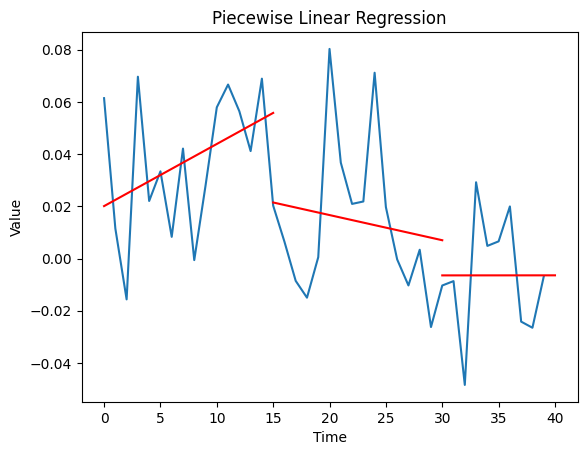

In [178]:
Feature_engineering.plot_segments(time_series_noisy, segment_length=15)

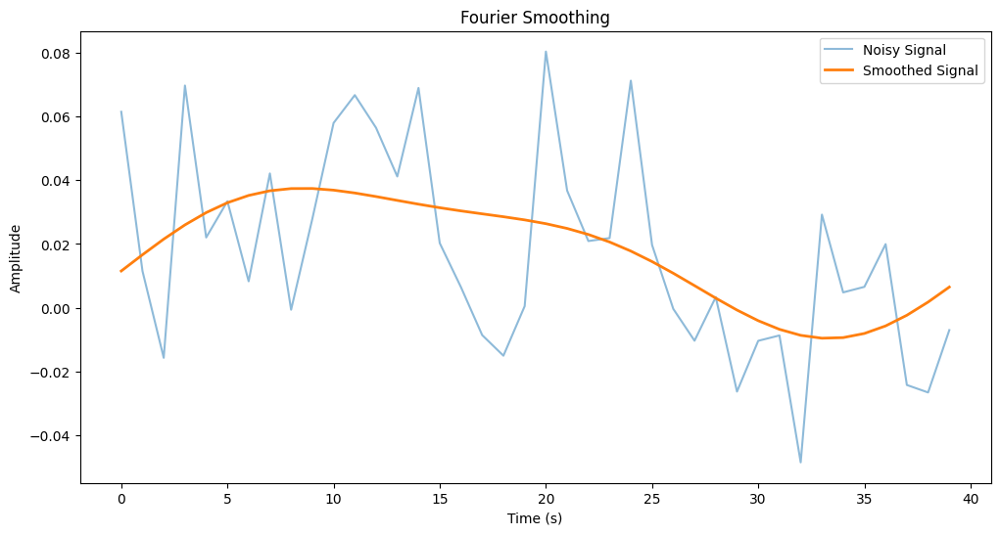

In [412]:
import numpy as np
import matplotlib.pyplot as plt

time = np.arange(len(time_series_data[0]))
noisy_signal = time_series_data[0]

# Perform Fourier transform
fft_signal = np.fft.fft(noisy_signal)
frequencies = np.fft.fftfreq(len(time), time[1] - time[0])

# Apply a low-pass filter
cutoff_frequency = 0.05  # Hz
fft_signal[np.abs(frequencies) > cutoff_frequency] = 0

# Perform inverse Fourier transform
smoothed_signal = np.fft.ifft(fft_signal)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(time, noisy_signal, label='Noisy Signal', alpha=0.5)
plt.plot(time, smoothed_signal.real, label='Smoothed Signal', linewidth=2)
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Fourier Smoothing')
plt.show()


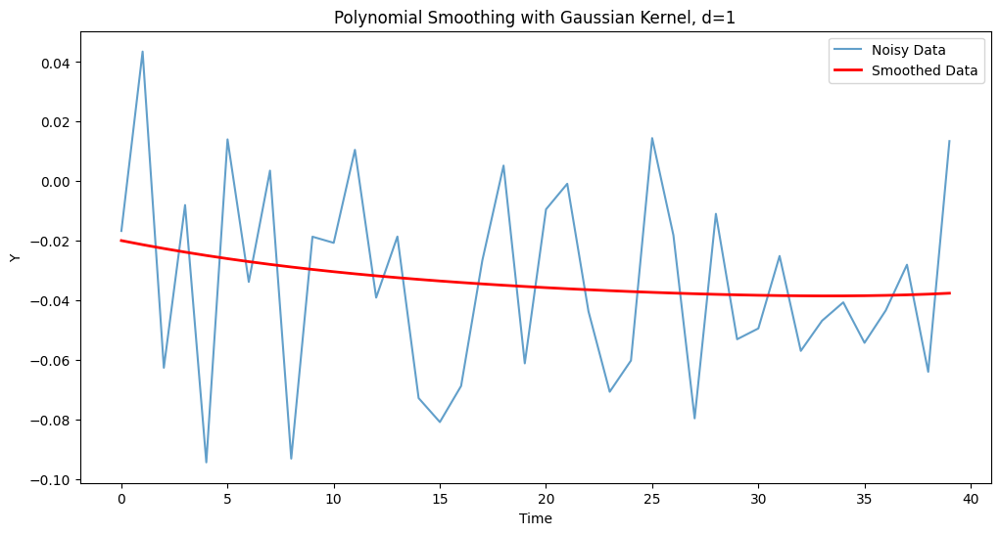

In [430]:
import numpy as np
from scipy.ndimage import gaussian_filter1d
from localreg import *

def kernel_smooth(data, sigma=1.0):
    smoothed_data = gaussian_filter1d(data, sigma)
    return smoothed_data

# Example usage:
# Generate noisy data
np.random.seed(0)
# data_norm_features.sort_values('div_y2', ascending=True).iloc[:10]
x = np.arange(len(time_series_data[1]))
y_noisy = time_series_data[1]
y_noisy_WT = data_norm_flagged[(data_norm_flagged['mutant_ID'] == 'WT') & (data_norm_flagged['light_regime'] == '20h_HL')].filter(like='y2_').iloc[:1].dropna(axis=1).values[0]

# Smooth the noisy data using Gaussian kernel
# y_smoothed = kernel_smooth(time_series_data[0], sigma=10)

# Smooth the noisy data using polynomial fit 
# y_smoothed = np.poly1d(np.polyfit(x, y_noisy, 3))(x)

y_smoothed = localreg(x, y_noisy, degree=1, kernel=rbf.gaussian, radius=12)

plt.figure(figsize=(12, 6))
# plt.plot(y_noisy_WT, label='Noisy Data', alpha=0.7)
# plt.plot(y_smoothed, label='Smoothed Data', color='red', linewidth=2)
plt.plot(y_noisy, label='Noisy Data', alpha=0.7)
plt.plot(y_smoothed, label='Smoothed Data', color='red', linewidth=2)
plt.legend()
plt.title('Polynomial Smoothing with Gaussian Kernel, d=1')
plt.xlabel('Time')
plt.ylabel('Y')
plt.show()

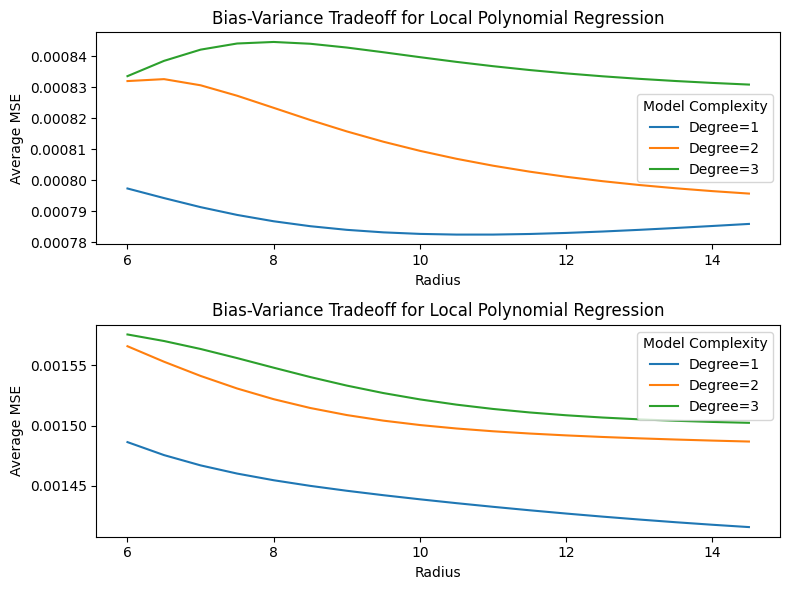

In [435]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from localreg import rbf
from localreg import localreg

# make a fig with 10 subplots
fig, axs = plt.subplots(2, figsize=(8, 6))

for i in range(2):
    X = np.arange(len(time_series_data[i]))
    y = time_series_data[i]

    # Define a range of polynomial degrees and bandwidths to evaluate
    degrees = [1, 2, 3]  # Polynomial degrees (1=linear, 2=quadratic, 3=cubic)
    radius = np.arange(6, 15, 0.5)  # Bandwidth values

    # Prepare for cross-validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation

    # Perform cross-validation and evaluate different models
    results = {}

    for degree in degrees:
        for rad in radius:
            mse_scores = []
            
            for train_index, val_index in kf.split(X):
                X_train, X_val = X[train_index], X[val_index]
                y_train, y_val = y[train_index], y[val_index]
                
                y_smoothed = localreg(X_train, y_train, degree=degree, kernel=rbf.gaussian, radius=rad)
                y_pred = np.interp(X_val, X_train, y_smoothed)  # Interpolate for validation set
                
                # Compute MSE
                mse = mean_squared_error(y_val, y_pred)
                mse_scores.append(mse)
            
            # Calculate average MSE across folds
            avg_mse = np.mean(mse_scores)
            results[(degree, rad)] = avg_mse

    # Print results
    # print("Cross-validation results:")
    for params, avg_mse in results.items():
        degree, rad = params
        # print(f"Degree={degree}, Radius={rad:.2f}, Avg. MSE={avg_mse:.4f}")

    # Plot bias-variance tradeoff (average MSE vs. model complexity)
    avg_mse_values = np.array(list(results.values()))
    avg_mse_values = avg_mse_values.reshape(len(degrees), len(radius))

    # Find the optimal parameters (degree, radius) that minimize MSE
    optimal_params = min(results, key=results.get)
    optimal_degree, optimal_radius = optimal_params
    min_avg_mse = results[optimal_params]

    # # Print results
    # print(f"Optimal Degree: {optimal_degree}, Optimal Radius: {optimal_radius}")
    # print(f"Min Average MSE: {min_avg_mse:.4f}")

    # Plot the bias-variance tradeoff
    ax = axs[i]
    for j, degree in enumerate(degrees):
        ax.plot(radius, avg_mse_values[j, :], label=f'Degree={degree}')
    ax.set_title('Bias-Variance Tradeoff for Local Polynomial Regression')
    ax.set_xlabel('Radius')
    ax.set_ylabel('Average MSE')
    ax.legend(title='Model Complexity')

plt.tight_layout()

In [702]:
# Define a range of polynomial degrees and bandwidths to evaluate
degree = 1 # Polynomial degrees (1=linear, 2=quadratic, 3=cubic)
radius = np.arange(6, 15, 0.5)  # Bandwidth values

optimal_params = {}
results = {}

for light in tqdm(data_norm_flagged['light_regime'].unique()):
    # Perform cross-validation and evaluate different models
    results_light = {}
    params_radius = []

    time_series_data = data_norm_flagged[(data_norm_flagged['light_regime'] == light)].filter(regex=r'^y2_\d+$').dropna(axis=1).values

    kf = KFold(n_splits=2, shuffle=True, random_state=42)

    for rad in radius:
        for i in range(len(time_series_data)):
            X = np.arange(len(time_series_data[i]))
            y = time_series_data[i]
            mse_scores = []
            
            for train_index, val_index in kf.split(X):
                X_train, X_val = X[train_index], X[val_index]
                y_train, y_val = y[train_index], y[val_index]
                
                y_smoothed = localreg(X_train, y_train, degree=degree, kernel=rbf.gaussian, radius=rad)
                y_pred = np.interp(X_val, X_train, y_smoothed)  # Interpolate for validation set
                
                # Compute MSE
                mse = mean_squared_error(y_val, y_pred)
                mse_scores.append(mse)
            
        # Calculate average MSE across folds
        avg_mse = np.mean(mse_scores)
        results_light[rad] = avg_mse

    # Find the optimal parameters (degree, radius) that minimize MSE
    optimal_radius_light = min(results_light, key=results_light.get)
    min_avg_mse = results_light[optimal_radius_light]
    results[light] = results_light
    optimal_params[light] = optimal_radius_light

100%|██████████| 6/6 [1:07:52<00:00, 678.80s/it] 


In [703]:
optimal_params

{'1min-1min': 14.5,
 '10min-10min': 14.5,
 '20h_HL': 6.0,
 '20h_ML': 14.5,
 '2h-2h': 6.0,
 '30s-30s': 10.0}

In [670]:
# Define a range of polynomial degrees and bandwidths to evaluate
degree = 1 # Polynomial degrees (1=linear, 2=quadratic, 3=cubic)
radius = np.arange(6, 15, 0.5)  # Bandwidth values

optimal_params = {}

for light in data_norm_flagged['light_regime'].unique():
    # Perform cross-validation and evaluate different models
    results = {}
    params_radius = []
    mse_list = []

    time_series_data = data_norm_flagged[(data_norm_flagged['light_regime'] == light)].filter(regex=r'^y2_\d+$').dropna(axis=1).values

    kf = KFold(n_splits=2, shuffle=True, random_state=42)

    for i in tqdm(range(len(time_series_data))):
        X = np.arange(len(time_series_data[i]))
        y = time_series_data[i]
        for rad in radius:
            mse_scores = []
            
            for train_index, val_index in kf.split(X):
                X_train, X_val = X[train_index], X[val_index]
                y_train, y_val = y[train_index], y[val_index]
                
                y_smoothed = localreg(X_train, y_train, degree=degree, kernel=rbf.gaussian, radius=rad)
                y_pred = np.interp(X_val, X_train, y_smoothed)  # Interpolate for validation set
                
                # Compute MSE
                mse = mean_squared_error(y_val, y_pred)
                mse_scores.append(mse)
            
            # Calculate average MSE across folds
            avg_mse = np.mean(mse_scores)
            results[rad] = avg_mse

        # Find the optimal parameters (degree, radius) that minimize MSE
        optimal_radius = min(results, key=results.get)
        params_radius.append(optimal_radius)
        min_avg_mse = results[optimal_radius]
        mse_list.append(min_avg_mse)

    optimal_params[light] = np.mean(params_radius)

100%|██████████| 7235/7235 [4:14:20<00:00,  2.11s/it]     


In [672]:
optimal_params_df = pd.DataFrame([optimal_params])

In [705]:
optimal_params_df

,1min-1min,10min-10min,20h_HL,20h_ML,2h-2h,30s-30s
0,12.978751,12.879058,11.156146,11.040161,12.633559,12.593642


In [673]:
optimal_params_df.to_csv('optimal_radius_smoothing')

Cross-validation results:


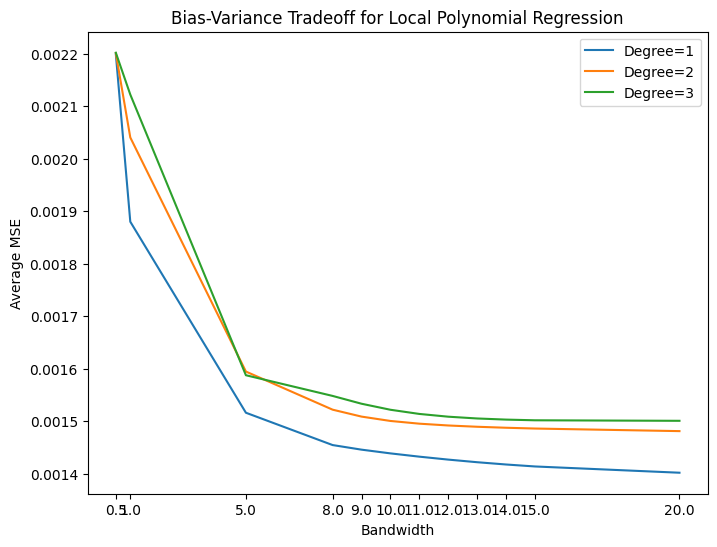

Optimal Radius: 20.00


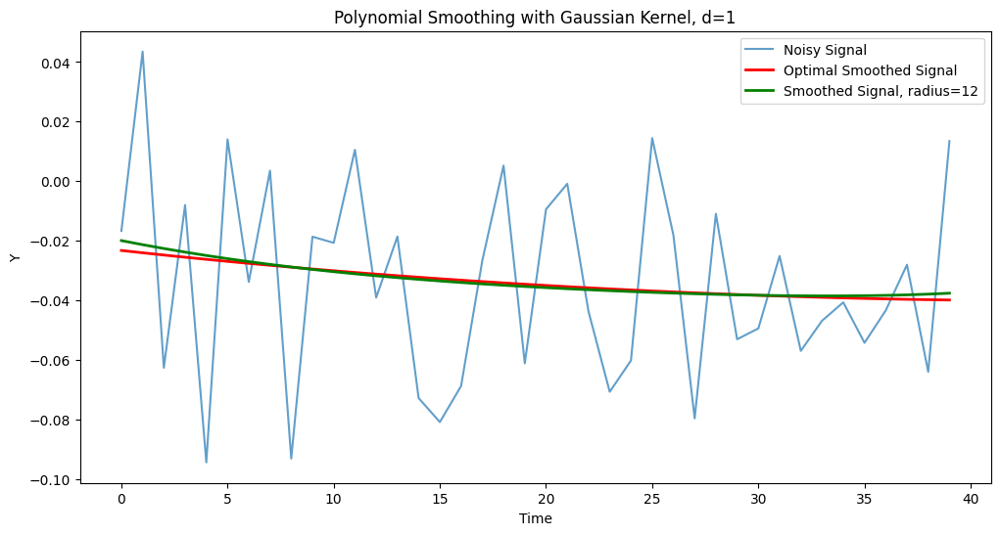

In [793]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

time_series_noisy = data_norm_flagged[(data_norm_flagged['light_regime'] == '20h_HL')].filter(regex=r'^y2_\d+$').dropna(axis=1).values[1]

X = np.arange(len(time_series_noisy))
y = time_series_noisy

# Define a range of polynomial degrees and bandwidths to evaluate
degrees = [1, 2, 3]  # Polynomial degrees (1=linear, 2=quadratic, 3=cubic)
radius = [0.5, 1, 5, 8, 9, 10, 11, 12, 13, 14, 15, 20]  # Bandwidth values

# Prepare for cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)  # 5-fold cross-validation

# Perform cross-validation and evaluate different models
results = {}

for degree in degrees:
    for rad in radius:
        mse_scores = []
        
        for train_index, val_index in kf.split(X):
            X_train, X_val = X[train_index], X[val_index]
            y_train, y_val = y[train_index], y[val_index]
            
            y_smoothed = localreg(X_train, y_train, degree=degree, kernel=rbf.gaussian, radius=rad)
            y_pred = np.interp(X_val, X_train, y_smoothed)  # Interpolate for validation set
            
            # Compute MSE
            mse = mean_squared_error(y_val, y_pred)
            mse_scores.append(mse)
        
        # Calculate average MSE across folds
        avg_mse = np.mean(mse_scores)
        results[(degree, rad)] = avg_mse

# Print results
print("Cross-validation results:")
for params, avg_mse in results.items():
    degree, rad = params
    # print(f"Degree={degree}, Radius={rad:.2f}, Avg. MSE={avg_mse:.4f}")

# Plot bias-variance tradeoff (average MSE vs. model complexity)
avg_mse_values = np.array(list(results.values()))
avg_mse_values = avg_mse_values.reshape(len(degrees), len(radius))

plt.figure(figsize=(8, 6))
for i, degree in enumerate(degrees):
    plt.plot(radius, avg_mse_values[i, :], label=f'Degree={degree}')
plt.title('Bias-Variance Tradeoff for Local Polynomial Regression')
plt.xlabel('Bandwidth')
plt.ylabel('Average MSE')
plt.xticks(radius)
plt.legend()
plt.show()

# plot the origial time-series aling with the smoothed one
optimal_rad = optimal_radius = min(results, key=results.get)[1]
print(f"Optimal Radius: {optimal_rad:.2f}")
y_smoothed = localreg(X, y, degree=1, kernel=rbf.gaussian, radius=optimal_rad)
y_smoothed_10 = localreg(X, y, degree=1, kernel=rbf.gaussian, radius=12)
plt.figure(figsize=(12, 6))
plt.plot(X, y, label='Noisy Signal', alpha=0.7)
plt.plot(X, y_smoothed, label='Optimal Smoothed Signal', color='red', linewidth=2)
plt.plot(X, y_smoothed_10, label='Smoothed Signal, radius=12', color='green', linewidth=2)
plt.legend()
plt.title('Polynomial Smoothing with Gaussian Kernel, d=1')
plt.xlabel('Time')
plt.ylabel('Y')
plt.show()

In [29]:
data_norm_features = Feature_engineering.extract_features(data_norm_flagged)

100%|██████████| 53523/53523 [06:33<00:00, 136.05it/s]


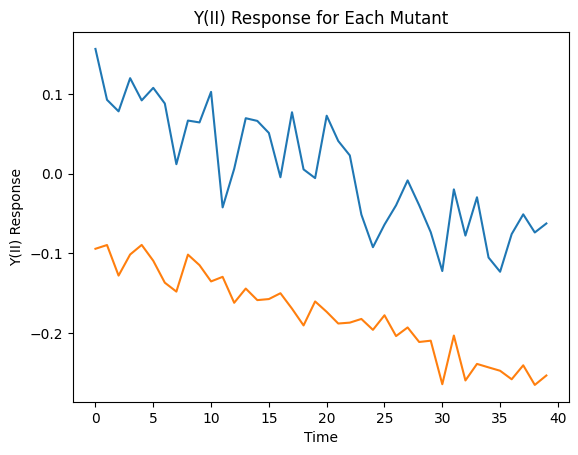

In [189]:
Data_analysis_func.plot_y2(data_norm_features[(data_norm_features['light_regime'] == '20h_HL')].sort_values('abs_var_y2', ascending=False).iloc[:2])

In [7]:
data_smoothed = Data_v2.get_smooth_data(data_norm_flagged, method='local')

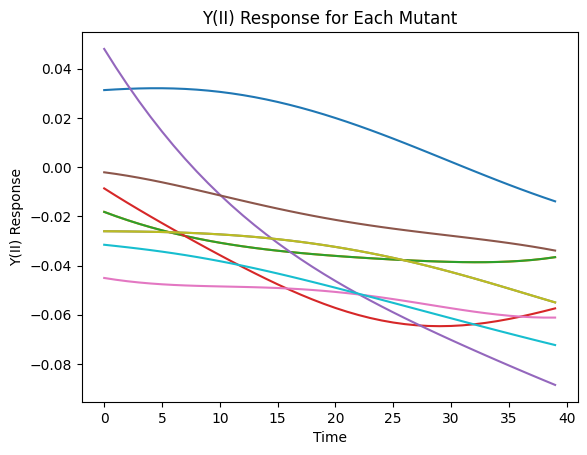

In [46]:
Data_analysis_func.plot_y2(data_smoothed[(data_smoothed['light_regime'] == '20h_HL')].iloc[:10])

In [197]:
data_smoothed[(data_smoothed['light_regime'] == '1min-1min')].sort_values('abs_var_y2', ascending=False).iloc[:3]

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,...,Kurtosis_ynpq,Linear_coef_ynpq,Quadratic_coef_ynpq,abs_var_ynpq,div_ynpq,Max_slope_ynpq,cluster_umap,cluster_pca,outlier_abs_var_y2,outlier_mean_reduced_v2_y2
9815,7,M1,2023-11-17,1min-1min,17.945651,26.886477,164,15,14,-0.085936,...,0.254882,-0.000333,2.927423e-05,0.202926,0.155394,0.007796,4,2,True,True
9525,7,M1,2023-11-17,1min-1min,17.945651,26.886477,164,4,5,0.077523,...,0.315556,0.000740,-9.762039e-07,0.062631,0.060927,0.001803,4,2,True,True
9526,7,M1,2023-11-17,1min-1min,17.945651,26.886477,164,4,5,0.077523,...,0.315556,0.000740,-9.762039e-07,0.062631,0.060927,0.001803,4,2,True,True


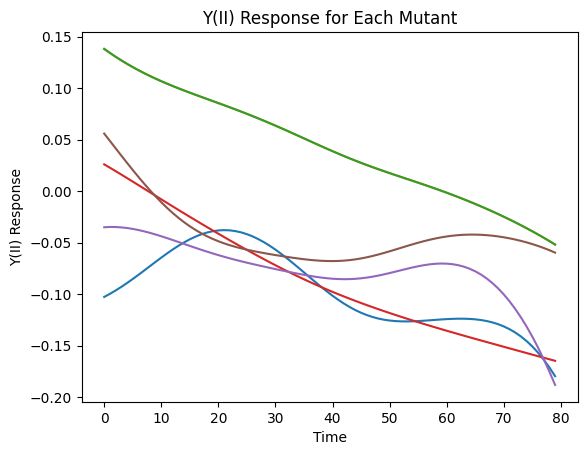

In [200]:
Data_analysis_func.plot_y2(data_smoothed[(data_smoothed['light_regime'] == '1min-1min')].sort_values('abs_var_y2', ascending=False).iloc[:6])

In [96]:
data_norm_features[(data_norm_features['light_regime'] == '1min-1min')].sort_values('abs_var_y2', ascending=False).iloc[109:110]['mutant_ID']

9791    LMJ.RY0402.150972
Name: mutant_ID, dtype: object

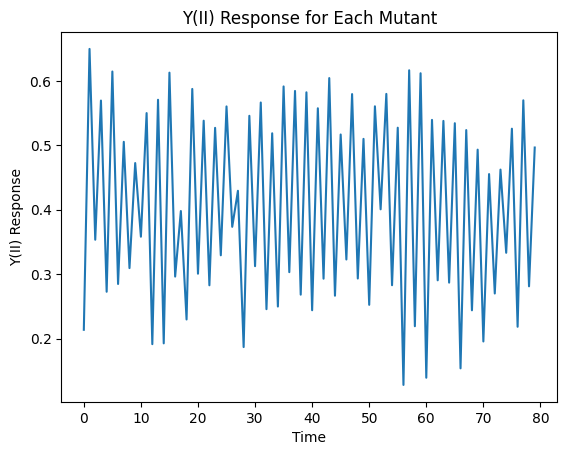

In [97]:
Data_analysis_func.plot_y2(data[(data['mutant_ID'] == 'LMJ.RY0402.150972') & (data['light_regime'] == '1min-1min')])

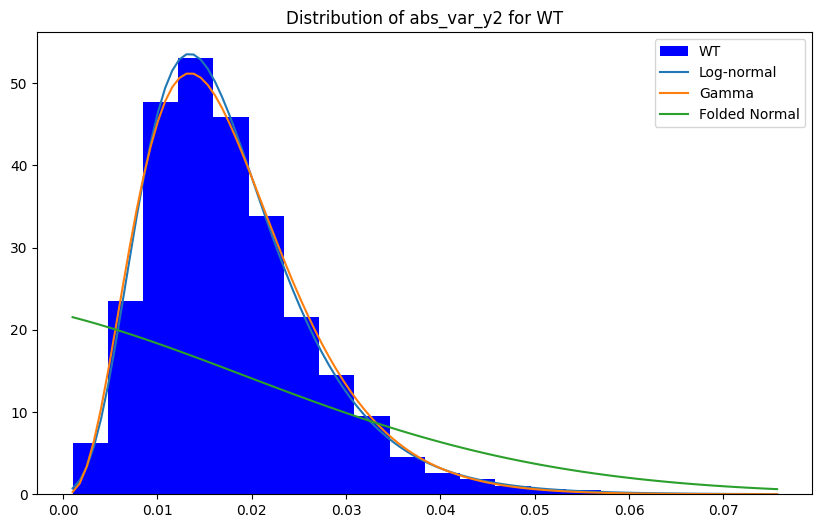

In [714]:
import seaborn as sns
import scipy.stats as stats

# Extract the 'abs_var_y2' values for WT
abs_var_y2_WT = data_smoothed[(data_smoothed['mutant_ID'] == 'WT')]['abs_var_y2'].values

# Compute the mean and standard deviation of the 'abs_var_y2' values for WT
mean_abs_var_y2_WT = abs_var_y2_WT.mean()
std_abs_var_y2_WT = abs_var_y2_WT.std()

# Generate a range of x values
x = np.linspace(min(abs_var_y2_WT), max(abs_var_y2_WT), 100)

# Compute the density of the absolute value of known distributions to test the fit of the data
# Fit folded normal distribution
shape_folded, loc_folded, scale_folded = stats.foldnorm.fit(abs_var_y2_WT)

# Fit log-normal distribution
shape_ln, loc_ln, scale_ln = stats.lognorm.fit(abs_var_y2_WT)

# Fit gamma distribution
shape_gamma, loc_gamma, scale_gamma = stats.gamma.fit(abs_var_y2_WT)


# Plot the histogram of 'abs_var_y2' values for WT
plt.figure(figsize=(10, 6))
plt.hist(abs_var_y2_WT, bins=20, density=True, color='blue', label='WT')
plt.plot(x, stats.lognorm.pdf(x, shape_ln, loc=loc_ln, scale=scale_ln), label='Log-normal')
plt.plot(x, stats.gamma.pdf(x, shape_gamma, loc=loc_gamma, scale=scale_gamma), label='Gamma')
plt.plot(x, stats.foldnorm.pdf(x, shape_folded, loc=loc_folded, scale=scale_folded), label='Folded Normal')
# plt.plot(x, stats.chi2.pdf(x, df_chi2, loc=loc_chi2, scale=scale_chi2), label='Chi-squared')
plt.title('Distribution of the total variation of the Y(II) for WT')

plt.legend()
plt.show()

In [713]:
# Perform Kolmogorov-Smirnov test for goodness-of-fit
kstest_result = stats.kstest(abs_var_y2_WT, 'gamma', args=(shape_gamma, loc_gamma, scale_gamma))

print("Kolmogorov-Smirnov test result for gamma:")
print(f"KS statistic: {kstest_result.statistic:.4f}")
print(f"P-value: {kstest_result.pvalue:.4f}")

# Perform Kolmogorov-Smirnov test for goodness-of-fit
kstest_result = stats.kstest(abs_var_y2_WT, 'lognorm', args=(shape_ln, loc_ln, scale_ln))

print("Kolmogorov-Smirnov test result for log_normal:")
print(f"KS statistic: {kstest_result.statistic:.4f}")
print(f"P-value: {kstest_result.pvalue:.4f}")

Kolmogorov-Smirnov test result for gamma:
KS statistic: 0.0558
P-value: 0.1206
Kolmogorov-Smirnov test result for log_normal:
KS statistic: 0.0437
P-value: 0.3517


In [131]:
alpha = 0.05
Outlier_detection_v2.detect_outliers_abs_var_y2(data_norm_features, alpha)

/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Outlier_detection_v2.py:641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_light['outlier_fv_fm'] = np.where(np.abs(data_light['abs_var_y2']) > quantile, True, False)
/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Outlier_detection_v2.py:641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_light['outlier_fv_fm'] = np.where(np.abs(data_light['abs_var_y2']) > quantile, True, False)
/Users/samsongourevitch/Do

In [201]:
data_norm_features['outlier_abs_var_y2'].value_counts()

outlier_abs_var_y2
False    41586
True     11937
Name: count, dtype: int64

In [133]:
alpha = 0.05
Outlier_detection_v2.detect_outlier_mean_reduced_v2(data_norm_features, alpha)

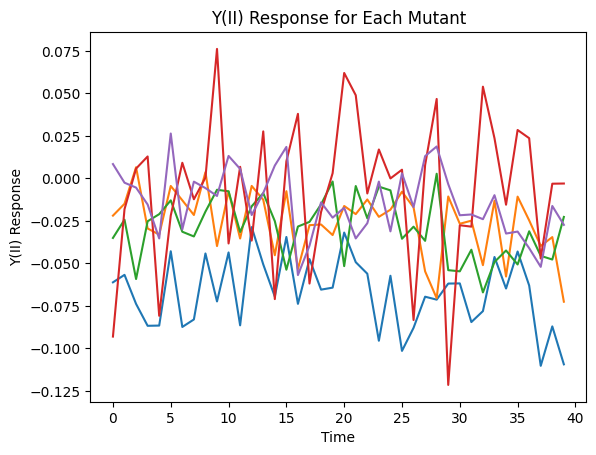

In [405]:
Data_analysis_func.plot_y2(data_norm_features[(data_norm_features['outlier_abs_var_y2'] == True) & (data_norm_features['light_regime'] == '20h_HL')].sort_values(by='abs_var_y2', ascending=True).iloc[:5])

In [125]:
data_smoothed['outlier_abs_var_y2'] = data_norm_features['outlier_abs_var_y2']
data_smoothed['outlier_mean_reduced_v2_y2'] = data_norm_features['outlier_mean_reduced_v2_y2']

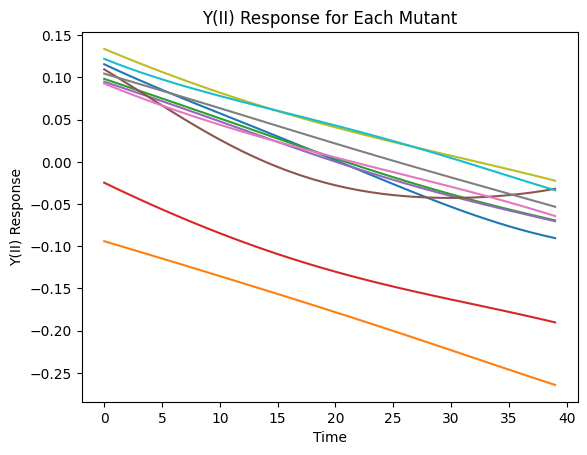

In [711]:
Data_analysis_func.plot_y2(data_smoothed[(data_smoothed['outlier_mean_reduced_v2_y2'] == False) & (data_smoothed['outlier_abs_var_y2'] == True) & (data_smoothed['light_regime'] == '20h_HL')].sort_values(by='abs_var_y2', ascending=False).iloc[:10])

In [203]:
# get the proportion of WT outliers
data_norm_features[(data_norm_features['mutant_ID'] == 'WT') & (data_norm_features['outlier_abs_var_y2'] == True) & (data_norm_features['flag_y2'] == 'ok')].shape[0] / data_norm_features[(data_norm_features['mutant_ID'] == 'WT') & (data_norm_features['flag_y2'] == 'ok')].shape[0]

0.04639653572533251

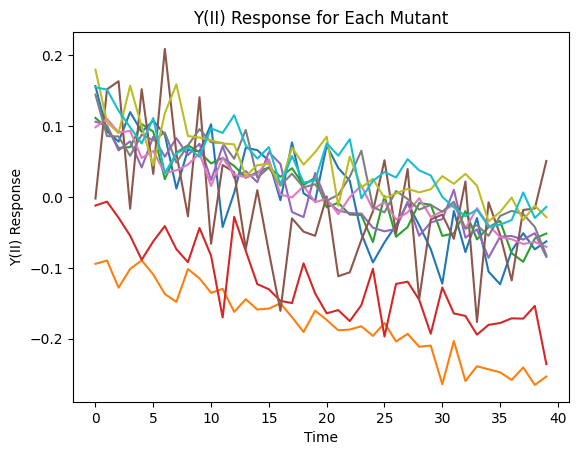

In [130]:
Data_analysis_func.plot_y2(data_norm_features[data_norm_features['light_regime'] == '20h_HL'].sort_values(by='abs_var_y2', ascending=False).iloc[:10])

In [204]:
data_sorted_HL = data_norm_features[data_norm_features['light_regime'] == '20h_HL'].sort_values(by='abs_var_y2', ascending=False)

In [208]:
pd.set_option('display.max_columns', None)

In [209]:
data_norm_features[(data_norm_features['light_regime'] == '20h_HL') & (data_norm_features['mutated_genes'] == data_sorted_HL.iloc[0]['mutated_genes'])]

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq,StdDev_y2,Skewness_y2,Kurtosis_y2,Linear_coef_y2,Quadratic_coef_

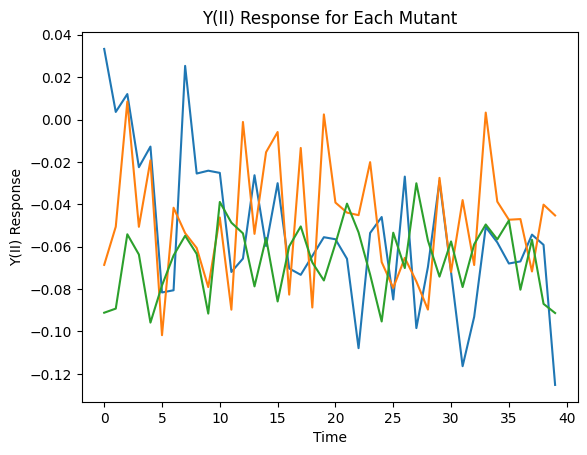

In [264]:
Data_analysis_func.plot_y2(data_norm_features[(data_norm_features['light_regime'] == '20h_HL') & (data_norm_features['mutated_genes'] == data_sorted_HL.iloc[213]['mutated_genes']) & (data_norm_features['flag_y2'] == 'ok')])

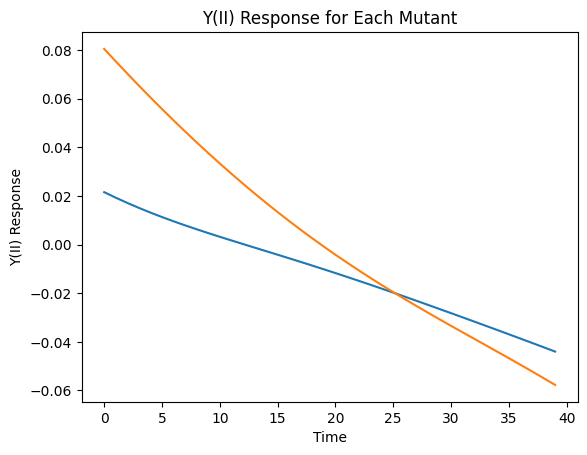

In [409]:
Data_analysis_func.plot_y2(data_smoothed[(data_smoothed['light_regime'] == '20h_HL') & (data_smoothed['mutated_genes'] == data_sorted_HL.iloc[18]['mutated_genes']) & (data_norm_features['flag_y2'] == 'ok')])

In [628]:
# get the genes and light_regime for which every mutant is an outlier
good_outlier_genes_HL = data_smoothed_flagged[(data_smoothed_flagged['light_regime'] == '20h_HL') & (data_smoothed_flagged['flag_shape_y2_y'] == False)].groupby(['mutated_genes', 'light_regime']).agg({'outlier_abs_var_y2': 'sum', 'mutated_genes_light_regime_count': 'first'}).reset_index()

In [629]:
good_outlier_genes_HL

,mutated_genes,light_regime,outlier_abs_var_y2,mutated_genes_light_regime_count
0,Cre01.g000250,20h_HL,False,1
1,Cre01.g000650,20h_HL,1,2
2,Cre01.g001150,20h_HL,0,2
3,Cre01.g001200,20h_HL,False,1
4,Cre01.g001650,20h_HL,False,1
...,...,...,...,...
3051,Cre35.g759247,20h_HL,False,1
3052,Cre36.g759697,20h_HL,0,2
3053,Cre49.g761297,20h_HL,False,1
3054,special_mutant,20h_HL,0,28


In [630]:
good_outlier_genes_HL = good_outlier_genes_HL[(good_outlier_genes_HL['outlier_abs_var_y2'] >= 2)]

In [627]:
good_genes_HL = good_genes[good_genes['light_regime'] == '20h_HL']

In [667]:
dtw.distance_matrix(np.gradient(data_smoothed_flagged[(data_smoothed_flagged['light_regime'] == '20h_HL') & (data_smoothed_flagged['mutated_genes'] == good_outlier_genes_HL['mutated_genes'].iloc[i])].filter(regex=r'^y2_\d+$').dropna(axis=1).values, axis=1))

array([[0.        , 0.00479274, 0.0083532 , 0.00220922, 0.00649729],
       [0.00479274, 0.        , 0.00520234, 0.00283209, 0.00405526],
       [0.0083532 , 0.00520234, 0.        , 0.0067377 , 0.00214436],
       [0.00220922, 0.00283209, 0.0067377 , 0.        , 0.00513613],
       [0.00649729, 0.00405526, 0.00214436, 0.00513613, 0.        ]])

In [723]:
data_smoothed_flagged[(data_smoothed_flagged['light_regime'] == '20h_HL') & (data_smoothed_flagged['mutated_genes'] == good_outlier_genes_HL['mutated_genes'].iloc[i])]

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq,StdDev_y2,Skewness_y2,Kurtosis_y2,Linear_coef_y2,Quadratic_coef_

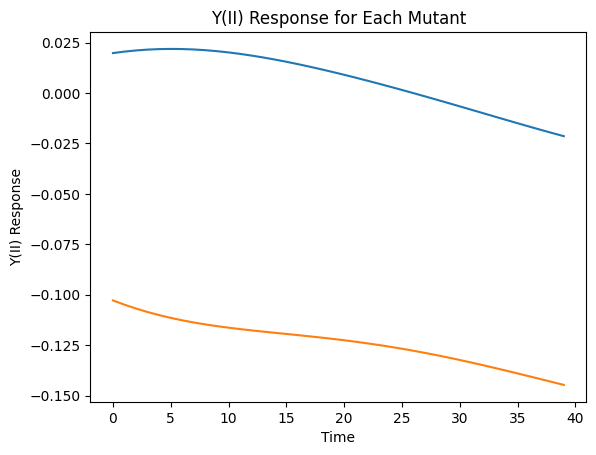

In [725]:
i = 2
Data_analysis_func.plot_y2(data_smoothed_flagged[(data_smoothed_flagged['light_regime'] == '20h_HL') & (data_smoothed_flagged['mutated_genes'] == good_outlier_genes_HL['mutated_genes'].iloc[i])])

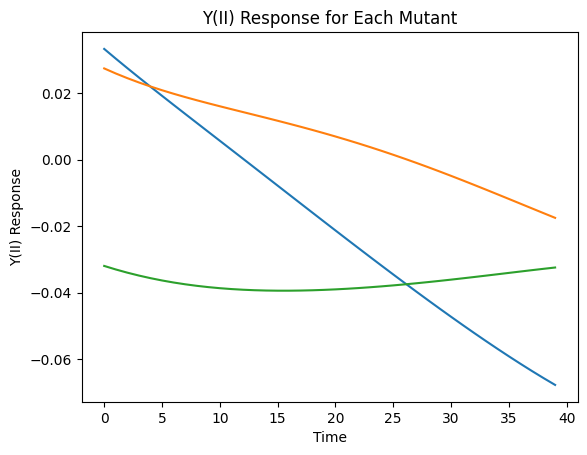

In [721]:
Data_analysis_func.plot_y2(data_smoothed_flagged[(data_smoothed_flagged['light_regime'] == '20h_HL') & (data_smoothed_flagged['mutated_genes'] == data_smoothed_flagged['mutated_genes'].unique()[19])])

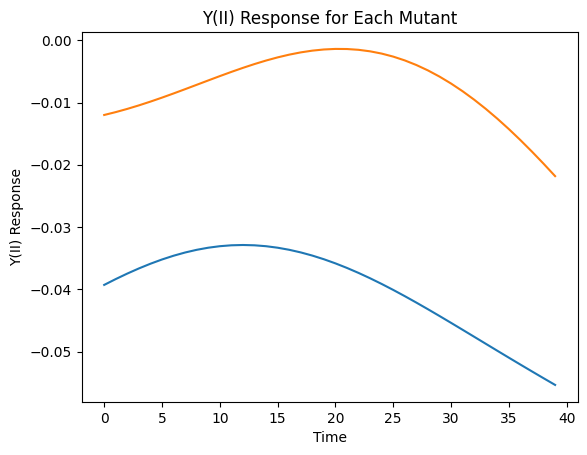

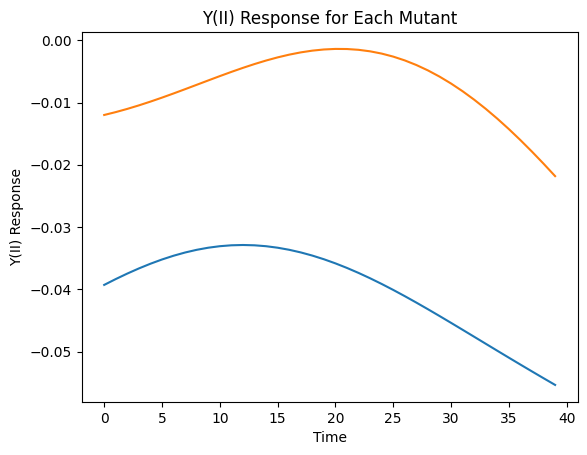

In [730]:
good_examples = [1, 3, 8, 9, 12, 115, 150, 161, 162]
bad_examples = [0, 14, 130, 140, 160, 165, 180]
interesting_example = [118, 165]
i = 4
Data_analysis_func.plot_y2(data_smoothed_flagged[(data_smoothed_flagged['light_regime'] == good_genes_HL['light_regime'].iloc[i]) & (data_smoothed_flagged['mutated_genes'] == good_genes_HL['mutated_genes'].iloc[i]) & (data_smoothed_flagged['flag_shape_y2_y'] == False)])
Data_analysis_func.plot_y2(data_smoothed_flagged[(data_smoothed_flagged['light_regime'] == good_genes_HL['light_regime'].iloc[i]) & (data_smoothed_flagged['mutated_genes'] == good_genes_HL['mutated_genes'].iloc[i])])
# Data_analysis_func.plot_y2(data_norm_features[(data_norm_features['light_regime'] == good_genes['light_regime'].iloc[i]) & (data_norm_features['mutated_genes'] == good_genes['mutated_genes'].iloc[i]) & (data_norm_features['flag_y2'] == 'ok')])

Euclidian distance :  0.31622776601683794  Time-warped distance :  0.31622776601683805


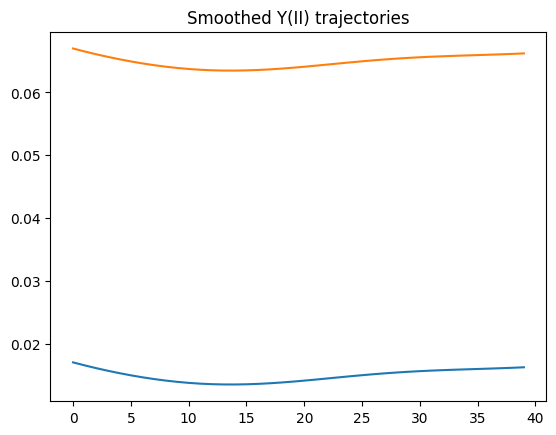

In [857]:
i = 0

s1 = data_smoothed.filter(like='y2_').dropna(axis=1).values[i]
s2 = data_smoothed.filter(like='y2_').dropna(axis=1).values[i]

s1_grad = np.gradient(s1)
s2_grad = np.gradient(s2)

plt.plot(s1)
plt.plot(s2)
plt.title('Smoothed Y(II) trajectories')

# path = dtw.warping_path(s1_grad, s2_grad)
# dtwvis.plot_warping(s1_grad, s2_grad, path)

euc_dist = np.sqrt(np.sum((s1_grad - s2_grad)**2))
tw_dist = dtw.distance(s1_grad, s2_grad)

euc_dist = np.sqrt(np.sum((s1 - s2)**2))
tw_dist = dtw.distance(s1, s2)

print('Euclidian distance : ', euc_dist, " Time-warped distance : ", dtw.distance(s1, s2))

In [527]:
shape_threshold_distances_y2 = Genes_self_similarity_v2.get_shape_threshold_distances(data_smoothed, 'y2')

In [645]:
shape_threshold_distances_y2

{'1min-1min': 0.0062283621486745235,
 '10min-10min': 0.006678922397106593,
 '20h_HL': 0.007395151483224734,
 '20h_ML': 0.007242539106591195,
 '2h-2h': 0.0076706105377772615,
 '30s-30s': 0.006192536402963059}

In [547]:
df = pd.DataFrame([shape_threshold_distances_y2])

In [549]:
df.to_csv('shape_threshold_distances_y2.csv')

In [555]:
data_smoothed_flagged = Genes_self_similarity_v2.apply_shape_flagging_mutants(data_smoothed, shape_threshold_distances_y2, shape_threshold_distances_y2, p=(2/3))

In [560]:
data_smoothed_flagged['flag_shape_y2_y'].value_counts()

flag_shape_y2_y
0.0    7103
1.0    1747
Name: count, dtype: int64

In [567]:
data_smoothed_flagged[(data_smoothed_flagged['light_regime'] == '20h_HL') & (data_smoothed_flagged['mutated_genes'] == data_smoothed_flagged['mutated_genes'].unique()[2])]

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq,StdDev_y2,Skewness_y2,Kurtosis_y2,Linear_coef_y2,Quadratic_coef_

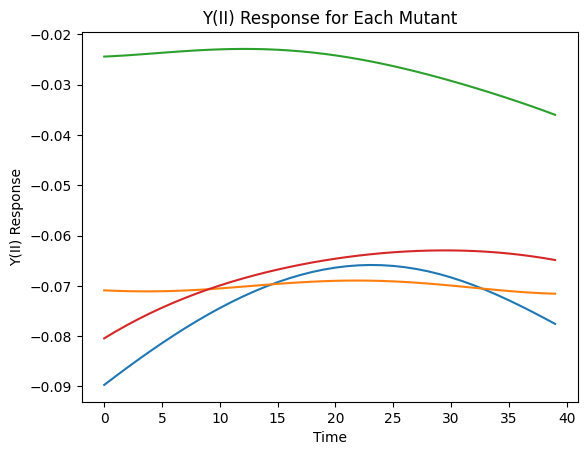

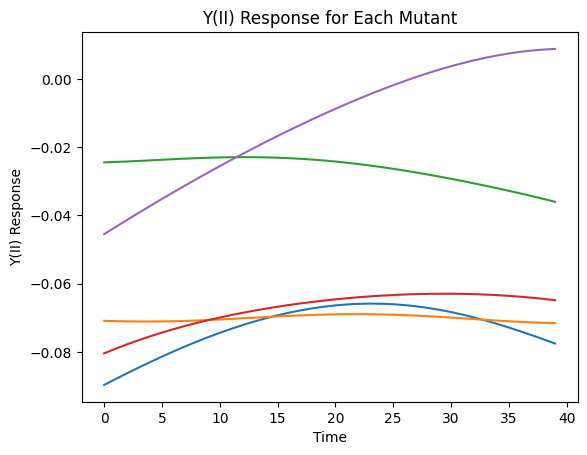

In [595]:
i = 24
Data_analysis_func.plot_y2(data_smoothed_flagged[(data_smoothed_flagged['light_regime'] == '20h_HL') & (data_smoothed_flagged['mutated_genes'] == data_smoothed_flagged['mutated_genes'].unique()[i]) & (data_smoothed_flagged['flag_shape_y2_y'] == False)])
Data_analysis_func.plot_y2(data_smoothed_flagged[(data_smoothed_flagged['light_regime'] == '20h_HL') & (data_smoothed_flagged['mutated_genes'] == data_smoothed_flagged['mutated_genes'].unique()[i])])

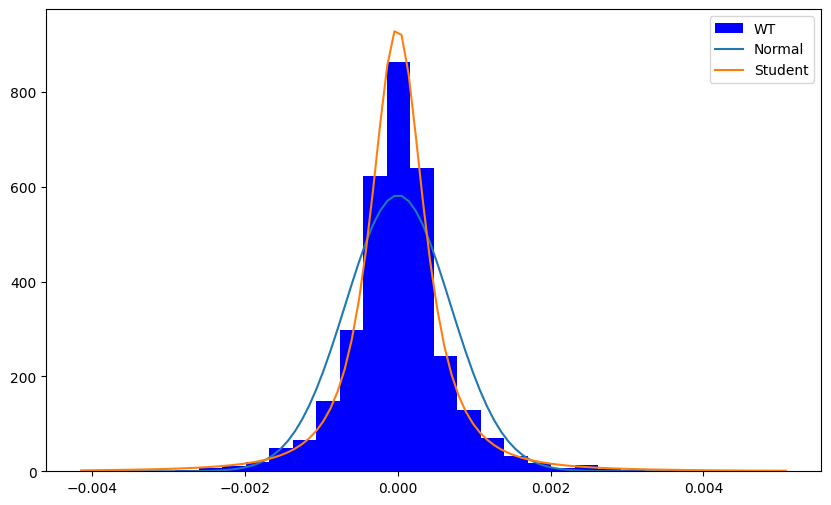

In [98]:
# Extract the 'abs_var_y2' values for WT
lin_coef_y2_WT = data_smoothed[data_smoothed['mutant_ID'] == 'WT']['Linear_coef_y2'].values

# Compute the mean and standard deviation of the 'abs_var_y2' values for WT
mean_lin_coef_y2_WT = lin_coef_y2_WT.mean()
std_lin_coef_y2_WT = lin_coef_y2_WT.std()

# Generate a range of x values
x = np.linspace(min(lin_coef_y2_WT), max(lin_coef_y2_WT), 100)

# Compute the density of the absolute value of known distributions to test the fit of the data

# Fit normal distribution
mean_norm, std_norm = stats.norm.fit(lin_coef_y2_WT)

# Fit Student distribution
df_student, loc_student, scale_student = stats.t.fit(lin_coef_y2_WT)

# Plot the histogram of 'abs_var_y2' values for WT
plt.figure(figsize=(10, 6))
plt.hist(lin_coef_y2_WT, bins=30, density=True, color='blue', label='WT')
plt.plot(x, stats.norm.pdf(x, mean_norm, std_norm), label='Normal')
plt.plot(x, stats.t.pdf(x, df_student, loc_student, scale_student), label='Student')

plt.legend()
plt.show()

In [99]:
# perform Kolmogorov-Smirnov test for goodness-of-fit
kstest_result = stats.kstest(lin_coef_y2_WT, 'norm', args=(mean_norm, std_norm))

print("Kolmogorov-Smirnov test result for normal:")
print(f"KS statistic: {kstest_result.statistic:.4f}")
print(f"P-value: {kstest_result.pvalue:.4f}")

# perform Kolmogorov-Smirnov test for goodness-of-fit
kstest_result = stats.kstest(lin_coef_y2_WT, 't', args=(df_student, loc_student, scale_student))

print("Kolmogorov-Smirnov test result for student:")
print(f"KS statistic: {kstest_result.statistic:.4f}")
print(f"P-value: {kstest_result.pvalue:.4f}")

Kolmogorov-Smirnov test result for normal:
KS statistic: 0.0865
P-value: 0.0000
Kolmogorov-Smirnov test result for student:
KS statistic: 0.0140
P-value: 0.5049


In [463]:
# compute the linear coefficient of every row
for light in data_smoothed['light_regime'].unique():
    data_smoothed.loc[data_smoothed['light_regime'] == light, 'Linear_coef_y2'] = data_smoothed[data_smoothed['light_regime'] == light].dropna(axis=1).filter(like='y2_').apply(lambda x: np.polyfit(np.arange(len(x)), x, 1)[0], axis=1)

In [467]:
data_smoothed.dropna(subset=['plate'], inplace=True)

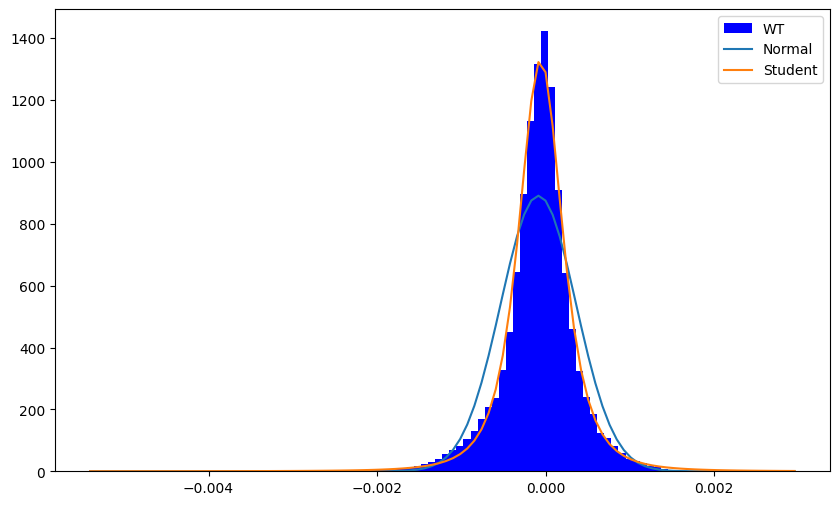

In [469]:
import scipy.stats as stats

# Extract the 'abs_var_y2' values for WT
lin_coef_y2_WT = data_smoothed['Linear_coef_y2'].values

# Compute the mean and standard deviation of the 'abs_var_y2' values for WT
mean_lin_coef_y2_WT = lin_coef_y2_WT.mean()
std_lin_coef_y2_WT = lin_coef_y2_WT.std()

# Generate a range of x values
x = np.linspace(min(lin_coef_y2_WT), max(lin_coef_y2_WT), 100)

# Compute the density of the absolute value of known distributions to test the fit of the data

# Fit normal distribution
mean_norm, std_norm = stats.norm.fit(lin_coef_y2_WT)

# Fit Student distribution
df_student, loc_student, scale_student = stats.t.fit(lin_coef_y2_WT)

# Plot the histogram of 'abs_var_y2' values for WT
plt.figure(figsize=(10, 6))
plt.hist(lin_coef_y2_WT, bins=100, density=True, color='blue', label='WT')
plt.plot(x, stats.norm.pdf(x, mean_norm, std_norm), label='Normal')
plt.plot(x, stats.t.pdf(x, df_student, loc_student, scale_student), label='Student')

plt.legend()
plt.show()

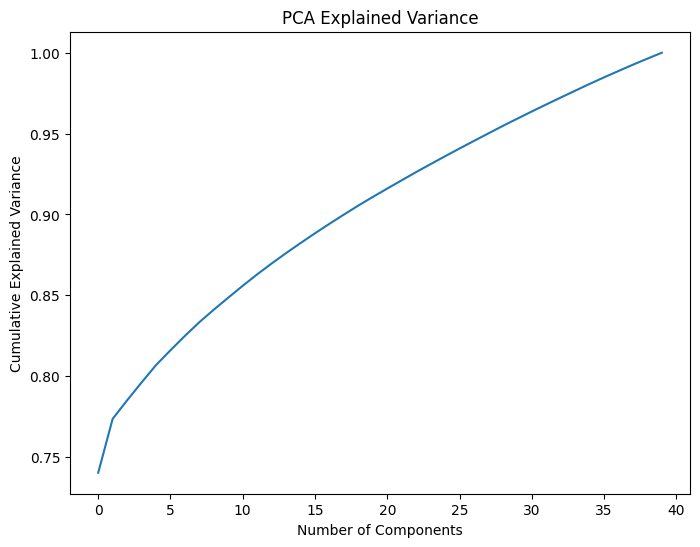

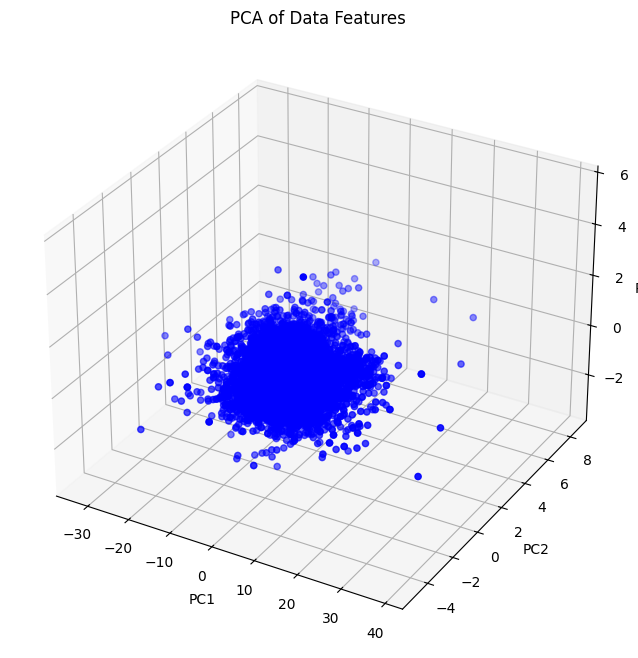

In [32]:
# do a pca of the data features 
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

feature_list = ['StdDev_y2', 'abs_var_y2', 'Linear_coef_y2', 'div_y2', 'Max_slope_y2']

# Extract the features for PCA
# features = data_norm_features[feature_list].values

features = data_norm_flagged[(data_norm_flagged['light_regime'] == '20h_HL')].filter(like='y2_').dropna(axis=1).values

# Standardize the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Perform PCA
pca = PCA()
pca.fit(features_scaled)

# Plot the explained variance ratio
plt.figure(figsize=(8, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.show()

# Perform PCA with 3 components
pca = PCA(n_components=3)
features_pca = pca.fit_transform(features_scaled)

# plot the pca in 3D
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Extract the PCA components
x = features_pca[:, 0]
y = features_pca[:, 1]
z = features_pca[:, 2]

# Plot the 3D scatter plot
ax.scatter(x, y, z, c='blue', marker='o')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.title('PCA of Data Features')
plt.show()

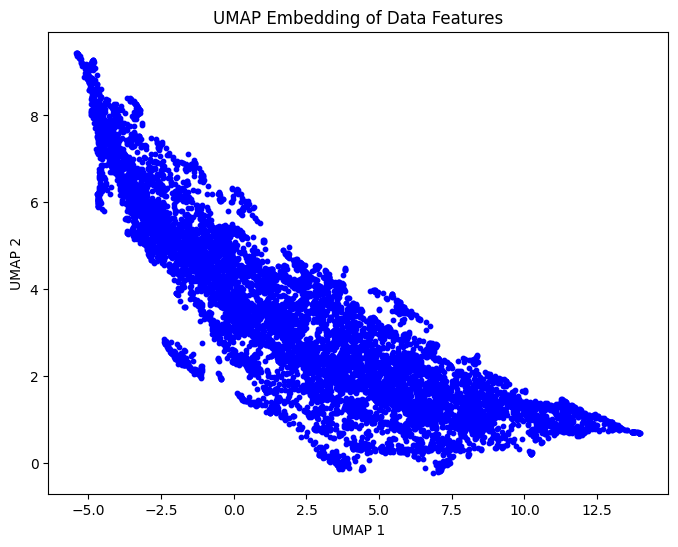

In [33]:
# do umap
import umap

reducer = umap.UMAP(n_components=2)
features_umap = reducer.fit_transform(features_scaled)

# Plot the UMAP embedding
plt.figure(figsize=(8, 6))
plt.scatter(features_umap[:, 0], features_umap[:, 1], c='blue', s=10)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.title('UMAP Embedding of Data Features')
plt.show()

/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_20777/1301267285.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_umap['UMAP1'] = features_umap[:, 0]
/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_20777/1301267285.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_umap['UMAP2'] = features_umap[:, 1]
/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_20777/1301267285.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

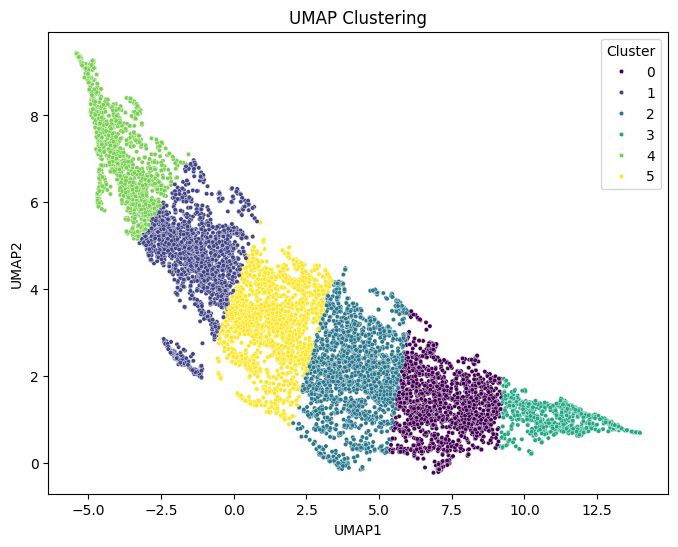

In [34]:
from sklearn.cluster import KMeans

# get UMAP clusters and plot the original data
# data_umap = data_norm_features.copy()
data_umap = data_norm_flagged[(data_norm_flagged['light_regime'] == '20h_HL')]
data_umap['UMAP1'] = features_umap[:, 0]
data_umap['UMAP2'] = features_umap[:, 1]

# Perform clustering on the UMAP embedding
kmeans = KMeans(n_clusters=6, random_state=42)
data_umap['Cluster'] = kmeans.fit_predict(features_umap)

# Plot the UMAP embedding with clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data_umap, x='UMAP1', y='UMAP2', hue='Cluster', palette='viridis', s=10)
plt.title('UMAP Clustering')
plt.show()



/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_20777/1294169290.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_pca['PC1'] = features_pca[:, 0]
/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_20777/1294169290.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_pca['PC2'] = features_pca[:, 1]
/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_20777/1294169290.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usin

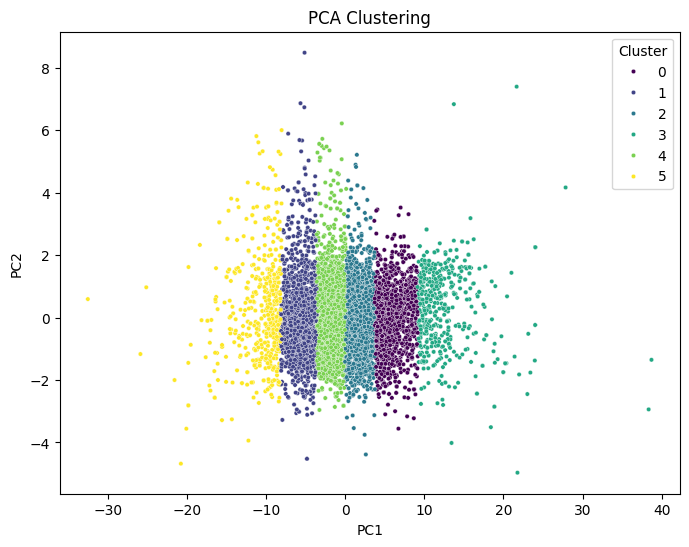

In [35]:
# data_pca = data_norm_features.copy()
data_pca = data_norm_flagged[(data_norm_flagged['light_regime'] == '20h_HL')]
data_pca['PC1'] = features_pca[:, 0]
data_pca['PC2'] = features_pca[:, 1]
data_pca['PC3'] = features_pca[:, 2]

# Perform clustering on the PCA components
kmeans = KMeans(n_clusters=6, random_state=42)
data_pca['Cluster'] = kmeans.fit_predict(features_pca)

# Plot the PCA components with clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data_pca, x='PC1', y='PC2', hue='Cluster', palette='viridis', s=10)
plt.title('PCA Clustering')
plt.show()

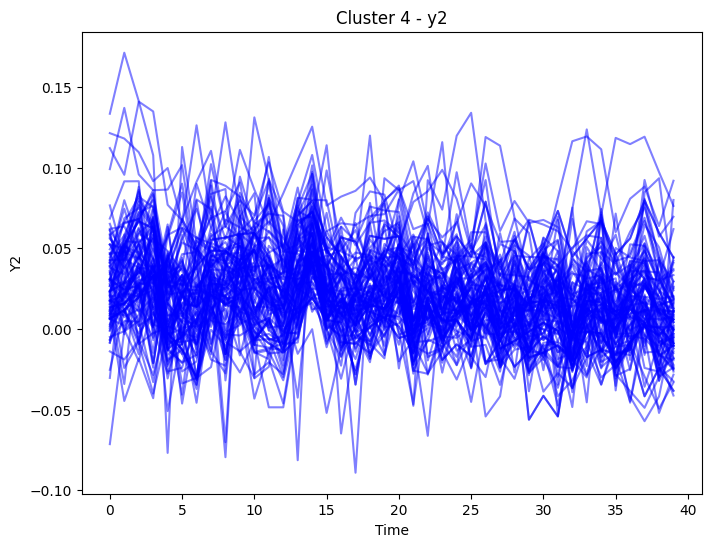

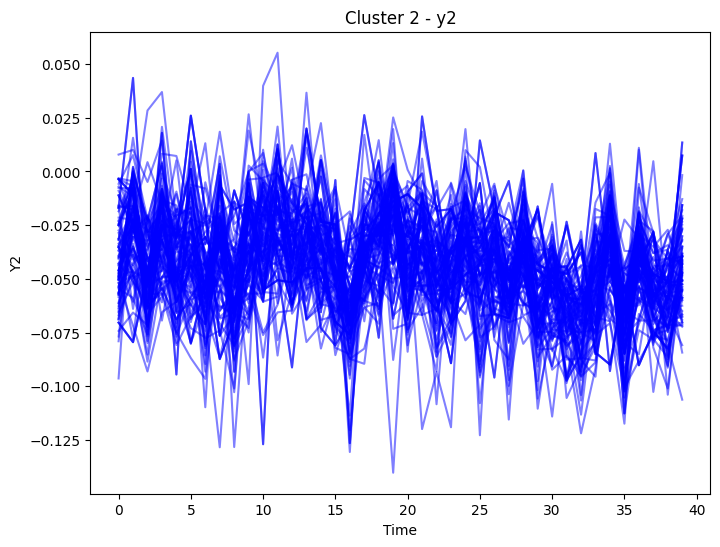

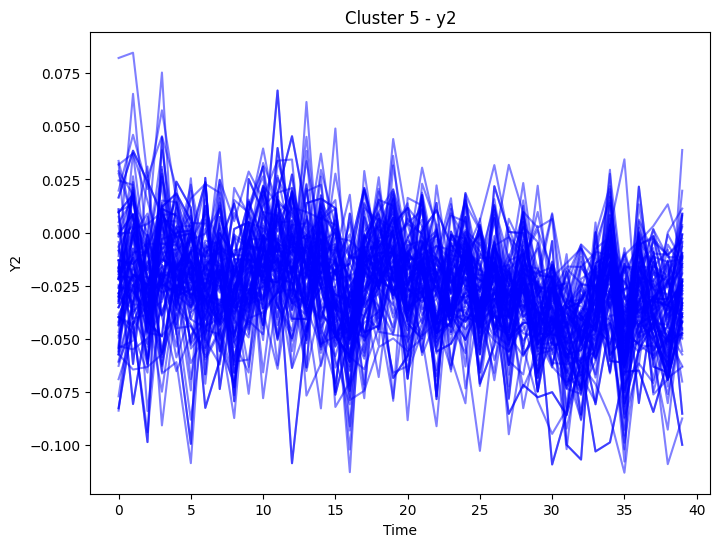

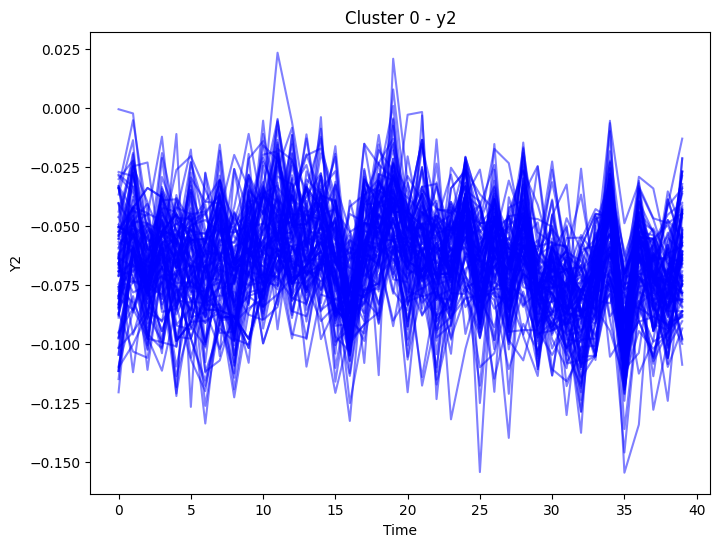

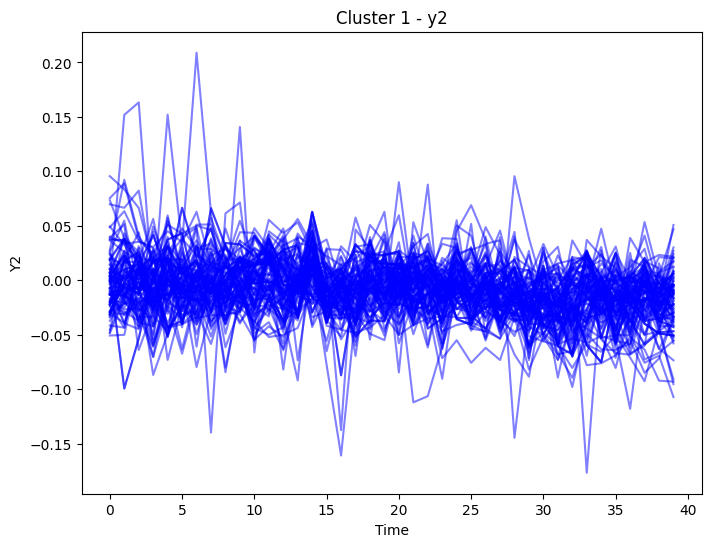

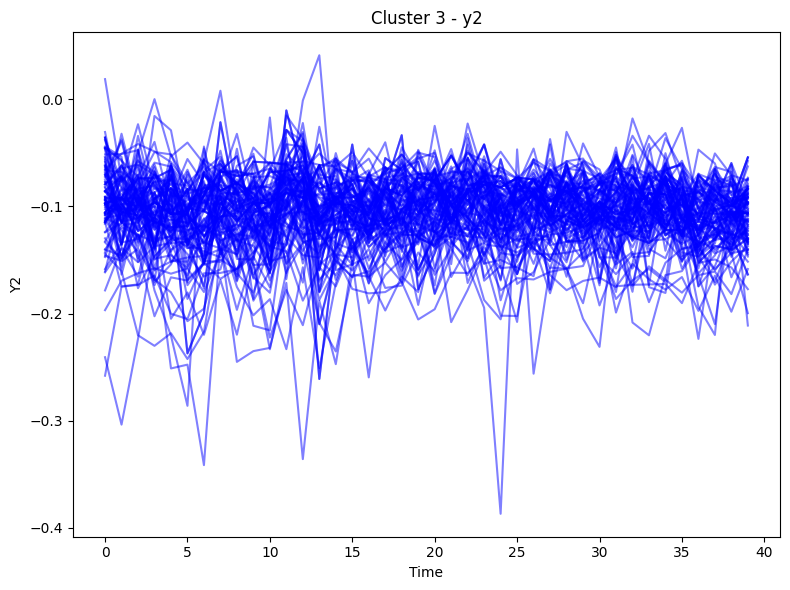

In [36]:
# plot the y2 from each clusters

for cluster in data_umap['Cluster'].unique():
    data_y2 = data_umap[(data_umap['Cluster'] == cluster) & (data_umap['light_regime'] == '20h_HL')].filter(like='y2_').dropna(axis=1).iloc[:100].values
    plt.figure(figsize=(8, 6))
    for i in range(data_y2.shape[0]):
        plt.plot(data_y2[i], c='blue', alpha=0.5)
    plt.title(f'Cluster {cluster} - y2')
    plt.xlabel('Time')
    plt.ylabel('Y2')

plt.tight_layout()
plt.show()

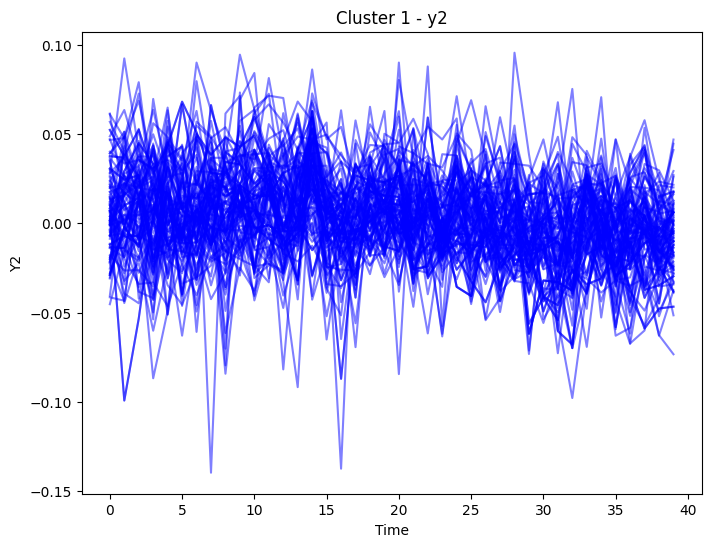

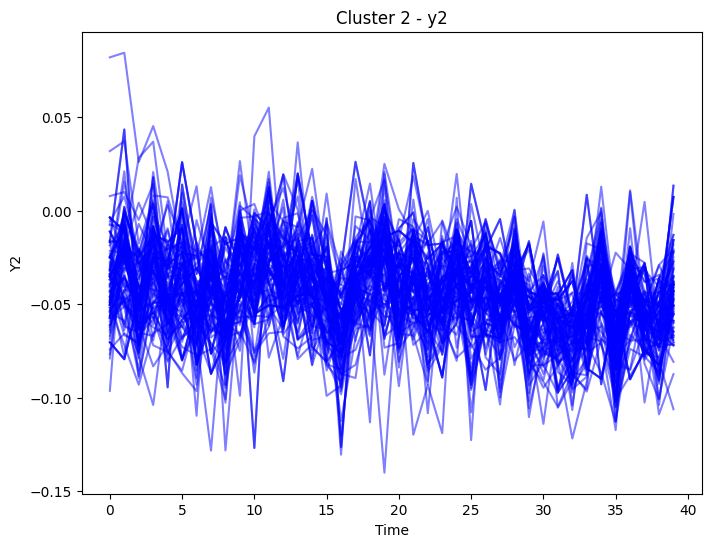

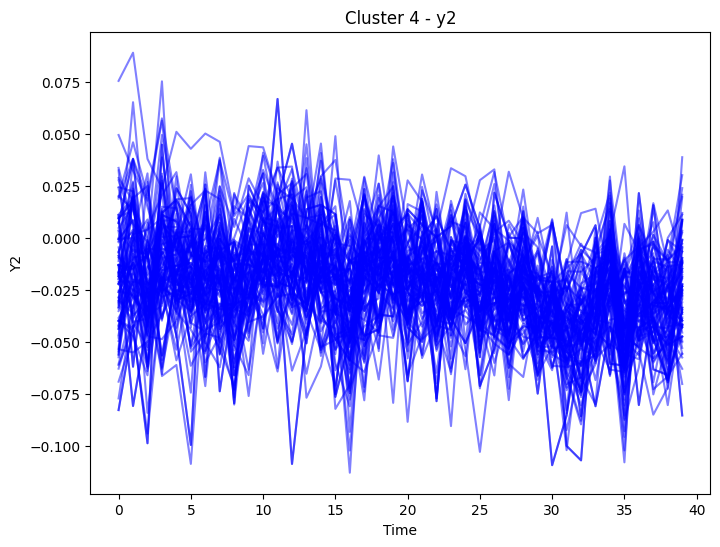

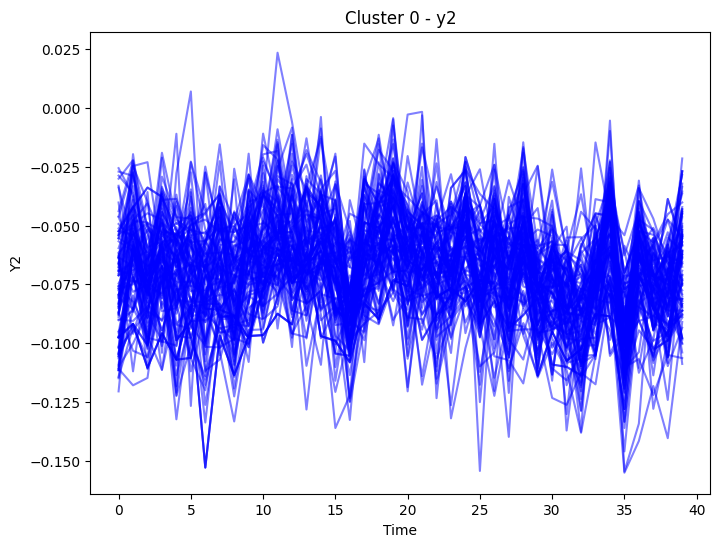

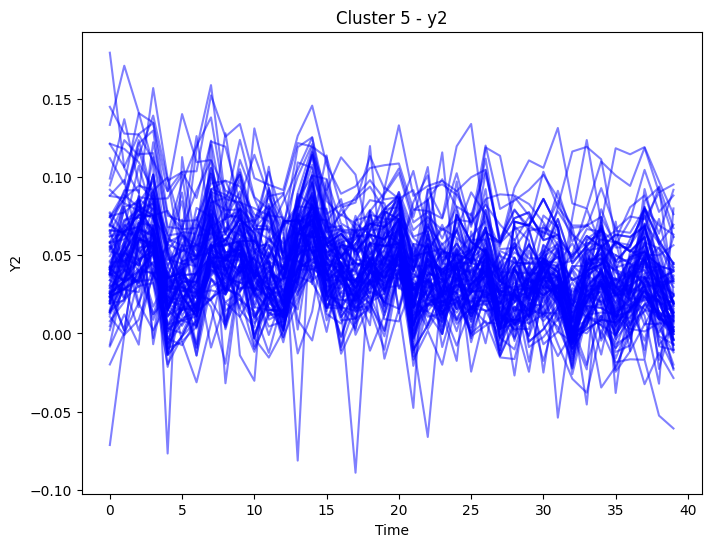

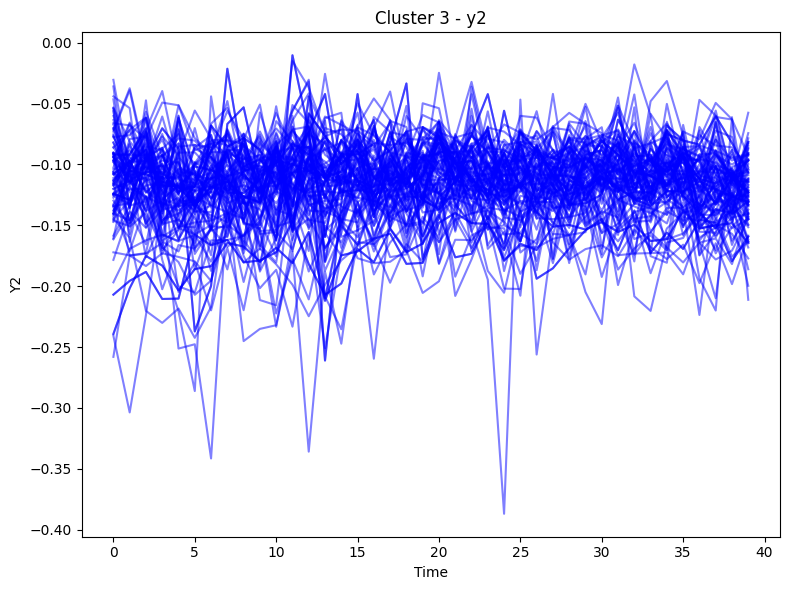

In [37]:
# plot the y2 from each clusters

for cluster in data_pca['Cluster'].unique():
    data_y2 = data_pca[(data_pca['Cluster'] == cluster) & (data_pca['light_regime'] == '20h_HL')].filter(like='y2_').dropna(axis=1).iloc[:100].values
    plt.figure(figsize=(8, 6))
    for i in range(data_y2.shape[0]):
        plt.plot(data_y2[i], c='blue', alpha=0.5)
    plt.title(f'Cluster {cluster} - y2')
    plt.xlabel('Time')
    plt.ylabel('Y2')

plt.tight_layout()
plt.show()

In [70]:
# print the number o mutant_ID == WT in each cluster

cluster_counts_umap = data_umap[data_umap['mutant_ID'] == 'WT']['Cluster'].value_counts()/len(data_umap[data_umap['mutant_ID'] == 'WT'])
cluster_counts_pca = data_pca[data_pca['mutant_ID'] == 'WT']['Cluster'].value_counts()/len(data_pca[data_pca['mutant_ID'] == 'WT'])

print("Cluster counts for UMAP:")
print(cluster_counts_umap)

print("\nCluster counts for PCA:")
print(cluster_counts_pca)


Cluster counts for UMAP:
Cluster
5    0.299155
0    0.244101
1    0.198077
2    0.107195
3    0.076609
4    0.074862
Name: count, dtype: float64

Cluster counts for PCA:
Cluster
1    0.671133
5    0.151471
4    0.143606
3    0.018643
0    0.014856
2    0.000291
Name: count, dtype: float64


In [71]:
data_smoothed['cluster_umap'] = data_umap['Cluster']
data_smoothed['cluster_pca'] = data_pca['Cluster']

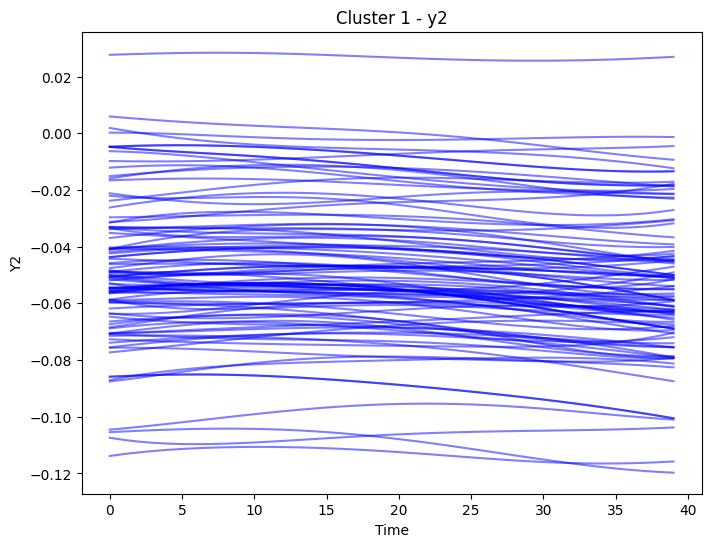

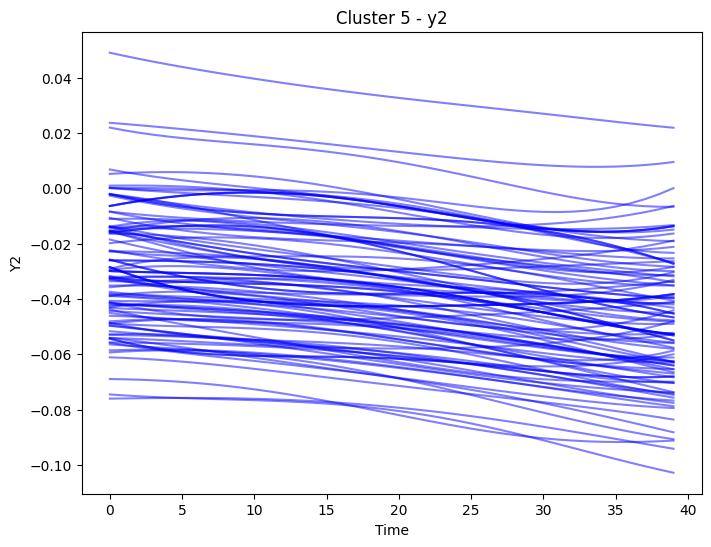

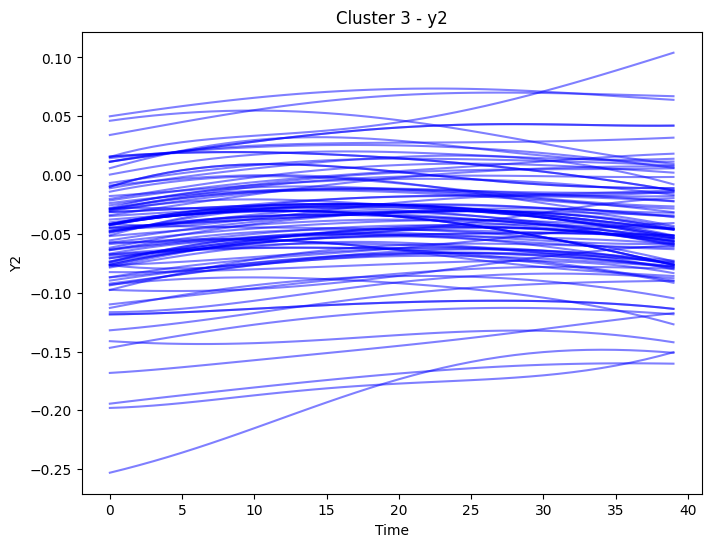

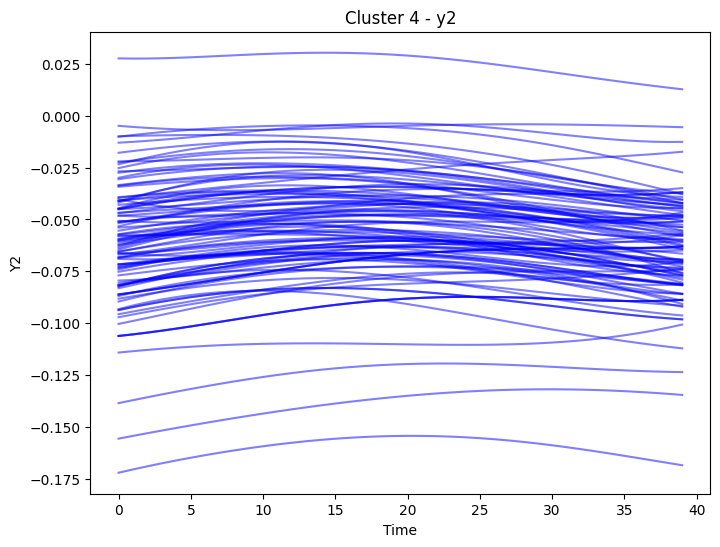

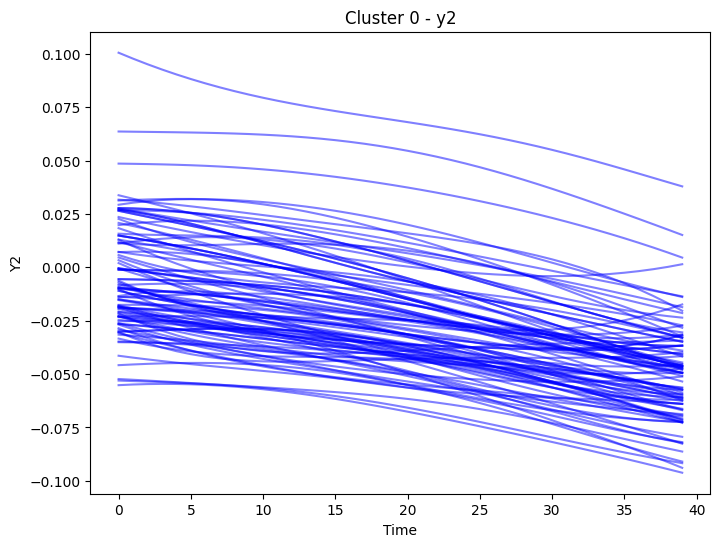

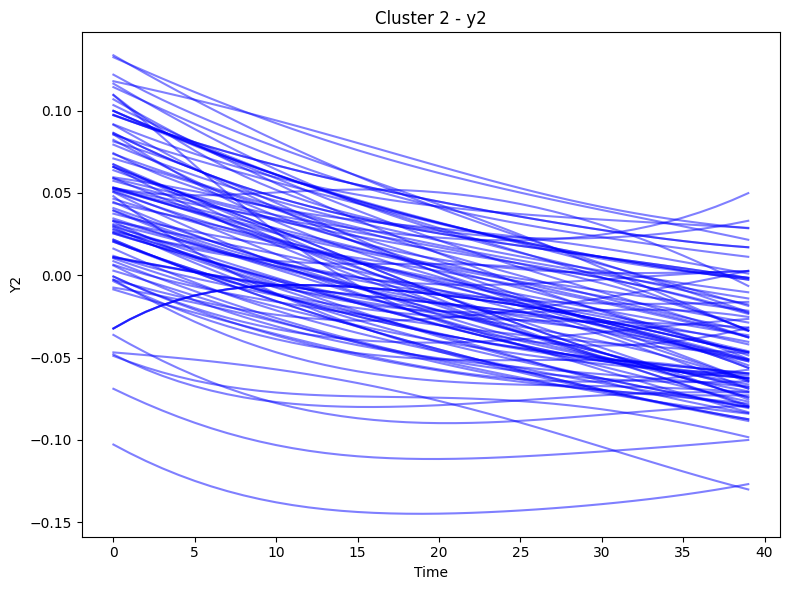

In [74]:
# plot the y2 from each clusters

for cluster in data_smoothed['cluster_pca'].unique():
    data_y2 = data_smoothed[(data_smoothed['cluster_pca'] == cluster) & (data_smoothed['light_regime'] == '20h_HL')].filter(like='y2_').dropna(axis=1).iloc[:100].values
    plt.figure(figsize=(8, 6))
    for i in range(data_y2.shape[0]):
        plt.plot(data_y2[i], c='blue', alpha=0.5)
    plt.title(f'Cluster {cluster} - y2')
    plt.xlabel('Time')
    plt.ylabel('Y2')

plt.tight_layout()
plt.show()

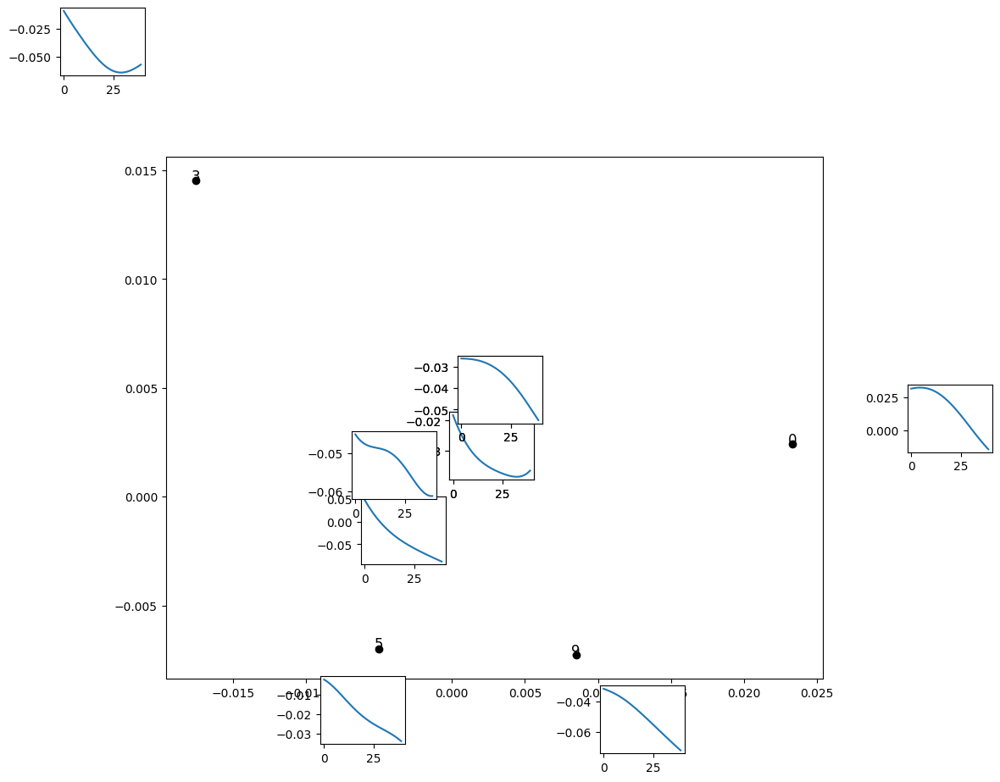

In [227]:
N=10

data_kpca = data_smoothed[(data_smoothed['light_regime'] == '20h_HL')].filter(like='y2_').iloc[:1000]

data_kpca['KPCA1'] = features_kpca[:, 0]
data_kpca['KPCA2'] = features_kpca[:, 1]

fig, ax = plt.subplots(figsize=(10, 8))

# scatter = ax.scatter(features_kpca[:, 0], features_kpca[:, 1], c='blue', s=10)

for i in range(N):
    # Plot the original time-series at the position of the PCA result
    ax.plot(data_kpca['KPCA1'].iloc[i], data_kpca['KPCA2'].iloc[i], 'ko')  # Mark the point with a black dot
    ax.text(data_kpca['KPCA1'].iloc[i], data_kpca['KPCA2'].iloc[i], str(i), fontsize=12, ha='center')
    
    # Add a subplot at the PCA position to display the original time-series
    x_pos = (data_kpca['KPCA1'].iloc[i] - data_kpca['KPCA1'].iloc[:N].min())/(data_kpca['KPCA1'].iloc[:N].max() - data_kpca['KPCA1'].iloc[:N].min())
    y_pos = (data_kpca['KPCA2'].iloc[i] - data_kpca['KPCA2'].iloc[:N].min())/(data_kpca['KPCA2'].iloc[:N].max() - data_kpca['KPCA2'].iloc[:N].min())
    rect = [x_pos, y_pos, 0.1, 0.1]
    ax_inset = fig.add_axes(rect)
    data_kpca_y2 = data_kpca.filter(like='y2_').dropna(axis=1).iloc[i].values
    ax_inset.plot(data_kpca_y2)
    # ax_inset.set_title(f'Time-series {i}')
    # ax_inset.axis('off')  # Turn off axes for the inset plot

# plt.xlabel('PCA Component 1')
# plt.ylabel('PCA Component 2')
# plt.title('PCA of Time-Series Data with Original Time-Series')

# plt.tight_layout()
plt.show()


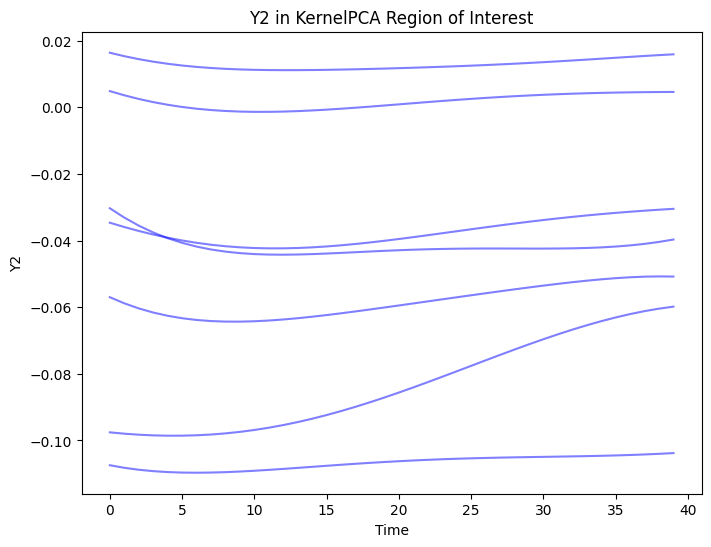

In [244]:
# region = [-0.03, -0.025, 0.015, 0.03]
region = [0.02, 0.35, -0.02, -0.01]
# region = [-0.0005, 0.0005, -0.0005, 0.0005]
# region = [-0.001, 0.001, -0.001, 0.001]
# region = [0.01, 0.015, 0.01, 0.015]
# region = [0.023, 0.024, 0.002, 0.0035]
# plot the y2 of the points in the region of interest in the KPCA space
data_y2 = data_kpca[(data_kpca['KPCA1'] > region[0]) & (data_kpca['KPCA1'] < region[1]) & (data_kpca['KPCA2'] > region[2]) & (data_kpca['KPCA2'] < region[3])].filter(like='y2_').dropna(axis=1).values
plt.figure(figsize=(8, 6))
for i in range(data_y2.shape[0]):
    plt.plot(data_y2[i], c='blue', alpha=0.5)
plt.title('Y2 in KernelPCA Region of Interest')
plt.xlabel('Time')
plt.ylabel('Y2')
plt.show()


In [91]:
pd.set_option('display.max_columns', None)

In [553]:
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture


time_series_data = data_norm_flagged[(data_norm_flagged['light_regime'] == '20h_HL')].iloc[:4000].filter(like='y2_').dropna(axis=1).values
# time_series_data = data_smoothed[(data_smoothed['light_regime'] == '20h_HL')].filter(like='y2_').dropna(axis=1).values

# Apply BGMM
bgmm = BayesianGaussianMixture(n_components=10, weight_concentration_prior=1)  # max_iter is optional
bgmm.fit(time_series_data)
labels_bgmm = bgmm.predict(time_series_data)

/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/.venv/lib/python3.11/site-packages/sklearn/mixture/_base.py:268: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



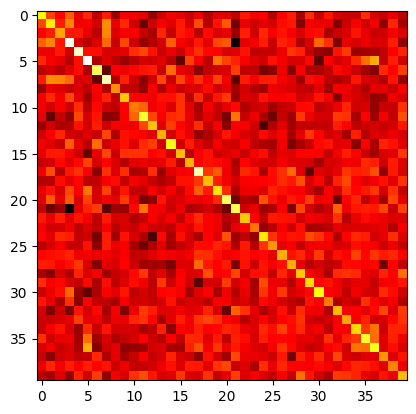

In [258]:
plt.imshow(bgmm.covariances_[0], cmap='hot', interpolation='nearest')

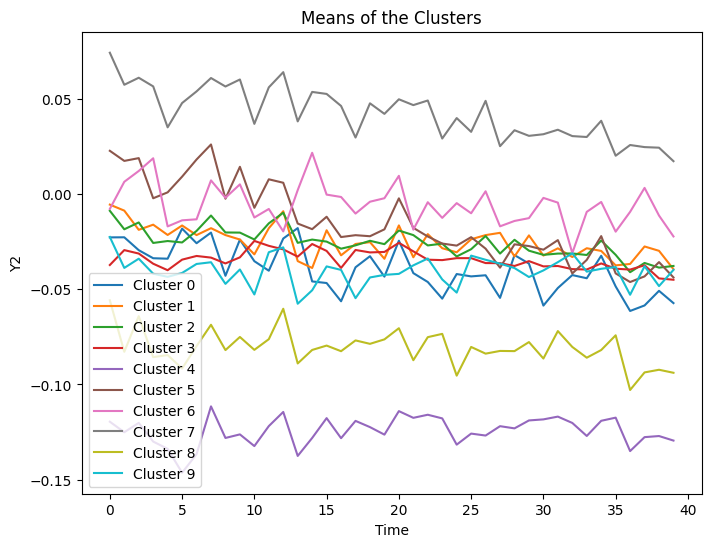

In [554]:
# plot means and variances of the clusters
plt.figure(figsize=(8, 6))
for i in range(bgmm.n_components):
    plt.plot(bgmm.means_[i], label=f'Cluster {i}')
plt.title('Means of the Clusters')
plt.xlabel('Time')
plt.ylabel('Y2')
plt.legend()
plt.show()

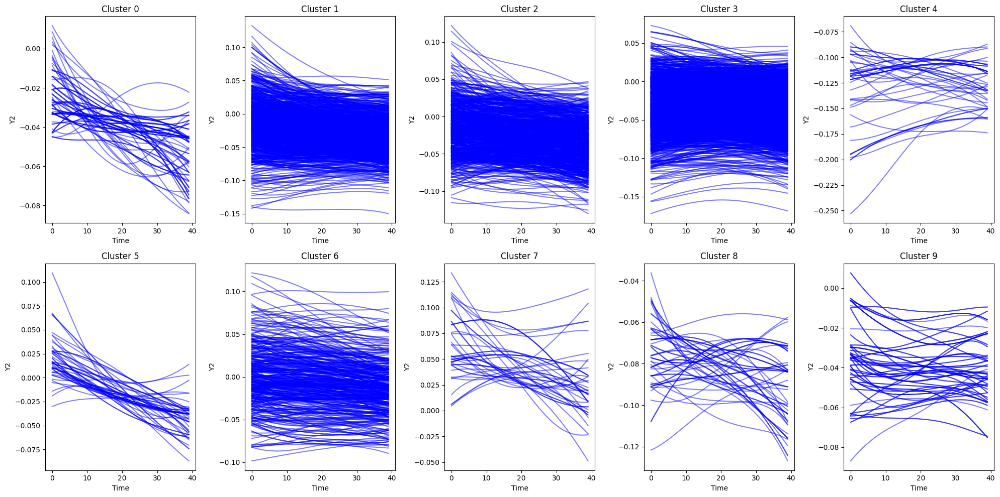

In [565]:
# plot the clusters from BGMM

data_BGMM = data_norm_flagged[(data_norm_flagged['light_regime'] == '20h_HL')].iloc[:4000]
data_BGMM = data_smoothed[(data_smoothed['light_regime'] == '20h_HL')].iloc[:4000]
data_BGMM['Cluster'] = labels_bgmm

# plot the clusters
plt.subplots(2, 5, figsize=(20, 10))    
for i in range(10):
    plt.subplot(2, 5, i+1)
    data_y2 = data_BGMM[data_BGMM['Cluster'] == i].filter(like='y2_').dropna(axis=1).values
    for j in range(data_y2.shape[0]):
        plt.plot(data_y2[j], c='blue', alpha=0.5)
    plt.title(f'Cluster {i}')
    plt.xlabel('Time')
    plt.ylabel('Y2')

plt.tight_layout()
plt.show()


In [559]:
# plot the proportion of WT in each cluster
cluster_counts_BGMM = data_BGMM[data_BGMM['mutant_ID'] == 'WT']['Cluster'].value_counts()/len(data_BGMM[data_BGMM['mutant_ID'] == 'WT'])

print('Number of WT :', len(data_BGMM[data_BGMM['mutant_ID'] == 'WT']))

print("Proportion of WT in each cluster for BGMM:")
print(cluster_counts_BGMM)

# plot the proportion of beg_down in each cluster
cluster_counts_BGMM = data_BGMM[data_BGMM['outlier_divergent_beg_down_y2'] == True]['Cluster'].value_counts()/len(data_BGMM[data_BGMM['outlier_divergent_beg_down_y2'] == True])

print('Number of beg_down :', len(data_BGMM[data_BGMM['outlier_divergent_beg_down_y2'] == True]))

print("Proportion of beg_down in each cluster for BGMM:")
print(cluster_counts_BGMM)

# plot the proportion of end_down in each cluster
cluster_counts_BGMM = data_BGMM[data_BGMM['outlier_divergent_end_down_y2'] == True]['Cluster'].value_counts()/len(data_BGMM[data_BGMM['outlier_divergent_end_down_y2'] == True])

print('Number of end_down :', len(data_BGMM[data_BGMM['outlier_divergent_end_down_y2'] == True]))

print("Proportion of end_down in each cluster for BGMM:")
print(cluster_counts_BGMM)

Number of WT : 411
Proportion of WT in each cluster for BGMM:
Cluster
3    0.751825
2    0.133820
1    0.075426
6    0.029197
7    0.007299
5    0.002433
Name: count, dtype: float64
Number of beg_down : 51
Proportion of beg_down in each cluster for BGMM:
Cluster
3    0.509804
2    0.176471
1    0.117647
9    0.117647
6    0.078431
Name: count, dtype: float64
Number of end_down : 496
Proportion of end_down in each cluster for BGMM:
Cluster
3    0.334677
1    0.278226
2    0.215726
0    0.078629
6    0.040323
9    0.028226
5    0.024194
Name: count, dtype: float64


In [263]:
data_norm_flagged

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq,outlier_divergent_beg_up_y2,sum_beg_up_y2,outlier_divergent_beg_

In [264]:
data_smoothed['outlier_divergent_beg_up_y2'] = data_norm_flagged['outlier_divergent_beg_up_y2']
data_smoothed['outlier_divergent_beg_down_y2'] = data_norm_flagged['outlier_divergent_beg_down_y2']
data_smoothed['outlier_divergent_end_up_y2'] = data_norm_flagged['outlier_divergent_end_up_y2']
data_smoothed['outlier_divergent_end_down_y2'] = data_norm_flagged['outlier_divergent_end_down_y2']

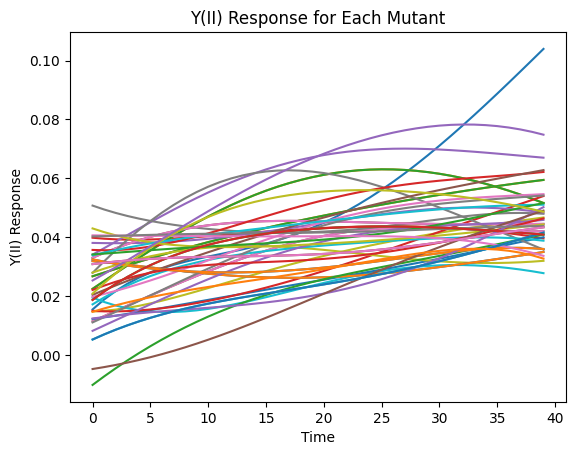

In [271]:
Data_analysis_func.plot_y2(data_smoothed[(data_smoothed['outlier_divergent_end_up_y2'] == True) & (data_smoothed['light_regime'] == '20h_HL')].iloc[:1000])

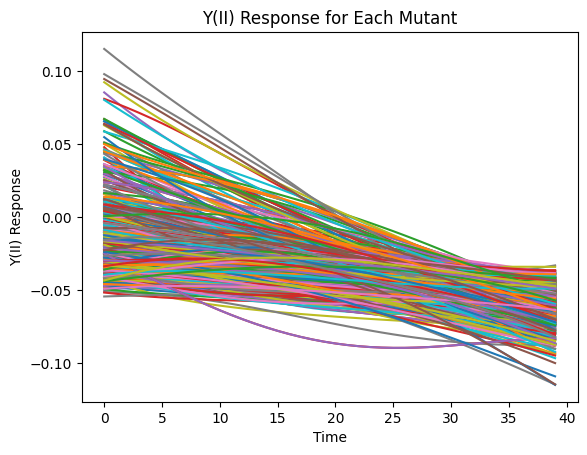

In [270]:
Data_analysis_func.plot_y2(data_smoothed[(data_smoothed['outlier_divergent_end_down_y2'] == True) & (data_smoothed['light_regime'] == '20h_HL')].iloc[:1000])

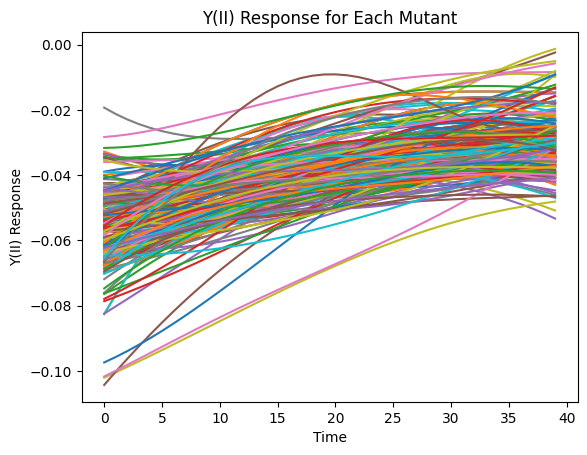

In [269]:
Data_analysis_func.plot_y2(data_smoothed[(data_smoothed['outlier_divergent_beg_down_y2'] == True) & (data_smoothed['light_regime'] == '20h_HL')].iloc[:1000])

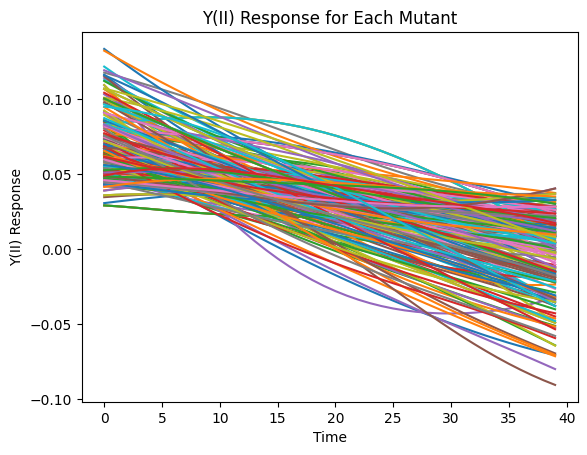

In [268]:
Data_analysis_func.plot_y2(data_smoothed[(data_smoothed['outlier_divergent_beg_up_y2'] == True) & (data_smoothed['light_regime'] == '20h_HL')].iloc[:1000])

In [347]:
# select the end_down outliers, beg_down outliers and WT of 20h_HL and do kPCA on them

data_end_down = data_smoothed[(data_smoothed['outlier_divergent_end_down_y2'] == True) & (data_smoothed['light_regime'] == '20h_HL')].iloc[:300]
data_beg_down = data_smoothed[(data_smoothed['outlier_divergent_beg_down_y2'] == True) & (data_smoothed['light_regime'] == '20h_HL')].iloc[:300]
data_WT = data_smoothed[(data_smoothed['mutant_ID'] == 'WT') & (data_smoothed['light_regime'] == '20h_HL')].iloc[:300]

data_outliers = pd.concat([data_end_down, data_beg_down, data_WT])
features_outliers = data_outliers.filter(like='y2_').dropna(axis=1).values

In [294]:
# Compute the kernel matrix
kernel_matrix_outliers = pairwise_kernels(features_outliers, metric=shape_dtw_distance)

# Perform Kernel PCA
kpca_outliers = KernelPCA(n_components=2, kernel='precomputed')
features_kpca_outliers = kpca_outliers.fit_transform(kernel_matrix_outliers)


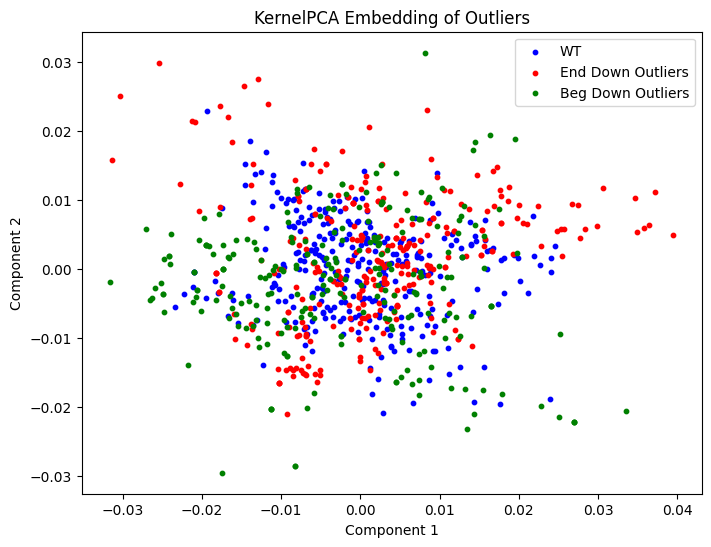

In [296]:
# Plot the KernelPCA embedding and color the points according if they are WT, end_down or beg_down outliers
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green']
plt.scatter(features_kpca_outliers[data_outliers['mutant_ID'] == 'WT', 0], features_kpca_outliers[data_outliers['mutant_ID'] == 'WT', 1], c=colors[0], s=10, label='WT')
plt.scatter(features_kpca_outliers[data_outliers['outlier_divergent_end_down_y2'] == True, 0], features_kpca_outliers[data_outliers['outlier_divergent_end_down_y2'] == True, 1], c=colors[1], s=10, label='End Down Outliers')
plt.scatter(features_kpca_outliers[data_outliers['outlier_divergent_beg_down_y2'] == True, 0], features_kpca_outliers[data_outliers['outlier_divergent_beg_down_y2'] == True, 1], c=colors[2], s=10, label='Beg Down Outliers')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('KernelPCA Embedding of Outliers')
plt.legend()
plt.show()

In [350]:
# Perform PCA
pca_outliers = PCA(n_components=2)
features_pca_outliers = pca_outliers.fit_transform(features_outliers)

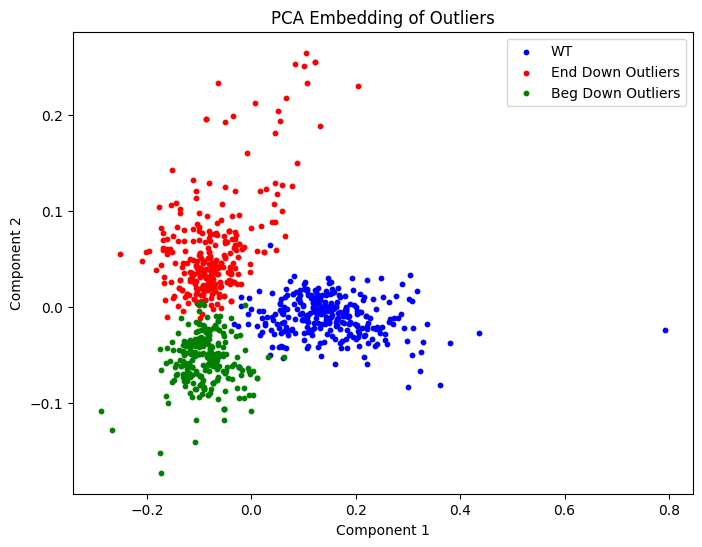

In [351]:
# Plot the PCA embedding and color the points according if they are WT, end_down or beg_down outliers
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green']
plt.scatter(features_pca_outliers[data_outliers['mutant_ID'] == 'WT', 0], features_pca_outliers[data_outliers['mutant_ID'] == 'WT', 1], c=colors[0], s=10, label='WT')
plt.scatter(features_pca_outliers[data_outliers['outlier_divergent_end_down_y2'] == True, 0], features_pca_outliers[data_outliers['outlier_divergent_end_down_y2'] == True, 1], c=colors[1], s=10, label='End Down Outliers')
plt.scatter(features_pca_outliers[data_outliers['outlier_divergent_beg_down_y2'] == True, 0], features_pca_outliers[data_outliers['outlier_divergent_beg_down_y2'] == True, 1], c=colors[2], s=10, label='Beg Down Outliers')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Embedding of Outliers')
plt.legend()
plt.show()

In [352]:
# do t-sne on the outliers
from sklearn.manifold import TSNE

# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
features_tsne_outliers = tsne.fit_transform(features_outliers)

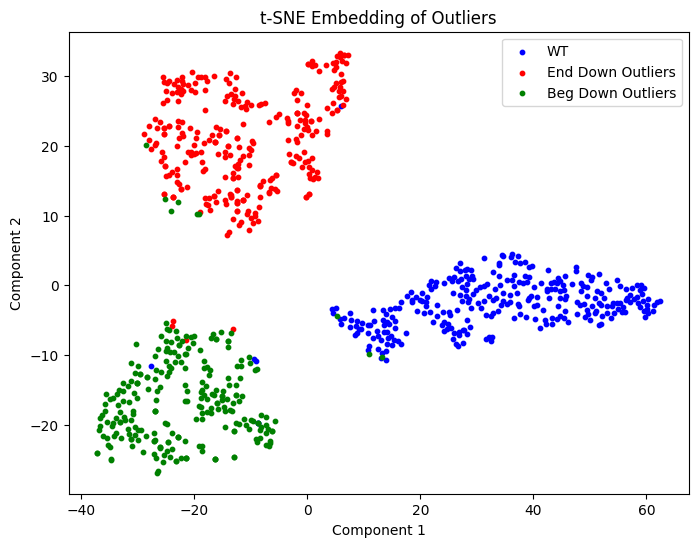

In [353]:
# Plot the t-SNE embedding and color the points according if they are WT, end_down or beg_down outliers
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green']
plt.scatter(features_tsne_outliers[data_outliers['mutant_ID'] == 'WT', 0], features_tsne_outliers[data_outliers['mutant_ID'] == 'WT', 1], c=colors[0], s=10, label='WT')
plt.scatter(features_tsne_outliers[data_outliers['outlier_divergent_end_down_y2'] == True, 0], features_tsne_outliers[data_outliers['outlier_divergent_end_down_y2'] == True, 1], c=colors[1], s=10, label='End Down Outliers')
plt.scatter(features_tsne_outliers[data_outliers['outlier_divergent_beg_down_y2'] == True, 0], features_tsne_outliers[data_outliers['outlier_divergent_beg_down_y2'] == True, 1], c=colors[2], s=10, label='Beg Down Outliers')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('t-SNE Embedding of Outliers')
plt.legend()
plt.show()

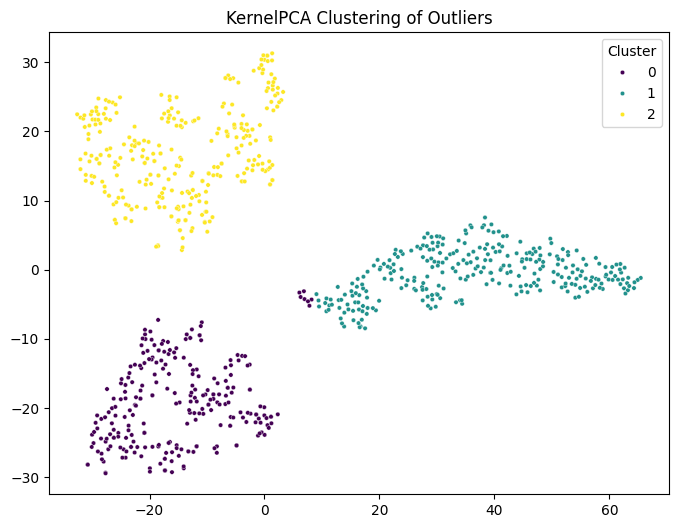

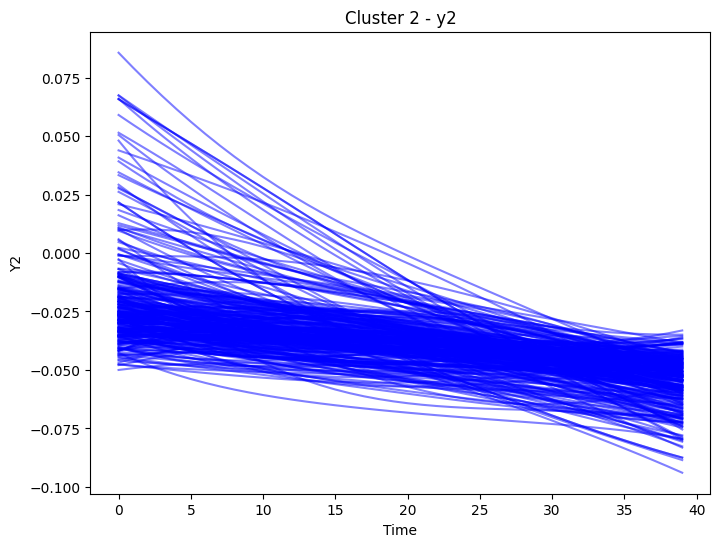

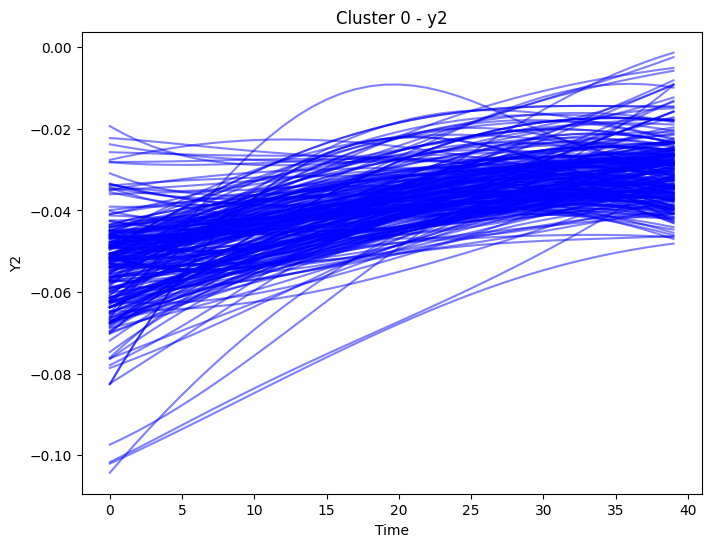

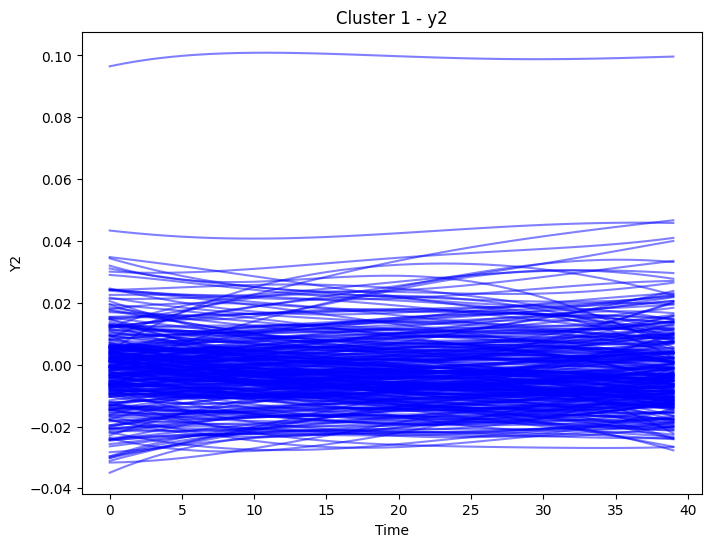

In [305]:
# cluster and show the clusters
# Perform clustering on the t-sne components
kmeans = KMeans(n_clusters=3, random_state=42)
data_outliers['Cluster'] = kmeans.fit_predict(features_tsne_outliers)
# data_outliers['Cluster'] = kmeans.fit_predict(features_pca_outliers)

# plot the clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data_outliers, x=features_tsne_outliers[:, 0], y=features_tsne_outliers[:, 1], hue='Cluster', palette='viridis', s=10)
plt.title('KernelPCA Clustering of Outliers')
plt.show()

# plot the y2 from each clusters
for cluster in data_outliers['Cluster'].unique():
    data_y2 = data_outliers[(data_outliers['Cluster'] == cluster) & (data_outliers['light_regime'] == '20h_HL')].filter(like='y2_').dropna(axis=1).values
    plt.figure(figsize=(8, 6))
    for i in range(data_y2.shape[0]):
        plt.plot(data_y2[i], c='blue', alpha=0.5)
    plt.title(f'Cluster {cluster} - y2')
    plt.xlabel('Time')
    plt.ylabel('Y2')

In [291]:
# Apply BGMM
bgmm = BayesianGaussianMixture(n_components=4)  # max_iter is optional
bgmm.fit(features_outliers)
labels_bgmm = bgmm.predict(features_outliers)

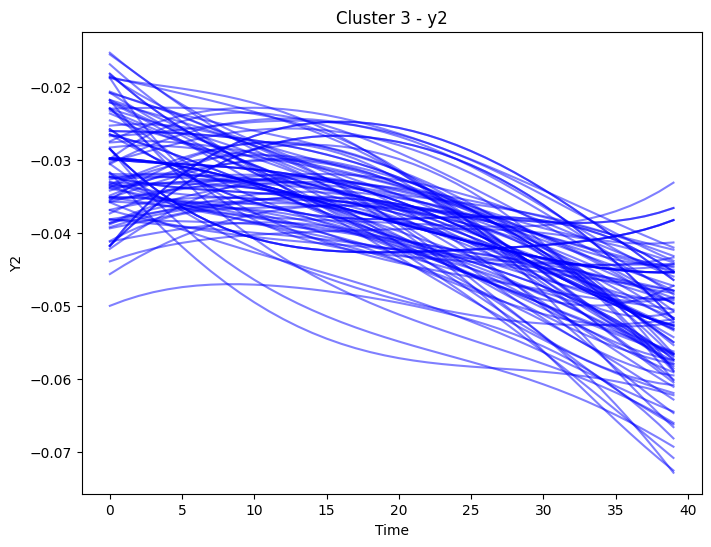

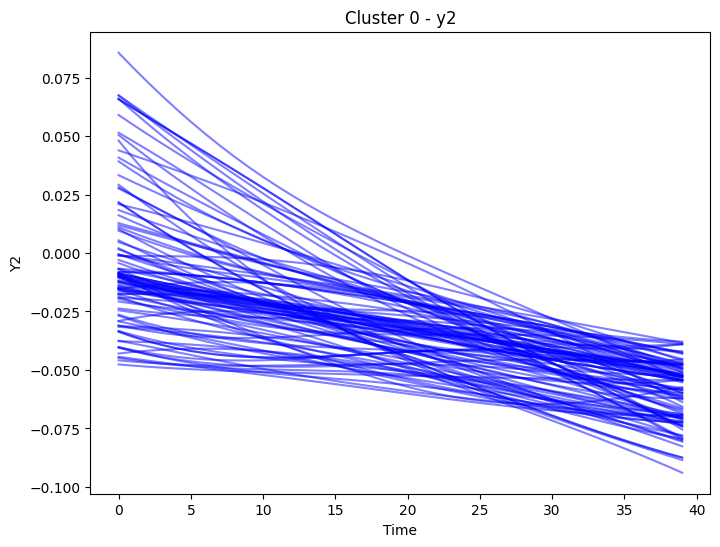

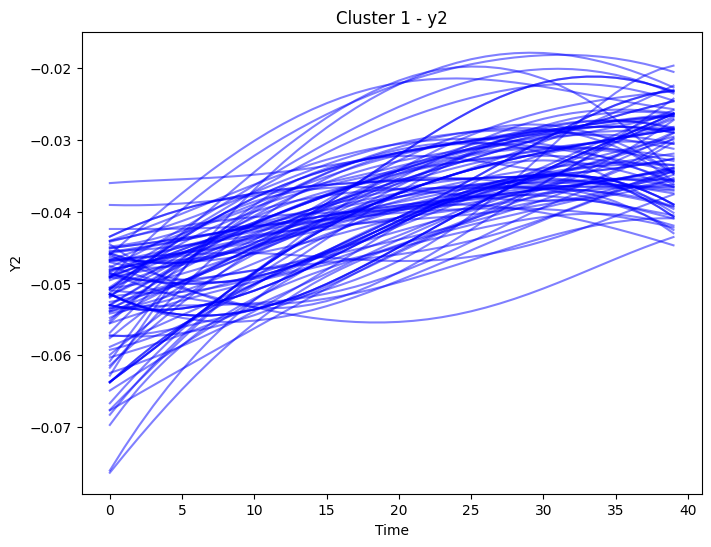

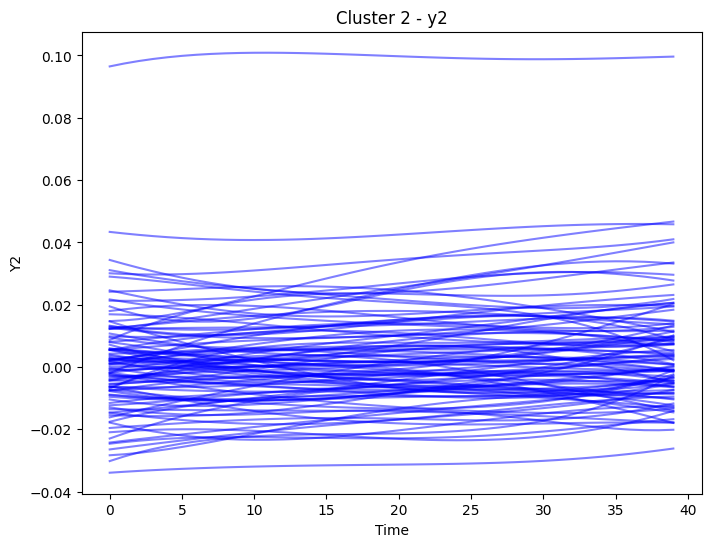

In [292]:
# plot the clusters from BGMM
data_BGMM = data_outliers.copy()
data_BGMM['Cluster'] = labels_bgmm

# plot the clusters

for cluster in data_BGMM['Cluster'].unique():
    data_y2 = data_BGMM[(data_BGMM['Cluster'] == cluster) & (data_BGMM['light_regime'] == '20h_HL')].filter(like='y2_').dropna(axis=1).values
    plt.figure(figsize=(8, 6))
    for i in range(min(100, len(data_y2))):
        plt.plot(data_y2[i], c='blue', alpha=0.5)
    plt.title(f'Cluster {cluster} - y2')
    plt.xlabel('Time')
    plt.ylabel('Y2')

In [293]:
# plot the count of WT, end_down and beg_down in each cluster
cluster_counts_BGMM = data_BGMM[data_BGMM['mutant_ID'] == 'WT']['Cluster'].value_counts()/len(data_BGMM[data_BGMM['mutant_ID'] == 'WT'])

print('Number of WT :', len(data_BGMM[data_BGMM['mutant_ID'] == 'WT']))

print("Proportion of WT in each cluster for BGMM:")
print(cluster_counts_BGMM)


Number of WT : 301
Proportion of WT in each cluster for BGMM:
Cluster
2    0.970100
0    0.019934
1    0.009967
Name: count, dtype: float64


In [354]:
data_HL = data_smoothed[(data_smoothed['light_regime'] == '20h_HL')]
features_HL = data_HL.filter(like='y2_').dropna(axis=1).values

In [312]:
# do t-sne
# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42)
features_tsne_HL = tsne.fit_transform(features_HL)

In [361]:
features_HL_raw = data_norm_flagged[data_norm_flagged['light_regime'] == '20h_HL'].filter(like='y2_').dropna(axis=1).values

# Perform t-SNE
tsne_raw = TSNE(n_components=2, random_state=42)
features_tsne_HL_raw = tsne_raw.fit_transform(features_HL_raw)

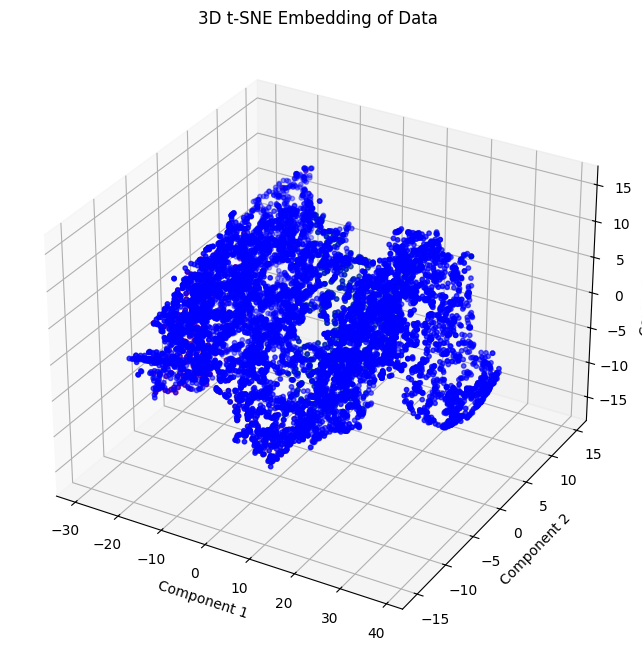

In [322]:
# Plot the 3D t-SNE embedding and make it interactive
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(features_tsne_3D_HL[:, 0], features_tsne_3D_HL[:, 1], features_tsne_3D_HL[:, 2], c='blue', s=10)
ax.scatter(features_tsne_3D_HL[data_HL['mutant_ID'] == 'WT', 0], features_tsne_3D_HL[data_HL['mutant_ID'] == 'WT', 1], features_tsne_3D_HL[data_HL['mutant_ID'] == 'WT', 2], c='red', s=10, label='WT')
ax.scatter(features_tsne_3D_HL[data_HL['outlier_divergent_end_down_y2'] == True, 0], features_tsne_3D_HL[data_HL['outlier_divergent_end_down_y2'] == True, 1], features_tsne_3D_HL[data_HL['outlier_divergent_end_down_y2'] == True, 2], c='green', s=10, label='End Down Outliers')
ax.scatter(features_tsne_3D_HL[data_HL['outlier_divergent_beg_down_y2'] == True, 0], features_tsne_3D_HL[data_HL['outlier_divergent_beg_down_y2'] == True, 1], features_tsne_3D_HL[data_HL['outlier_divergent_beg_down_y2'] == True, 2], c='orange', s=10, label='Beg Down Outliers')
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
plt.title('3D t-SNE Embedding of Data')
plt.show()

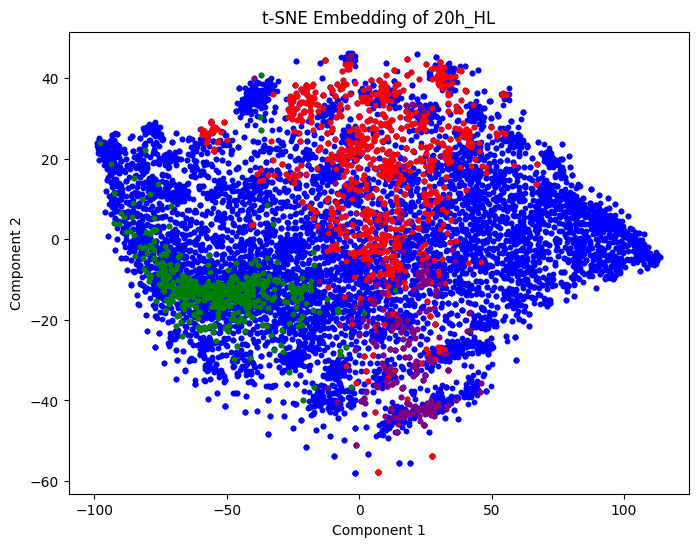

In [362]:
# Plot the t-SNE embedding and color the points according if they are WT, end_down or beg_down outliers
plt.figure(figsize=(8, 6))
plt.scatter(features_tsne_HL_raw[:, 0], features_tsne_HL_raw[:, 1], c='blue', s=10)
# plot the right color the outliers
plt.scatter(features_tsne_HL_raw[data_HL['mutant_ID'] == 'WT', 0], features_tsne_HL_raw[data_HL['mutant_ID'] == 'WT', 1], c='green', s=10)
plt.scatter(features_tsne_HL_raw[data_HL['outlier_divergent_end_down_y2'] == True, 0], features_tsne_HL_raw[data_HL['outlier_divergent_end_down_y2'] == True, 1], c='red', s=10)
plt.scatter(features_tsne_HL_raw[data_HL['outlier_divergent_beg_down_y2'] == True, 0], features_tsne_HL_raw[data_HL['outlier_divergent_beg_down_y2'] == True, 1], c='purple', s=10)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('t-SNE Embedding of 20h_HL')
plt.show()

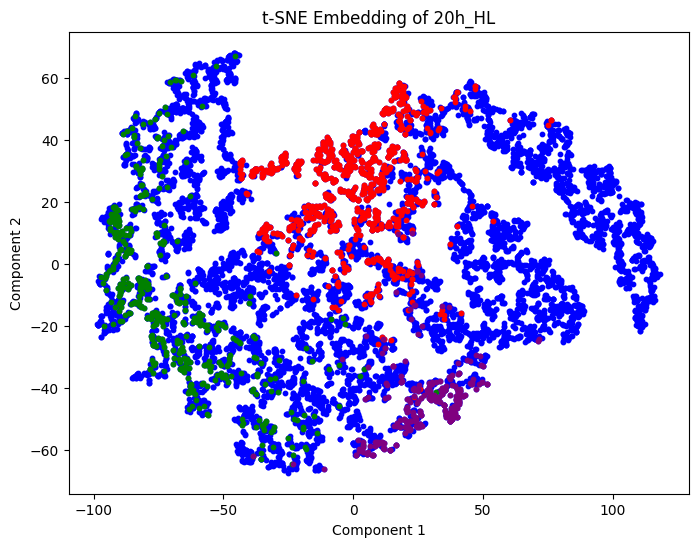

In [314]:
# Plot the t-SNE embedding and color the points according if they are WT, end_down or beg_down outliers
plt.figure(figsize=(8, 6))
plt.scatter(features_tsne_HL[:, 0], features_tsne_HL[:, 1], c='blue', s=10)
# plot the right color the outliers
plt.scatter(features_tsne_HL[data_HL['mutant_ID'] == 'WT', 0], features_tsne_HL[data_HL['mutant_ID'] == 'WT', 1], c='green', s=10)
plt.scatter(features_tsne_HL[data_HL['outlier_divergent_end_down_y2'] == True, 0], features_tsne_HL[data_HL['outlier_divergent_end_down_y2'] == True, 1], c='red', s=10)
plt.scatter(features_tsne_HL[data_HL['outlier_divergent_beg_down_y2'] == True, 0], features_tsne_HL[data_HL['outlier_divergent_beg_down_y2'] == True, 1], c='purple', s=10)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('t-SNE Embedding of 20h_HL')
plt.show()

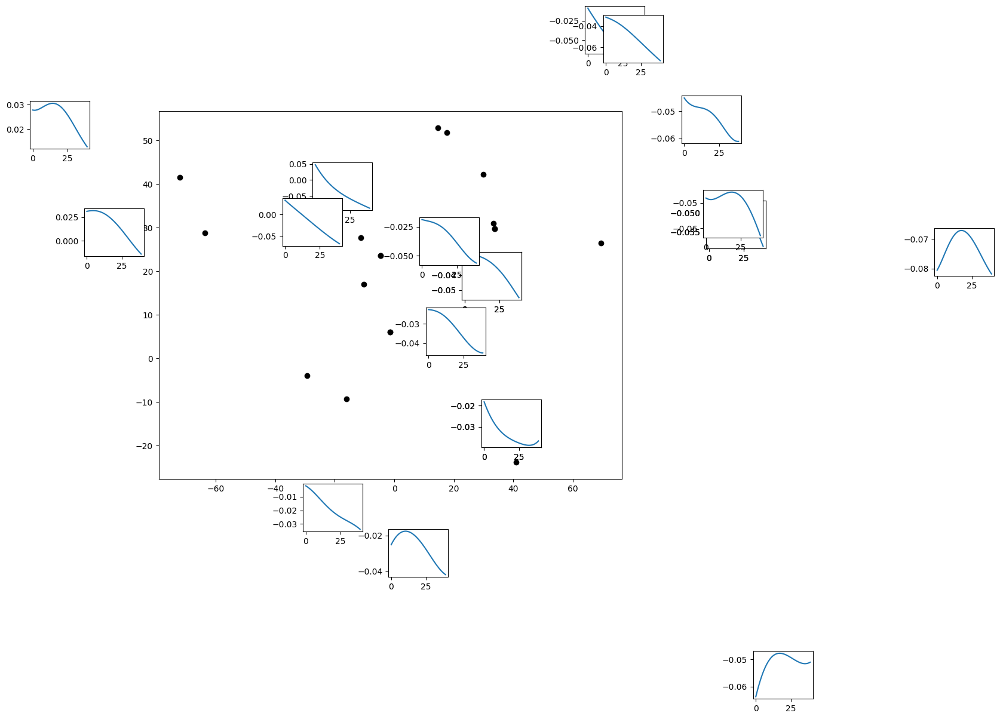

In [476]:
N=10

fig, ax = plt.subplots(figsize=(10, 8))

# scatter = ax.scatter(features_kpca[:, 0], features_kpca[:, 1], c='blue', s=10)

for i in range(20):
    # Plot the original time-series at the position of the PCA result
    ax.plot(features_tsne_HL[i, 0], features_tsne_HL[i, 1], 'ko')  # Mark the point with a black dot
    
    # Add a subplot at the PCA position to display the original time-series
    x_pos = (features_tsne_HL[i, 0] - features_tsne_HL[:, 0][:N].min())/(features_tsne_HL[:, 0][:N].max() - features_tsne_HL[:, 0][:N].min())
    y_pos = (features_tsne_HL[i, 1] - features_tsne_HL[:, 1][:N].min())/(features_tsne_HL[:, 1][:N].max() - features_tsne_HL[:, 1][:N].min())
    rect = [x_pos, y_pos, 0.1, 0.1]
    ax_inset = fig.add_axes(rect)
    ax_inset.plot(features_HL[i])
    # ax_inset.set_title(f'Time-series {i}')
    # ax_inset.axis('off')  # Turn off axes for the inset plot

# plt.xlabel('PCA Component 1')
# plt.ylabel('PCA Component 2')
# plt.title('PCA of Time-Series Data with Original Time-Series')

# plt.tight_layout()
plt.show()

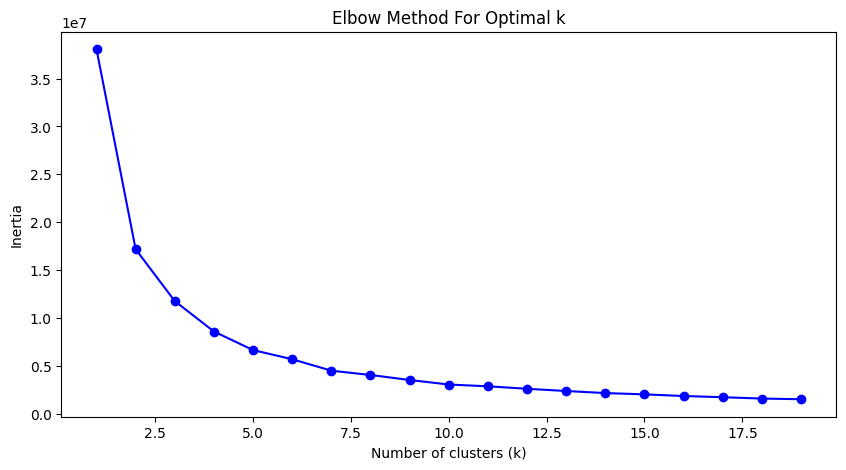

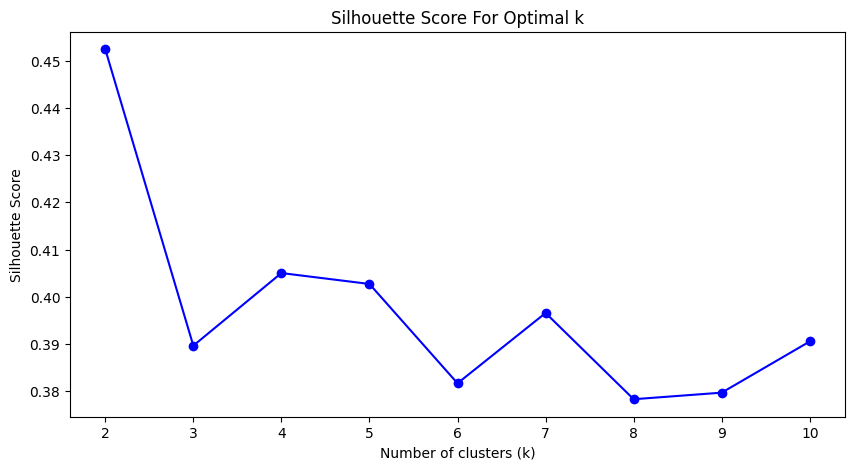

Best number of clusters according to Silhouette Score: 2


In [485]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs

X = features_tsne_HL

# Elbow Method
inertia = []
K = range(1, 20)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 5))
plt.plot(K, inertia, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')
plt.show()

# Silhouette Score
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X)
    score = silhouette_score(X, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 5))
plt.plot(range(2, 11), silhouette_scores, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score For Optimal k')
plt.show()

# Print the best k according to Silhouette Score
best_k = range(2, 11)[np.argmax(silhouette_scores)]
print(f'Best number of clusters according to Silhouette Score: {best_k}')


In [487]:
# count the number of WT in each cluster
cluster_counts_HL = data_HL[data_HL['mutant_ID'] == 'WT']['Cluster'].value_counts()/len(data_HL[data_HL['mutant_ID'] == 'WT'])

print('Number of WT :', len(data_HL[data_HL['mutant_ID'] == 'WT']))

print("Proportion of WT in each cluster for t-SNE:")
print(cluster_counts_HL)

Number of WT : 449
Proportion of WT in each cluster for t-SNE:
Cluster
4    0.625835
2    0.314031
1    0.060134
Name: count, dtype: float64


In [196]:
feature_red_grad = Clusters.dim_reduc(data_smoothed, method='mds', light_regime='20h_HL', metric=Clusters.euclidian_distance, n_components=2, n_samples=3000)

TypeError: int() argument must be a string, a bytes-like object or a real number, not '_NoValueType'

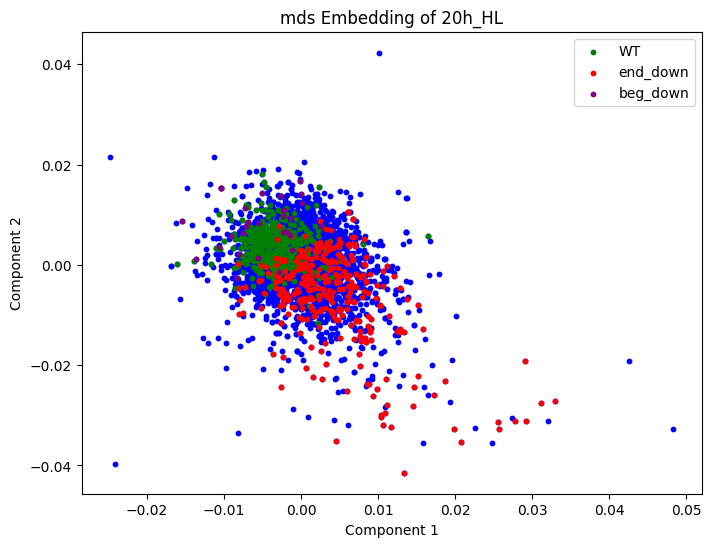

In [8]:
feature_red = Clusters.dim_reduc(data_smoothed, method='mds', metric=Clusters.grad_distance, n_components=2, n_samples=3000)

In [173]:
feature_red_1min = Clusters.dim_reduc(data_smoothed, method='mds', metric=Clusters.dtw_grad_distance, n_components=2, n_samples=1000)

KeyboardInterrupt: 

In [186]:
pip install -vvv --upgrade --no-cache-dir --force-reinstall dtaidistance

Using pip 24.0 from /Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/.venv/lib/python3.11/site-packages/pip (python 3.11)
Non-user install because user site-packages disabled
Created temporary directory: /private/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/pip-build-tracker-4t2te1hn
Initialized build tracking at /private/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/pip-build-tracker-4t2te1hn
Created build tracker: /private/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/pip-build-tracker-4t2te1hn
Entered build tracker: /private/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/pip-build-tracker-4t2te1hn
Created temporary directory: /private/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/pip-install-fzm0cozc
Created temporary directory: /private/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/pip-ephem-wheel-cache-fakiav2o
1 location(s) to search for versions of dtaidistance:
* https://pypi.org/simple/dtaidistance/
Fetching project page and analyzing links: h

In [187]:
dtw.try_import_c(verbose=True)

[autoreload of numpy failed: Traceback (most recent call last):
  File "/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/.venv/lib/python3.11/site-packages/IPython/extensions/autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/.venv/lib/python3.11/site-packages/IPython/extensions/autoreload.py", line 475, in superreload
    module = reload(module)
             ^^^^^^^^^^^^^^
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 621, in _exec
  File "<frozen importlib._bootstrap_external>", line 940, in exec_module
  File "<frozen importlib._bootstrap>", line 241, in _call_with_frames_removed
  File "/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/.venv/lib/python3.11/site-packages/numpy/__init__

Cannot import OMP-based library (dtw_cc_omp)
Cannot import Numpy-based library (dtw_cc_numpy)

Not all libraries are available in your installation. 
You can rerun the compilation from source or pip install in verbose mode:
pip install -vvv --upgrade --force-reinstall --no-deps --no-binary dtaidistance dtaidistance
In case you need to use an older version of numpy, compile against your current installation:
pip install -vvv --upgrade --force-reinstall --no-deps --no-build-isolation --no-binary dtaidistance dtaidistance

Share the following information when submitting a bug report:
== Packages ==
- Cannot import OMP-based library (dtw_cc_omp)
- dlopen(/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/.venv/lib/python3.11/site-packages/dtaidistance/dtw_cc_omp.cpython-311-darwin.so, 0x0002): Library not loaded: /opt/homebrew/opt/libomp/lib/libomp.dylib
  Referenced from: <1EF210F1-F5D5-3143-95D8-8B6725A568C6> /Users/samsongourevitch/Documents/Chlamy_Project_Github/Chl

False

In [194]:
data_smoothed

[autoreload of Clusters failed: Traceback (most recent call last):
  File "/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/.venv/lib/python3.11/site-packages/IPython/extensions/autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/.venv/lib/python3.11/site-packages/IPython/extensions/autoreload.py", line 475, in superreload
    module = reload(module)
             ^^^^^^^^^^^^^^
  File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 621, in _exec
  File "<frozen importlib._bootstrap_external>", line 940, in exec_module
  File "<frozen importlib._bootstrap>", line 241, in _call_with_frames_removed
  File "/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Clusters.py", line 166, in <module>
    def di

TypeError: int() argument must be a string, a bytes-like object or a real number, not '_NoValueType'

TypeError: int() argument must be a string, a bytes-like object or a real number, not '_NoValueType'

In [191]:
data_smoothed

TypeError: int() argument must be a string, a bytes-like object or a real number, not '_NoValueType'

TypeError: int() argument must be a string, a bytes-like object or a real number, not '_NoValueType'

In [190]:
y2_ts = data_smoothed[data_smoothed['light_regime'] == '20h_HL'].iloc[:1000].filter(like='y2_').dropna(axis=1).values

TypeError: int() argument must be a string, a bytes-like object or a real number, not '_NoValueType'

In [188]:
from dtaidistance import dtw

y2_ts = data_smoothed[data_smoothed['light_regime'] == '20h_HL'].iloc[:1000].filter(like='y2_').dropna(axis=1).values
matrix = dtw.distance_matrix_fast(y2_ts)

TypeError: int() argument must be a string, a bytes-like object or a real number, not '_NoValueType'

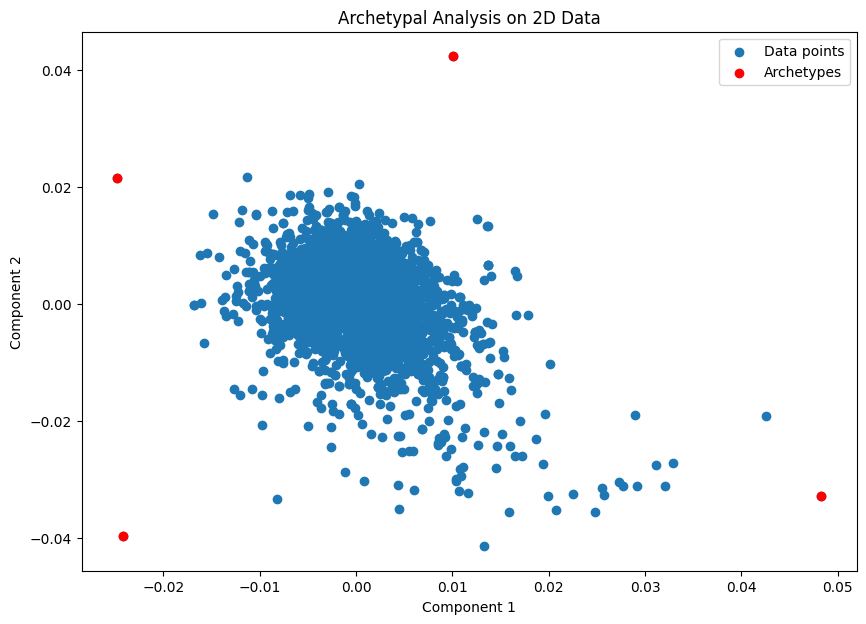

In [9]:
from archetypes import AA

n_archetypes = 4

# Perform AA
aa = AA(n_archetypes)
aa.fit(feature_red)
archetypes = aa.archetypes_

# Step 3: Plot the 2D data points and archetypes
plt.figure(figsize=(10, 7))
plt.scatter(feature_red[:, 0], feature_red[:, 1], label='Data points')
plt.scatter(archetypes[:, 0], archetypes[:, 1], color='red', label='Archetypes')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Archetypal Analysis on 2D Data')
plt.legend()
plt.show()

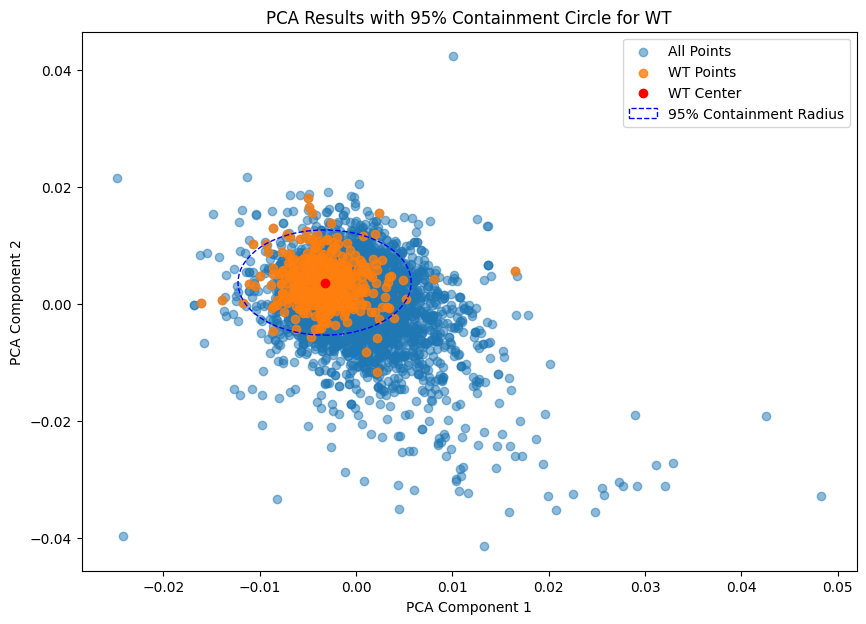

In [152]:
data_smoothed_HL = data_smoothed[data_smoothed['light_regime'] == '20h_HL'].iloc[:3000]

data_smoothed_HL['mds_1'] = feature_red[:, 0]
data_smoothed_HL['mds_2'] = feature_red[:, 1]

# plot the associated y2 ts to the archetypes
features_HL = data_smoothed[data_smoothed['light_regime'] == '20h_HL'].iloc[:3000].filter(like='y2_').dropna(axis=1).values

wt_points = data_smoothed_HL[data_smoothed_HL['mutant_ID'] == 'WT'][['mds_1', 'mds_2']]
wt_center = wt_points.mean().values
wt_distances = np.linalg.norm(wt_points.values - wt_center, axis=1)
radius = np.percentile(wt_distances, 95)

# Plotting the points and the circle
plt.figure(figsize=(10, 7))
plt.scatter(data_smoothed_HL['mds_1'], data_smoothed_HL['mds_2'], label='All Points', alpha=0.5)
plt.scatter(wt_points['mds_1'], wt_points['mds_2'], label='WT Points', alpha=0.8)
plt.scatter(wt_center[0], wt_center[1], color='red', label='WT Center')

# Add a circle to represent the 95% containment radius
circle = plt.Circle(wt_center, radius, color='blue', fill=False, linestyle='--', label='95% Containment Radius')
plt.gca().add_patch(circle)

plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.title('PCA Results with 95% Containment Circle for WT')
plt.show()

In [156]:
data_smoothed_HL.reset_index(drop=True, inplace=True)
data_smoothed_HL['shape_cluster'] = 0

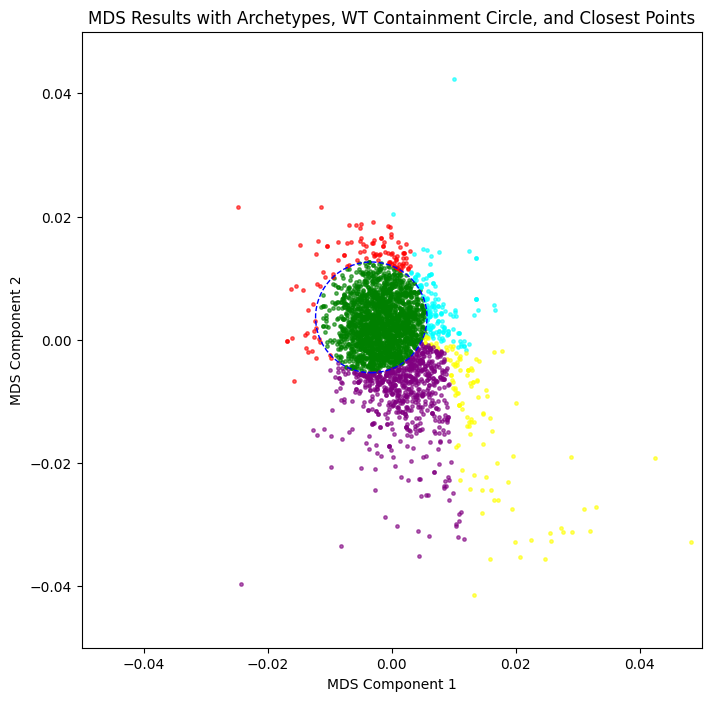

In [162]:
from collections import defaultdict

distances_to_wt_center = np.linalg.norm(archetypes - wt_center, axis=1)
distances_to_ball_edge = distances_to_wt_center - radius
# Get the 10 closest data points to each archetype
closest_points_list = []
for i, archetype in enumerate(archetypes):
    distances = np.linalg.norm(feature_red - archetype, axis=1)
    # append the idx of the points that have distance less than distances_to_ball_edge[i]
    closest_points = np.where(distances < distances_to_ball_edge[i])[0]
    closest_points_list.append(closest_points)
    
distances_to_wt_center = np.linalg.norm(data_smoothed_HL[['mds_1', 'mds_2']].values - wt_center, axis=1)

# Identify points outside the WT circle
points_outside_circle = data_smoothed_HL[distances_to_wt_center > radius]
points_inside_circle = data_smoothed_HL[distances_to_wt_center <= radius]

# # Initialize the list to store closest points for each archetype
# closest_points_list = defaultdict(list)

# # Assign each point outside the WT circle to the closest archetype
# for idx, point in points_outside_circle.iterrows():
#     point_coords = point[['mds_1', 'mds_2']].values.astype(float)
#     distances_to_archetypes = np.linalg.norm(archetypes - point_coords, axis=1)
#     closest_archetype_index = np.argmin(distances_to_archetypes)
#     closest_points_list[closest_archetype_index].append(idx)

# Initialize the list to store closest points for each archetype
closest_points_list = defaultdict(list)

for idx, point_coords in enumerate(data_smoothed_HL[['mds_1', 'mds_2']].values):
    point_vector = point_coords - wt_center
    if np.linalg.norm(point_vector) <= radius:
        data_smoothed_HL.loc[idx, 'shape_cluster'] = 0
    else :
        closest_archetype_index = None
        closest_distance = np.inf

        # Check each archetype to see if the point is in front and find the closest one
        for i, archetype in enumerate(archetypes):
            archetype_vector = archetype - wt_center
            dot_product = np.dot(point_vector, archetype_vector)

            # Check if point is in front of the WT circle relative to the archetype
            if dot_product > 0:
                distance_to_archetype = np.linalg.norm(point_coords - archetype)
                if distance_to_archetype < closest_distance:
                    closest_distance = distance_to_archetype
                    closest_archetype_index = i

        if closest_archetype_index is not None:
            closest_points_list[closest_archetype_index].append(idx)
            data_smoothed_HL.loc[idx, 'shape_cluster'] = closest_archetype_index + 1

closest_points_list = [closest_points_list[i] for i in range(len(archetypes))]
colors = ['green', 'cyan', 'red', 'yellow', 'purple']
plt.figure(figsize=(8, 8))
# # Plot closest points and circles for each archetype
# plt.scatter(data_smoothed_HL['mds_1'], data_smoothed_HL['mds_2'], s=6)
# for i, archetype in enumerate(archetypes):
#     closest_points = closest_points_list[i]
#     plt.scatter(data_smoothed_HL['mds_1'].iloc[closest_points], data_smoothed_HL['mds_2'].iloc[closest_points], color=colors[i], alpha=0.6, label=f'Closest Points to Archetype {i}', s=6)
#     # plt.scatter(points_outside_circle['mds_1'].iloc[closest_points], points_outside_circle['mds_2'].iloc[closest_points], color=colors[i], alpha=0.6, label=f'Closest Points to Archetype {i}', s=6)
#     plt.scatter(archetypes[i, 0], archetypes[i, 1], color=colors[i], label='Archetypes')
#     # archetype_circle = plt.Circle(archetype, distances_to_ball_edge[i], color=colors[i], fill=False, linestyle='--')
#     # plt.gca().add_patch(archetype_circle)

# plot each shape cluster
for i in range(len(data_smoothed_HL['shape_cluster'].unique())):
    data_cluster = data_smoothed_HL[data_smoothed_HL['shape_cluster'] == i]
    plt.scatter(data_cluster['mds_1'], data_cluster['mds_2'], color=colors[i], alpha=0.6, label=f'Cluster {i}', s=6)

# plt.scatter(wt_points['mds_1'], wt_points['mds_2'], label='WT Points', color='green', alpha=0.6, s=6)
circle = plt.Circle(wt_center, radius, color='blue', fill=False, linestyle='--', label='95% Containment Radius')
plt.gca().add_patch(circle)

plt.xlabel('MDS Component 1')
plt.ylabel('MDS Component 2')
plt.xlim(-0.05, 0.05)
plt.ylim(-0.05, 0.05)
# plt.legend()
plt.title('MDS Results with Archetypes, WT Containment Circle, and Closest Points')
plt.show()

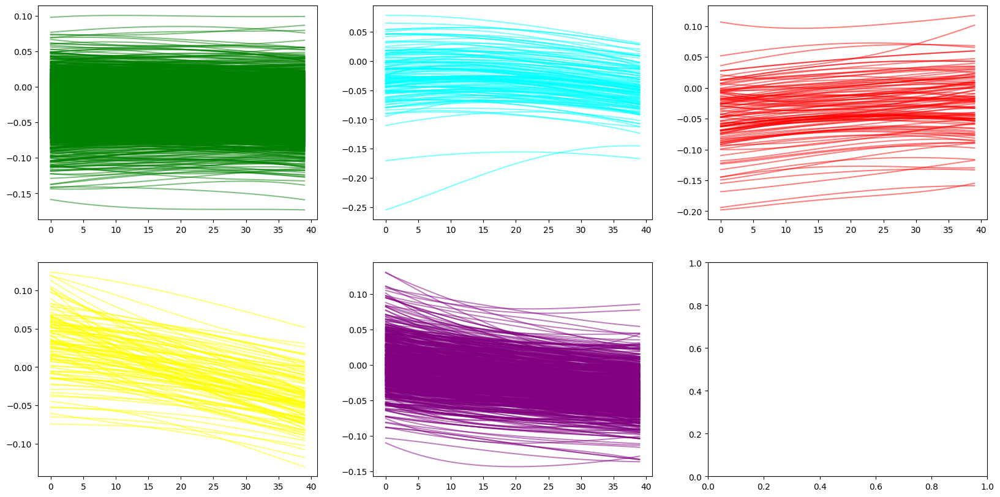

In [163]:
from collections import Counter

all_points = [point for sublist in closest_points_list for point in sublist]

# Count the occurrences of each point
point_counts = Counter(all_points)

# Filter the elements that appear exactly once
unique_points = [point for point, count in point_counts.items() if count == 1]

# Now we need to separate these unique points back into their respective closest_points_list
filtered_closest_points_list = []
for sublist in closest_points_list:
    filtered_sublist = [point for point in sublist if point_counts[point] == 1]
    filtered_closest_points_list.append(filtered_sublist)

# closest_points_list = [i for sublist in closest_points for i in sublist]

# Plot the closest time series to each archetype
plt.subplots(2, 3, figsize=(20, 10))
# for i, closest_points in enumerate(closest_points_list):
#     for closest_point in closest_points:
#         plt.subplot(2, 3, i+1)
#         # plt.plot(data_smoothed_HL.iloc[closest_point].filter(like='y2_').values, c=colors[i], alpha=0.5)
#         plt.plot(points_outside_circle.iloc[closest_point].filter(like='y2_').values, c=colors[i], alpha=0.5)
#     plt.title(f'Closest Time Series to Archetype {i}')
#     plt.xlabel('Time')
#     plt.ylabel('Y2')

for i in range(len(data_smoothed_HL['shape_cluster'].unique())):
    data_cluster = data_smoothed_HL[data_smoothed_HL['shape_cluster'] == i]
    for idx in data_cluster.index:
        plt.subplot(2, 3, i+1)
        plt.plot(data_cluster.loc[idx].filter(like='y2_').values, c=colors[i], alpha=0.5)

# plt.subplot(2, 3, 5)
# plt.plot(points_inside_circle.filter(like='y2_').values.T, c='green', alpha=0.5)
# plt.title('Closest Time Series to Archetypes')
# plt.xlabel('Time')
# plt.ylabel('Y2')
# plt.legend()
plt.show()

(array([  4.,  53., 157., 135.,  43.,   8.,   1.,   1.,   0.,   1.]),
 array([-4.26255685e-02, -2.84047475e-02, -1.41839264e-02,  3.68946327e-05,
         1.42577157e-02,  2.84785367e-02,  4.26993578e-02,  5.69201788e-02,
         7.11409999e-02,  8.53618209e-02,  9.95826419e-02]),
 <BarContainer object of 10 artists>)

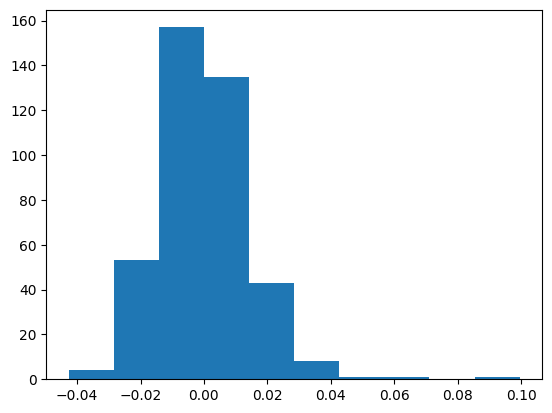

In [165]:
plt.hist(data_smoothed_HL[data_smoothed_HL['mutant_ID'] == 'WT']['mean_y2'])

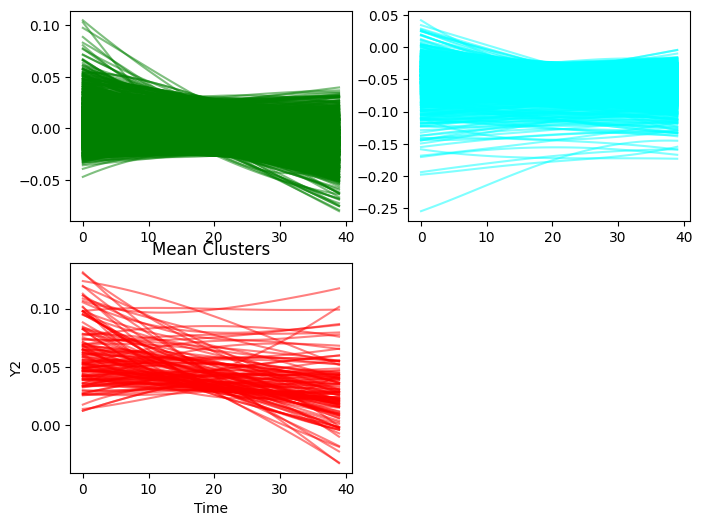

In [171]:
# create three mean_clusters, one for mean below 95% of the WT mean_y2, one for mean above 95% of the WT mean_y2 and one for the rest
mean_y2_WT = data_smoothed_HL[data_smoothed_HL['mutant_ID'] == 'WT']['mean_y2'].values
# get an interval where 95% of the WT are
wt_mean = data_smoothed_HL[data_smoothed_HL['mutant_ID'] == 'WT']['mean_y2'].values

for i in range(len(data_smoothed_HL['shape_cluster'].unique())):
    data_cluster = data_smoothed_HL[data_smoothed_HL['shape_cluster'] == i]
    for idx in data_cluster.index:
        plt.subplot(2, 3, i+1)
        plt.plot(data_cluster.loc[idx].filter(like='y2_').values, c=colors[i], alpha=0.5)

# get the 95% interval
interval = np.percentile(wt_mean, [2.5, 97.5])

data_smoothed_HL['mean_cluster'] = 0

for idx in data_smoothed_HL.index:
    if data_smoothed_HL.loc[idx, 'mean_y2'] < interval[0]:
        data_smoothed_HL.loc[idx, 'mean_cluster'] = 1
    elif data_smoothed_HL.loc[idx, 'mean_y2'] >= interval[1]:
        data_smoothed_HL.loc[idx, 'mean_cluster'] = 2

# plot the mean clusters
plt.figure(figsize=(8, 6))
plt.subplot(2, 2, 1)
for i in range(data_smoothed_HL['mean_cluster'].nunique()):
    data_cluster = data_smoothed_HL[data_smoothed_HL['mean_cluster'] == i]
    plt.subplot(2, 2, i+1)
    for idx in data_cluster.index:
        plt.plot(data_cluster.loc[idx].filter(like='y2_').values, c=colors[i], alpha=0.5)

plt.title('Mean Clusters')
plt.xlabel('Time')
plt.ylabel('Y2')
plt.show()

In [ ]:
feature_red_HL = Clusters.dim_reduc(data_smoothed, method='mds', metric=Clusters.grad_distance, n_components=2, n_samples=3000)

aa = AA(n_archetypes)
aa.fit(feature_red)
archetypes = aa.archetypes_

closest_points_list = defaultdict(list)

for idx, point_coords in enumerate(data_smoothed_HL[['mds_1', 'mds_2']].values):
    point_vector = point_coords - wt_center
    if np.linalg.norm(point_vector) <= radius:
        data_smoothed_HL.loc[idx, 'shape_cluster'] = 0
    else :
        closest_archetype_index = None
        closest_distance = np.inf

        # Check each archetype to see if the point is in front and find the closest one
        for i, archetype in enumerate(archetypes):
            archetype_vector = archetype - wt_center
            dot_product = np.dot(point_vector, archetype_vector)

            # Check if point is in front of the WT circle relative to the archetype
            if dot_product > 0:
                distance_to_archetype = np.linalg.norm(point_coords - archetype)
                if distance_to_archetype < closest_distance:
                    closest_distance = distance_to_archetype
                    closest_archetype_index = i

        if closest_archetype_index is not None:
            closest_points_list[closest_archetype_index].append(idx)
            data_smoothed_HL.loc[idx, 'shape_cluster'] = closest_archetype_index + 1

# create three mean_clusters, one for mean below 95% of the WT mean_y2, one for mean above 95% of the WT mean_y2 and one for the rest
mean_y2_WT = data_smoothed_HL[data_smoothed_HL['mutant_ID'] == 'WT']['mean_y2'].values
# get an interval where 95% of the WT are
wt_mean = data_smoothed_HL[data_smoothed_HL['mutant_ID'] == 'WT']['mean_y2'].values

# get the 95% interval
interval = np.percentile(wt_mean, [2.5, 97.5])

data_smoothed_HL['mean_cluster'] = 0

for idx in data_smoothed_HL.index:
    if data_smoothed_HL.loc[idx, 'mean_y2'] < interval[0]:
        data_smoothed_HL.loc[idx, 'mean_cluster'] = 1
    elif data_smoothed_HL.loc[idx, 'mean_y2'] >= interval[1]:
        data_smoothed_HL.loc[idx, 'mean_cluster'] = 2

In [172]:
data_smoothed_HL

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq,outlier_divergent_beg_up_y2,sum_beg_up_y2,outlier_divergent_beg_

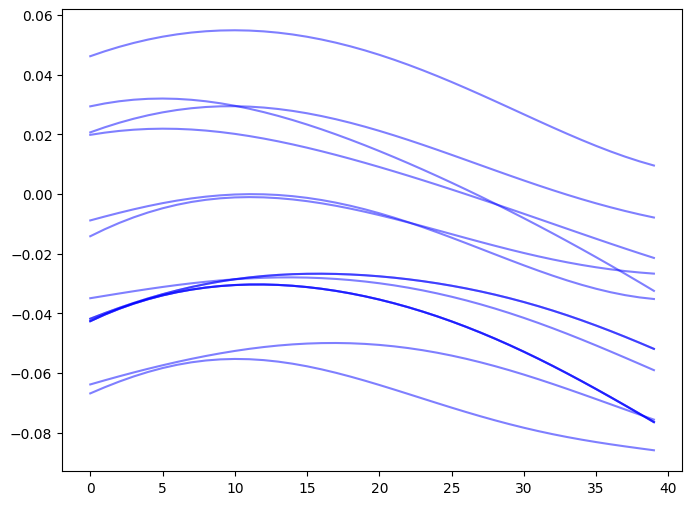

In [1165]:
region = [-0.02, -0.01, 0, 0.01]
data_y2 = data_smoothed_HL[(data_smoothed_HL['mds_1'] > region[0]) & (data_smoothed_HL['mds_1'] < region[1]) & (data_smoothed_HL['mds_2'] > region[2]) & (data_smoothed_HL['mds_2'] < region[3])].filter(like='y2_').dropna(axis=1).values
plt.figure(figsize=(8, 6))
for i in range(data_y2.shape[0]):
    plt.plot(data_y2[i], c='blue', alpha=0.5)

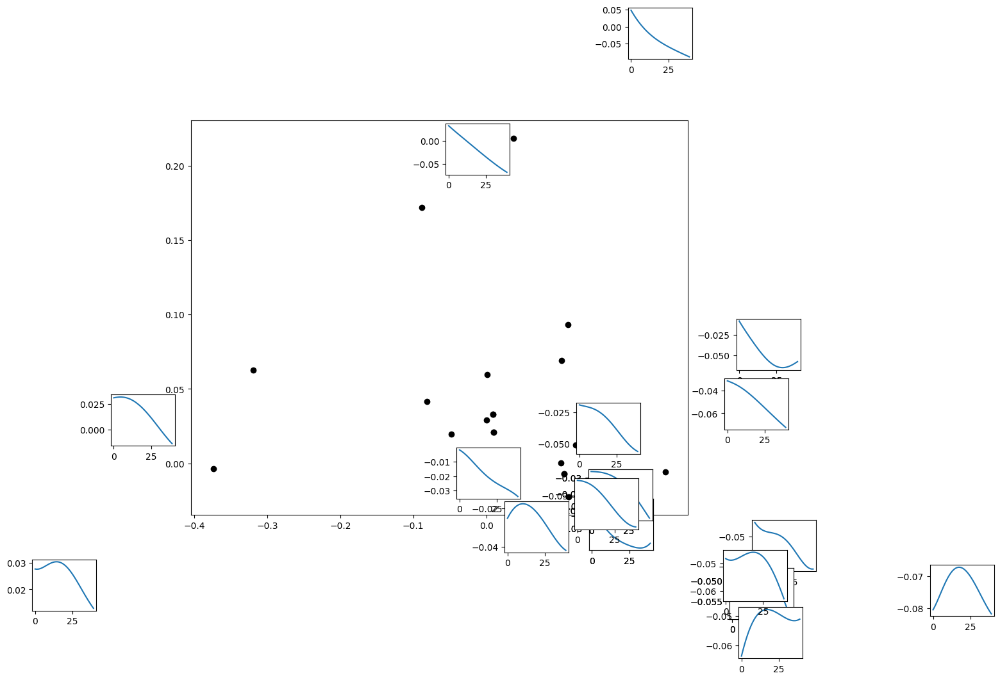

In [851]:
N=10

fig, ax = plt.subplots(figsize=(10, 8))

# scatter = ax.scatter(features_kpca[:, 0], features_kpca[:, 1], c='blue', s=10)

for i in range(20):
    # Plot the original time-series at the position of the PCA result
    ax.plot(feature_red[i, 0], feature_red[i, 1], 'ko')  # Mark the point with a black dot
    
    # Add a subplot at the PCA position to display the original time-series
    x_pos = (feature_red[i, 0] - feature_red[:, 0][:N].min())/(feature_red[:, 0][:N].max() - feature_red[:, 0][:N].min())
    y_pos = (feature_red[i, 1] - feature_red[:, 1][:N].min())/(feature_red[:, 1][:N].max() - feature_red[:, 1][:N].min())
    rect = [x_pos, y_pos, 0.1, 0.1]
    ax_inset = fig.add_axes(rect)
    ax_inset.plot(data_smoothed[data_smoothed['light_regime'] == '20h_HL'].iloc[i:i+1].filter(like='y2_').dropna(axis=1).values[0])
    # ax_inset.set_title(f'Time-series {i}')
    # ax_inset.axis('off')  # Turn off axes for the inset plot

# plt.xlabel('PCA Component 1')
# plt.ylabel('PCA Component 2')
# plt.title('PCA of Time-Series Data with Original Time-Series')

# plt.tight_layout()
plt.show()

In [1014]:
filtered_mutants = data_norm_flagged.groupby('mutant_ID').filter(lambda x: x['light_regime'].count() == 6)

# create a df with the mutant_ID and the concatenated y2 and ynpq from every condition
data_concat = pd.DataFrame()
for mutant in filtered_mutants['mutant_ID'].unique():
    data_mutant = filtered_mutants[filtered_mutants['mutant_ID'] == mutant]
    y2_mutant = data_mutant.filter(like='y2_').values
    ynpq_mutant = data_mutant.filter(like='ynpq_').values
    data_concat = pd.concat([data_concat, pd.DataFrame({'mutant_ID': mutant, 'y2': [y2_mutant], 'ynpq': [ynpq_mutant]})])

# flatten every y2 and ynpq 
data_concat['y2'] = data_concat['y2'].apply(lambda x: x.flatten())
data_concat['ynpq'] = data_concat['ynpq'].apply(lambda x: x.flatten())

0    [[0.03764482339223224, 0.06256147225697839, -0...
0    [[-0.030021230379740416, 0.03318276007970178, ...
0    [[0.04123284419377643, 0.012054701646169064, 0...
0    [[-0.07794367770353955, -0.042048315207163456,...
0    [[-0.13977575550476712, -0.03940395514170325, ...
                           ...                        
0    [[-0.060607388615608215, -0.025537540515263912...
0    [[-0.07590380311012268, -0.07755490144093835, ...
0    [[0.06417772173881531, 0.045723477999369266, 0...
0    [[-0.05456535518169403, -0.0007404287656148645...
0    [[-0.09224960207939148, -0.0798787077267965, -...
Name: y2, Length: 4815, dtype: object

In [1047]:
# concatenate y2 and ynpq
def concatenate_and_drop_nan(row):
    concatenated = np.concatenate((row['y2'], row['ynpq']))
    return concatenated[~np.isnan(concatenated)]

data_concat['concatenated'] = data_concat.apply(concatenate_and_drop_nan, axis=1)

In [1055]:
pca = PCA(n_components=3)
feature_pca = pca.fit_transform(np.array((data_concat['concatenated'].values).tolist()))

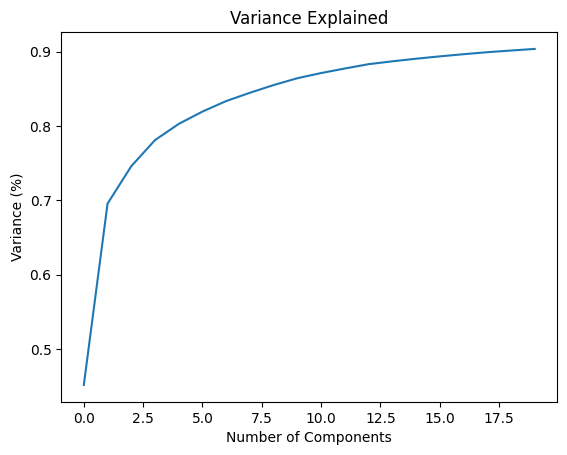

In [1054]:
pca_full = PCA(n_components=20)
# plot the variance explained
pca_full.fit(np.array((data_concat['concatenated'].values).tolist()))
plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Variance Explained')
plt.show()

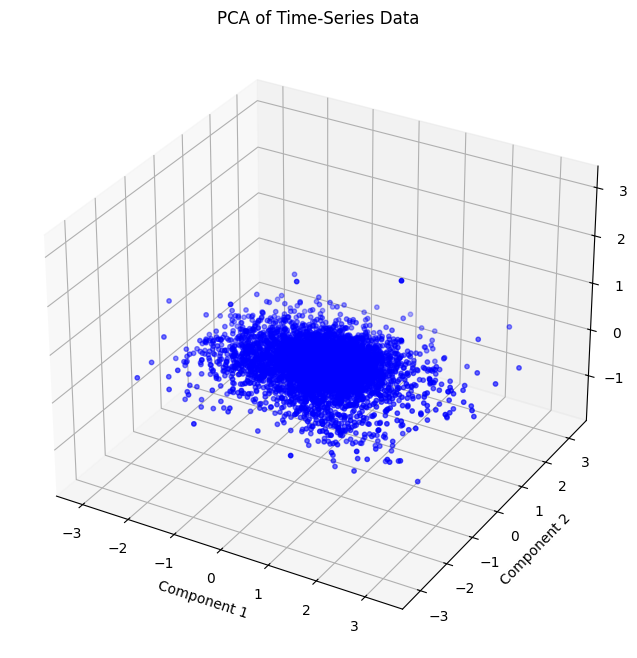

In [1056]:
# plot pca in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(feature_pca[:, 0], feature_pca[:, 1], feature_pca[:, 2], c='blue', s=10)
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
plt.title('PCA of Time-Series Data')
plt.show()

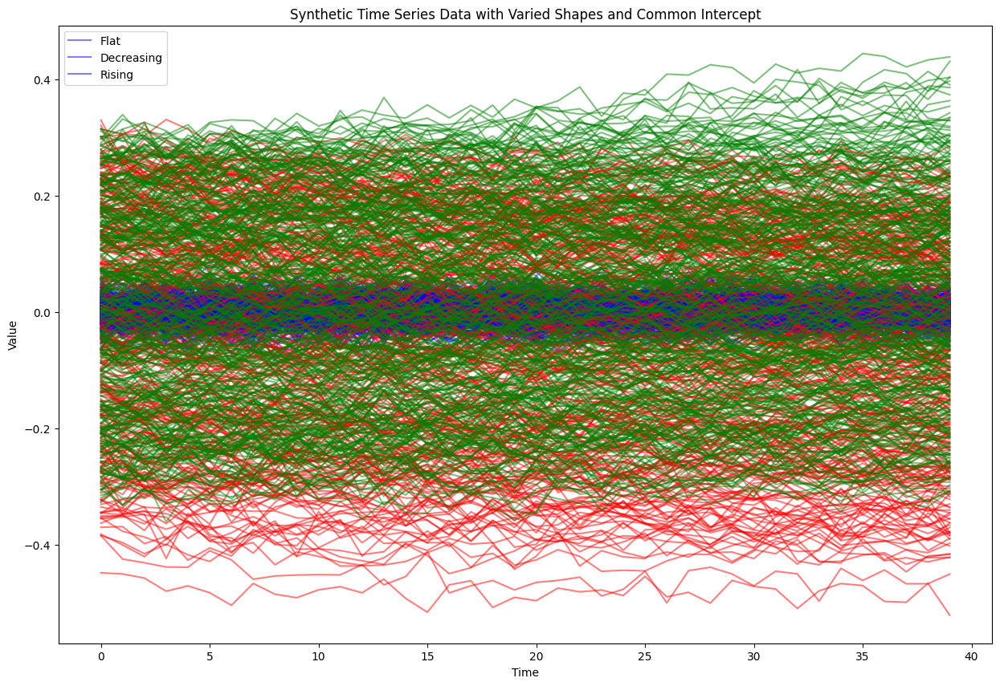

In [1080]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import expit

def generate_varied_series(cluster_type, num_series=10, length=100, magnitude_level=0.2, noise_level=0.023, intercept_range=(-0.1, 0.1), shift_range=(0, 30)):
    """
    Generate synthetic time series data with varied shapes.

    Parameters:
    - cluster_type: 'flat', 'decreasing', or 'rising'
    - num_series: number of time series to generate
    - length: length of each time series
    - magnitude: variation in the order of magnitude
    - noise_level: level of random noise to add for smoothness
    - intercept: value to set the intercept for the series

    Returns:
    - time_series_data: generated time series data
    """
    time_series_data = []
    time = np.linspace(-6, 6, length)  # Use a wider range for better sigmoid behavior
    time_quadratic = np.linspace(0, 6, length)
    shift = np.random.randint(shift_range[0], shift_range[1])
    
    for _ in range(num_series):
        shape_type = np.random.choice(['sigmoid', 'linear', 'quadratic'], p=[0.5, 0.25, 0.25])
        intercept = np.random.uniform(intercept_range[0], intercept_range[1])
        magnitude = np.random.uniform(0, magnitude_level)

        if cluster_type == 'flat':
            base_series = np.zeros(length)
        elif cluster_type == 'decreasing':
            if shape_type == 'sigmoid':
                base_series = -magnitude * expit(time + shift) + intercept
            elif shape_type == 'linear':
                base_series = np.linspace(intercept, intercept - magnitude, length)
            elif shape_type == 'quadratic':
                base_series = intercept - magnitude * (time_quadratic / 12) ** 2
        elif cluster_type == 'rising':
            if shape_type == 'sigmoid':
                base_series = magnitude * expit(time - shift) + intercept
            elif shape_type == 'linear':
                base_series = np.linspace(intercept, intercept + magnitude, length)
            elif shape_type == 'quadratic':
                base_series = intercept + magnitude * (time_quadratic / 12) ** 2
        else:
            raise ValueError("Invalid cluster type. Choose from 'flat', 'decreasing', or 'rising'.")
        
        # Add some noise (cov[1] is the covariance matrix of the WT real data)
        noise = np.random.multivariate_normal(np.zeros(length), cov[1])
        smooth_series = base_series + noise
        time_series_data.append(smooth_series)
    
    return np.array(time_series_data)

# Generate time series for each cluster
num_series_per_cluster = 300
length_of_series = 40

flat_series = generate_varied_series('flat', num_series=num_series_per_cluster, length=length_of_series, intercept_range=(-0.1, 0.1))
decreasing_series = generate_varied_series('decreasing', num_series=num_series_per_cluster, length=length_of_series, intercept_range=(-0.3, 0.3))
rising_series = generate_varied_series('rising', num_series=num_series_per_cluster, length=length_of_series, intercept_range=(-0.3, 0.3))

# Plot the time series
plt.figure(figsize=(15, 10))

for series in flat_series:
    plt.plot(series, color='blue', alpha=0.5)
    
for series in decreasing_series:
    plt.plot(series, color='red', alpha=0.5)
    
for series in rising_series:
    plt.plot(series, color='green', alpha=0.5)

plt.title("Synthetic Time Series Data with Varied Shapes and Common Intercept")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend(['Flat', 'Decreasing', 'Rising'])
plt.show()


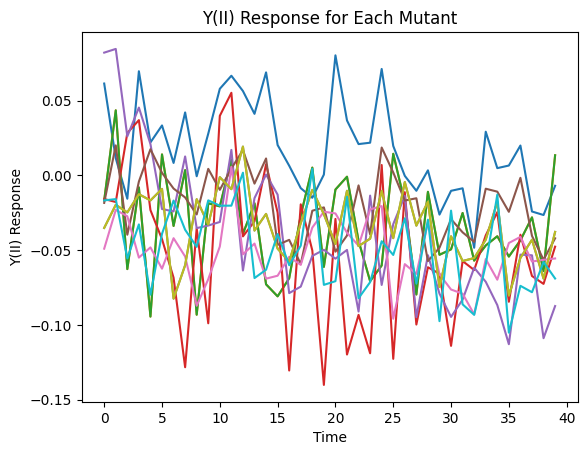

In [838]:
Data_analysis_func.plot_y2(data_norm_flagged[data_norm_flagged['light_regime'] == '20h_HL'].iloc[:10])

In [1081]:
# create a df with the generated tim-series and a label for each of them
data_flat = pd.DataFrame(flat_series, columns=[f'y2_{i}' for i in range(length_of_series)])
data_flat['type'] = 'flat'

data_decreasing = pd.DataFrame(decreasing_series, columns=[f'y2_{i}' for i in range(length_of_series)])
data_decreasing['type'] = 'decreasing'

data_rising = pd.DataFrame(rising_series, columns=[f'y2_{i}' for i in range(length_of_series)])
data_rising['type'] = 'rising'

# combine the dataframes
data_synthetic = pd.concat([data_flat, data_decreasing, data_rising], ignore_index=True)

data_synthetic_y2 = data_synthetic.filter(like='y2_').values
data_synthetic_smoothed_y2 = np.apply_along_axis(Feature_engineering.local_smooth, 1, data_synthetic_y2, d=1, sigma=30)
data_synthetic_smoothed = data_synthetic.copy()
data_synthetic_smoothed[data_synthetic.columns[:-1]] = data_synthetic_smoothed_y2

features_synthetic = data_synthetic.filter(like='y2_').values
features_synthetic_smoothed = data_synthetic_smoothed.filter(like='y2_').values

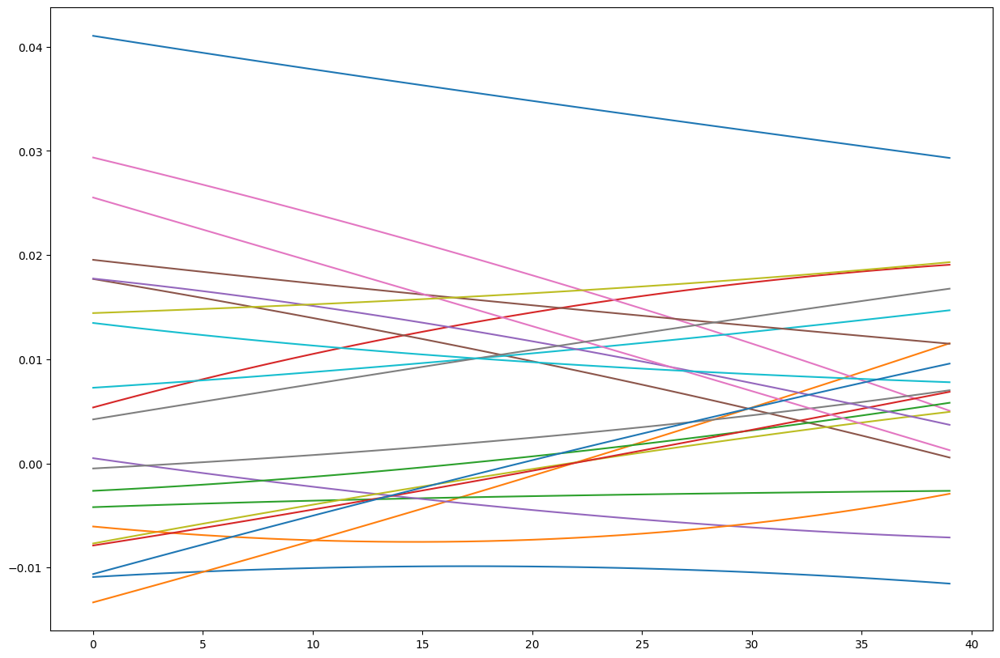

In [1082]:
# plot the smoothed time-series
plt.figure(figsize=(15, 10))
for i in range(len(features_synthetic_smoothed)):
    plt.plot(features_synthetic_smoothed[i])
    if i==20:
        break

plt.show()

In [1039]:
features_synthetic

array([[-0.02969876, -0.03015238, -0.00757001, ..., -0.02872172,
        -0.013152  , -0.03814056],
       [ 0.02691695,  0.00502477,  0.01119928, ...,  0.03565852,
         0.01659755,  0.0217671 ],
       [-0.02843996, -0.01545114, -0.01831736, ..., -0.00057476,
        -0.04734604, -0.03203776],
       ...,
       [ 0.18331627,  0.22031979,  0.22191585, ...,  0.2159285 ,
         0.24447414,  0.24128002],
       [ 0.23619807,  0.24904053,  0.26121844, ...,  0.28301721,
         0.27405459,  0.22728515],
       [ 0.17322472,  0.17673487,  0.17905318, ...,  0.25099365,
         0.21986311,  0.2119506 ]])

In [1083]:
# do pca
pca_synthetic = PCA(n_components=2)
pca_synthetic_smoothed = PCA(n_components=2)
features_pca_synthetic = pca_synthetic.fit_transform(features_synthetic)
features_pca_synthetic_smoothed = pca_synthetic_smoothed.fit_transform(features_synthetic_smoothed)

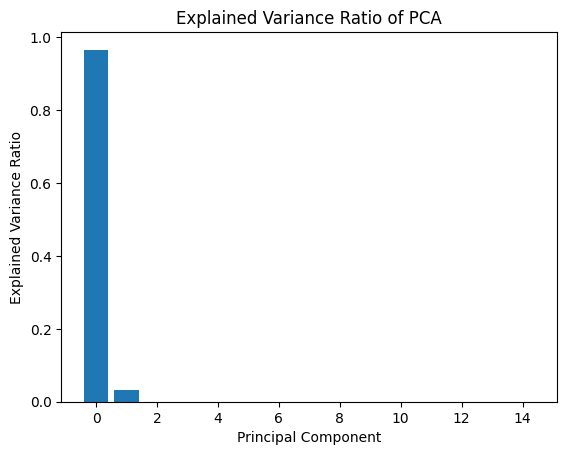

In [886]:
pca_synthetic = PCA(n_components=15)
features_pca_synthetic = pca_synthetic.fit_transform(features_synthetic)

# Plot the explained variance ratio
plt.bar(range(15), pca_synthetic.explained_variance_ratio_)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio of PCA')
plt.show()

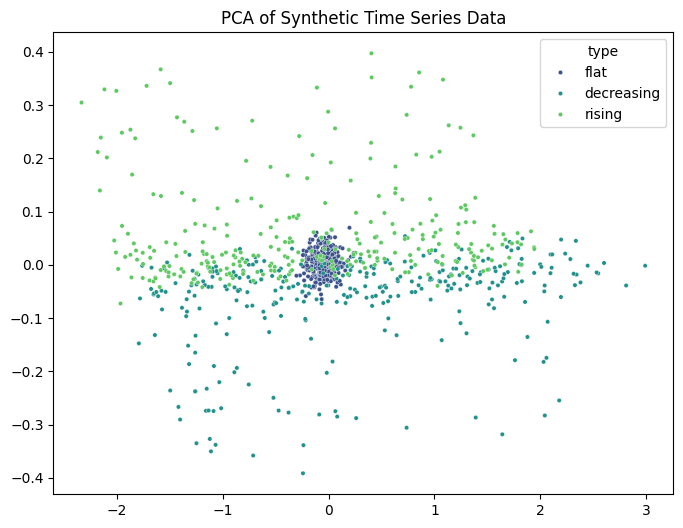

In [1084]:
# plot the pca
plt.figure(figsize=(8, 6))
sns.scatterplot(x=features_pca_synthetic_smoothed[:, 0], y=features_pca_synthetic_smoothed[:, 1], hue=data_synthetic_smoothed['type'], palette='viridis', s=10)
plt.title('PCA of Synthetic Time Series Data')
plt.show()

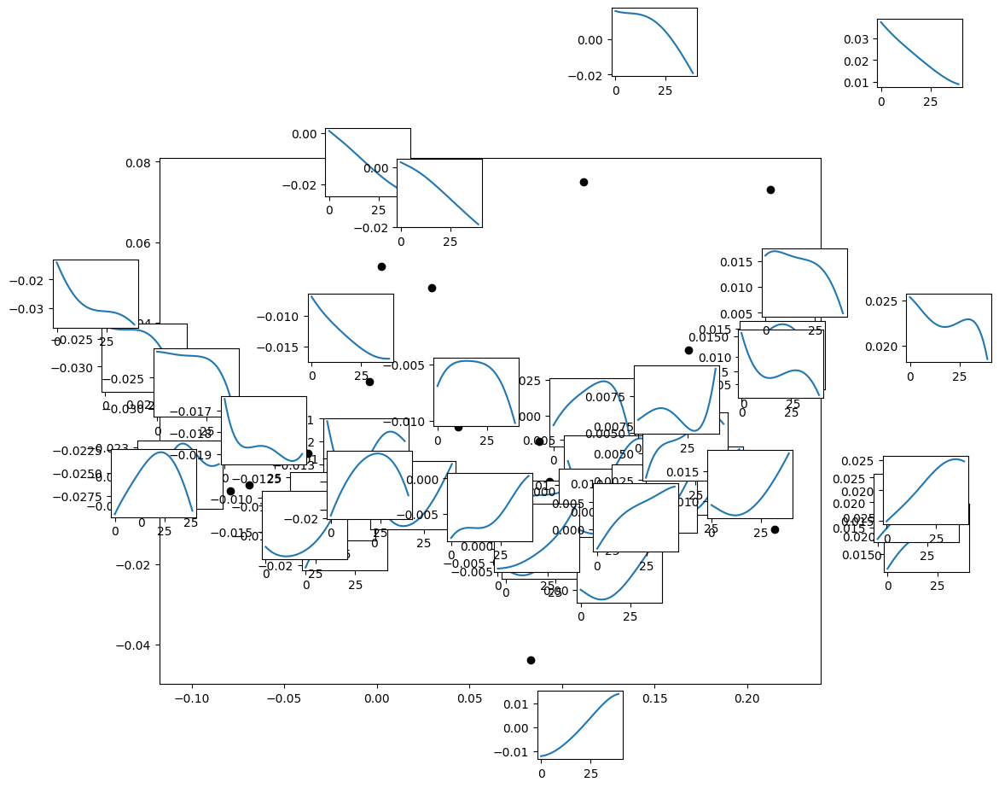

In [985]:
N=40

fig, ax = plt.subplots(figsize=(10, 8))

# scatter = ax.scatter(features_kpca[:, 0], features_kpca[:, 1], c='blue', s=10)

for i in range(40):
    # Plot the original time-series at the position of the PCA result
    ax.plot(features_pca_synthetic_smoothed[i, 0], features_pca_synthetic_smoothed[i, 1], 'ko')  # Mark the point with a black dot
    
    # Add a subplot at the PCA position to display the original time-series
    x_pos = (features_pca_synthetic_smoothed[i, 0] - features_pca_synthetic_smoothed[:, 0][:N].min())/(features_pca_synthetic_smoothed[:, 0][:N].max() - features_pca_synthetic_smoothed[:, 0][:N].min())
    y_pos = (features_pca_synthetic_smoothed[i, 1] - features_pca_synthetic_smoothed[:, 1][:N].min())/(features_pca_synthetic_smoothed[:, 1][:N].max() - features_pca_synthetic_smoothed[:, 1][:N].min())
    rect = [x_pos, y_pos, 0.1, 0.1]
    ax_inset = fig.add_axes(rect)
    ax_inset.plot(features_synthetic_smoothed[i])
    # ax_inset.set_title(f'Time-series {i}')
    # ax_inset.axis('off')  # Turn off axes for the inset plot

# plt.xlabel('PCA Component 1')
# plt.ylabel('PCA Component 2')
# plt.title('PCA of Time-Series Data with Original Time-Series')

# plt.tight_layout()
plt.show()

In [892]:
from sklearn.manifold import MDS
# subsample each time-series of features_HL
subsampling_rate = 4
features_synthetic_subsampled = features_synthetic[:, ::subsampling_rate]

distance_matrix = np.zeros((features_synthetic.shape[0], features_synthetic.shape[0]))
for i in range(features_synthetic.shape[0]):
    for j in range(features_synthetic.shape[0]):
        distance_matrix[i, j] = np.linalg.norm(features_synthetic_subsampled[i] - features_synthetic_subsampled[j])

mds = MDS(n_components=2, dissimilarity='precomputed')
features_red = mds.fit_transform(distance_matrix)

In [1085]:
from sklearn.manifold import MDS
# subsample each time-series of features_HL
subsampling_rate = 4
features_synthetic_subsampled_smoothed = features_synthetic_smoothed[:, ::subsampling_rate]

distance_matrix_smoothed = np.zeros((features_synthetic_smoothed.shape[0], features_synthetic_smoothed.shape[0]))
for i in range(features_synthetic_smoothed.shape[0]):
    for j in range(features_synthetic_smoothed.shape[0]):
        distance_matrix_smoothed[i, j] = dtw.distance(np.gradient(features_synthetic_subsampled_smoothed[i]), np.gradient(features_synthetic_subsampled_smoothed[j]))

mds = MDS(n_components=2, dissimilarity='precomputed')
features_red_smoothed = mds.fit_transform(distance_matrix_smoothed)

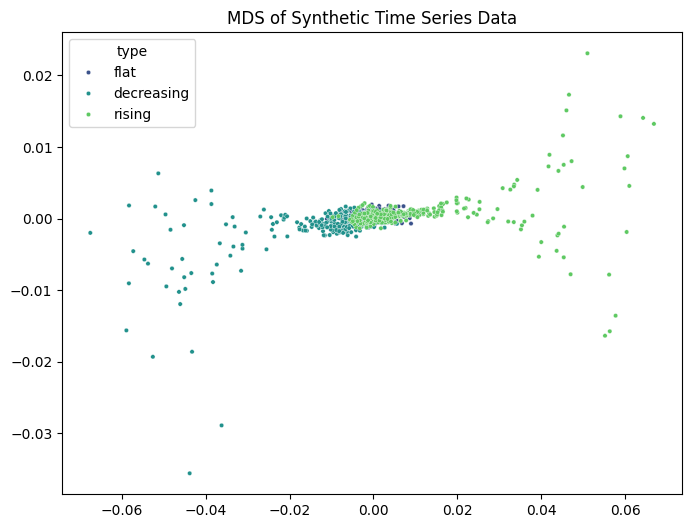

In [1086]:
# plot the pca
plt.figure(figsize=(8, 6))
sns.scatterplot(x=features_red_smoothed[:, 0], y=features_red_smoothed[:, 1], hue=data_synthetic_smoothed['type'], palette='viridis', s=10)
plt.title('MDS of Synthetic Time Series Data')
plt.show()

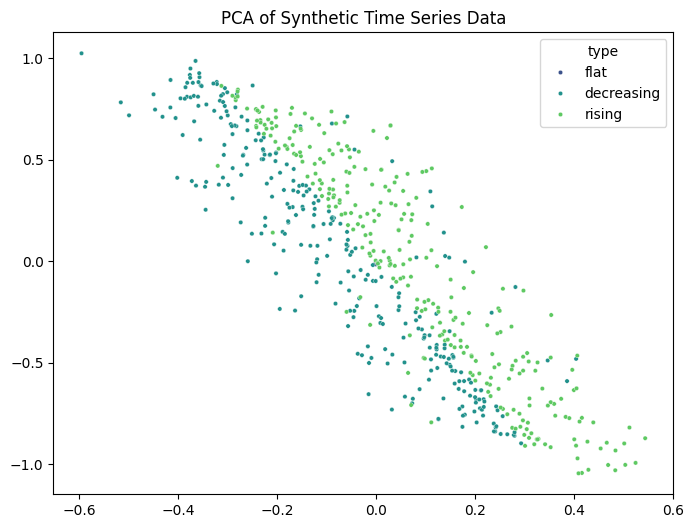

In [1074]:
# plot the pca
plt.figure(figsize=(8, 6))
sns.scatterplot(x=features_red[:, 0], y=features_red[:, 1], hue=data_synthetic['type'], palette='viridis', s=10)
plt.title('PCA of Synthetic Time Series Data')
plt.show()

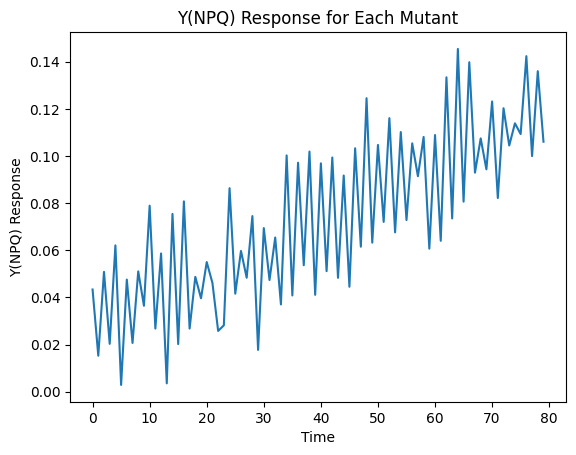

In [ ]:
Data_analysis_func.plot_ynpq(data_norm_flagged[data_norm_flagged['outlier_divergent_end_down_y2'] == True].sort_values(by='sum_end_down_y2', ascending=False).iloc[:1])

In [594]:
import scipy.linalg.interpolative as sli

# Perform Interpolative Decomposition
k = 3  # Desired rank for the approximation
idx, B = sli.interp_decomp(features_synthetic.T, k)

# # Extract the selected columns
# C = features_synthetic[:, idx[:k]]

# # Compute the approximate matrix using ID
# A_approx = np.dot(C, B)

In [599]:
C = features_synthetic[idx[:k], :]

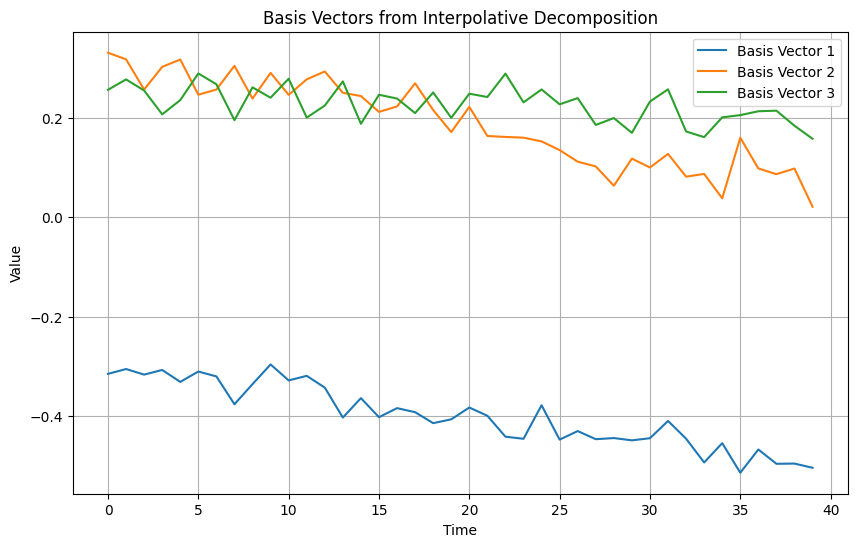

In [601]:
import matplotlib.pyplot as plt

# Plot the basis vectors
plt.figure(figsize=(10, 6))

for i in range(k):
    plt.plot(C[i], label=f'Basis Vector {i+1}')

plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Basis Vectors from Interpolative Decomposition')
plt.legend()
plt.grid(True)
plt.show()

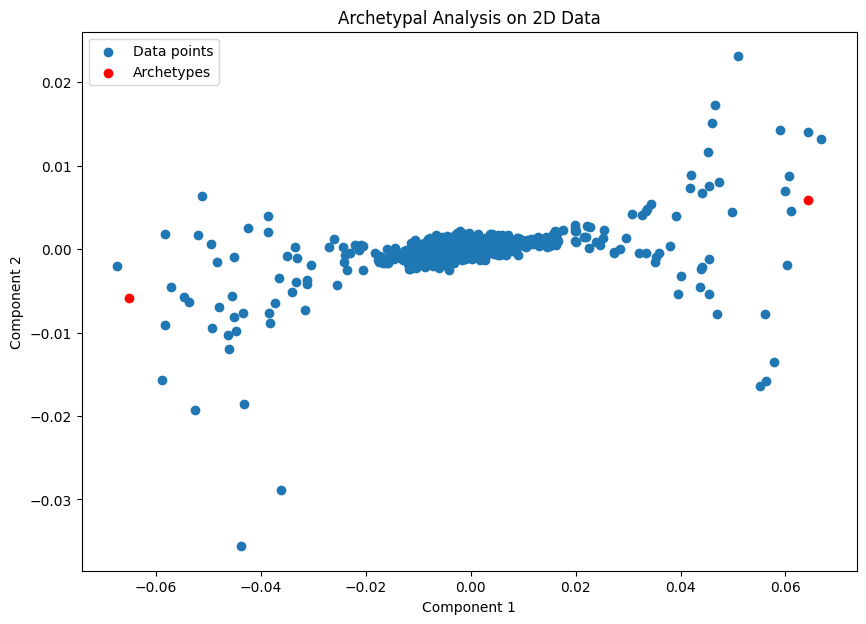

Text(0.5, 1.0, 'Closest Time Series to Archetypes')

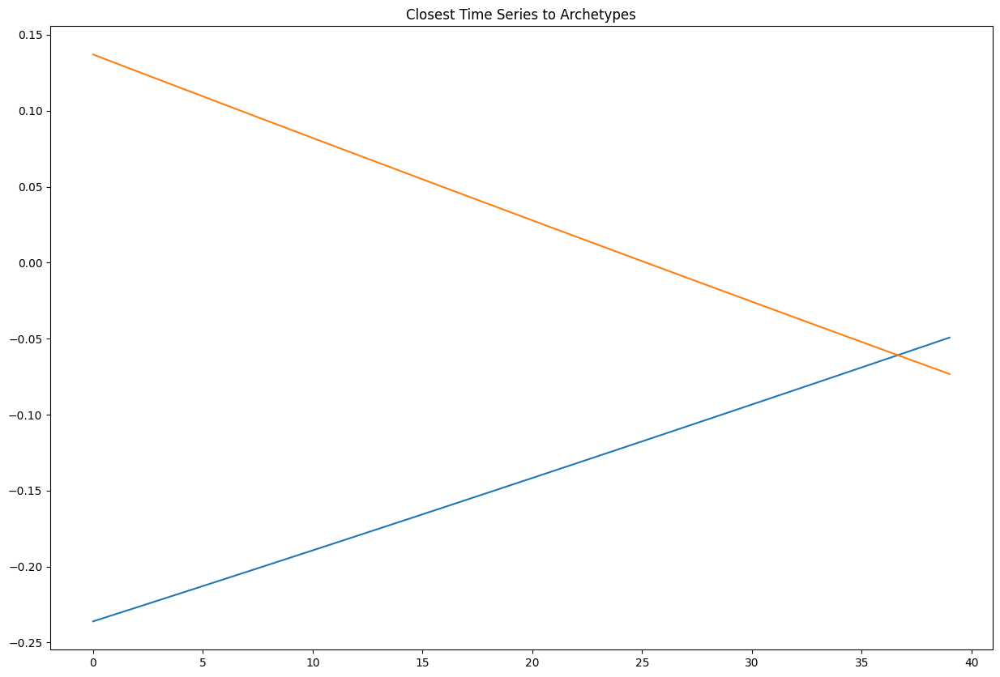

In [1089]:
from archetypes import AA

n_archetypes = 2

# Perform AA
aa = AA(n_archetypes)
aa.fit(features_red_smoothed)
archetypes = aa.archetypes_

# Step 3: Plot the 2D data points and archetypes
plt.figure(figsize=(10, 7))
plt.scatter(features_red_smoothed[:, 0], features_red_smoothed[:, 1], label='Data points')
plt.scatter(archetypes[:, 0], archetypes[:, 1], color='red', label='Archetypes')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Archetypal Analysis on 2D Data')
plt.legend()
plt.show()

# plot the associated y2 ts to the archetypes
# Get the closest data points to each archetype
closest_points = []
for archetype in archetypes:
    closest_point = np.argmin(np.linalg.norm(features_red_smoothed - archetype, axis=1))
    closest_points.append(closest_point)

# Plot the closest time series to each archetype
plt.figure(figsize=(15, 10))
for i, closest_point in enumerate(closest_points):
    plt.plot(features_synthetic_smoothed[closest_point], label=f'Closest to Archetype {i+1}')
plt.title('Closest Time Series to Archetypes')

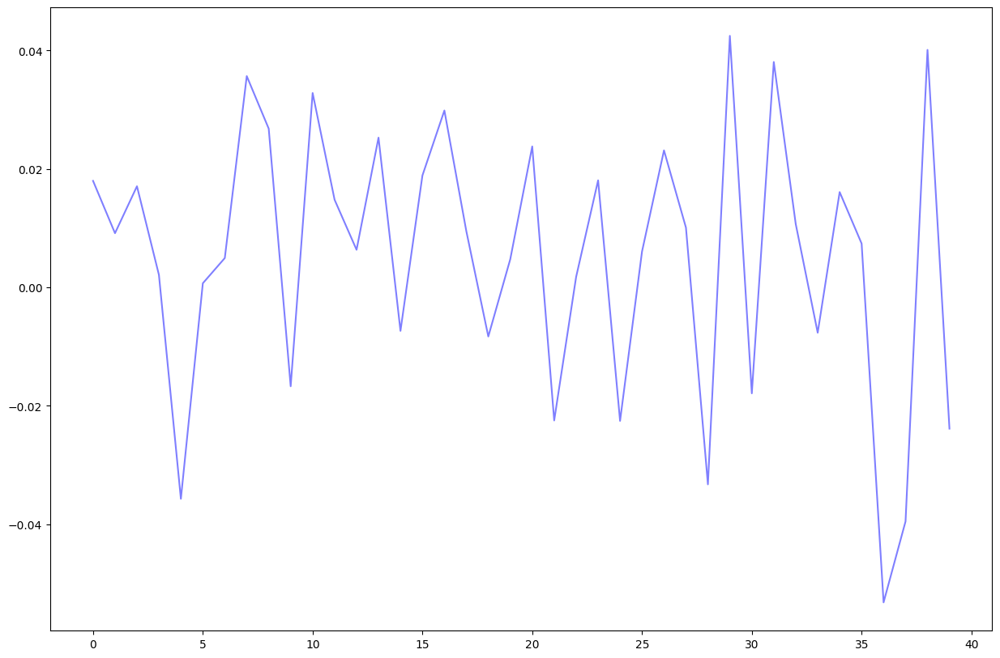

In [581]:
# plot time series data
plt.figure(figsize=(15, 10))

for series in features_synthetic:
    plt.plot(features_synthetic[0, :], color='blue', alpha=0.5)
    break